# import packges

In [19]:
library(DESeq2)
library(data.table)
library(dplyr)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(GSVA)
library(ggplot2)
library(survival)
library(survminer)
library(gridExtra)
library(RColorBrewer)
library(IRdisplay)
library(GGally)
library(ChIPpeakAnno)
library(universalmotif)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(ggraph)
library(tidygraph)
library(readxl)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
#library(venneuler)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(RSQLite)

library(edgeR)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

source('~/script/utils.r')
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/'
setwd(base_dir)

data_dir = '/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/' 
PP = 'beat'


In [4]:
aml_genes = c('TET2',  'DNMT3A',  'SF3B1',  'TP53',  'PPM1D',  'ASXL1',  'NRAS', 
  'JAK2',  'GNB1',  'KRAS',  'CBL',  'IDH1',  'IDH2') 


# design table

In [8]:
dsn = fread(paste0('bam_list'), header = F)
setnames(dsn, 1, 'bam_ori_file')
dsn = dsn[grep('LAML', bam_ori_file), ]
dsn[, id := sub('.rna_seq.genomic.gdc_realn.bam', '', basename(bam_ori_file)) ]
dim(dsn)
head(dsn)


[1] 151   2

bam_ori_file,id
<chr>,<chr>
/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/24125fc9-e366-49a0-a35f-004bfabd559b.rna_seq.genomic.gdc_realn.bam,24125fc9-e366-49a0-a35f-004bfabd559b
/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/3a91981c-57c8-4108-823b-e3f31639b11d.rna_seq.genomic.gdc_realn.bam,3a91981c-57c8-4108-823b-e3f31639b11d
/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/fccd7f45-7747-438e-b153-0758b11dcef7.rna_seq.genomic.gdc_realn.bam,fccd7f45-7747-438e-b153-0758b11dcef7
/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/4ba32010-a5fc-4c0c-b10e-264c41bfdde1.rna_seq.genomic.gdc_realn.bam,4ba32010-a5fc-4c0c-b10e-264c41bfdde1
/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/24fb0f49-d3c2-4072-ac1f-8d5b4af80a54.rna_seq.genomic.gdc_realn.bam,24fb0f49-d3c2-4072-ac1f-8d5b4af80a54
/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/cc3016ae-9d36-49c1-8cf5-a6a1f200f52c.rna_seq.genomic.gdc_realn.bam,cc3016ae-9d36-49c1-8cf5-a6a1f200f52c


In [9]:
cmd = paste0('samtools view -H ', dsn$bam_ori_file, ' |grep "@RG" | sed "s/.*SM:\\(TCGA.*\\)\\tLB.*/\\1/g" | uniq >> sample_name')

In [10]:
write(cmd, file = 'run_sample_name.sh')

In [11]:
dsn$sample_name = fread('sample_name', header = F)$V1

In [12]:
base_dir

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/"

In [13]:
dsn[, sample_dir := paste0(base_dir, sample_name, '/') ]
dsn[, sample_pre := paste0(sample_dir, sample_name) ]

In [57]:
inv = dsn[, {dir.create(sample_dir)}, by = 1:nrow(dsn) ]

# load data

In [9]:
getwd()

[1] "/research/rgs01/home/clusterHome/whu78/script/dataset"

In [66]:
logcpm_3cohorts_t = fread(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/data/batch_corrected_normalized_3cohort_with_basic_clinical_info.tsv')


In [67]:
head(logcpm_3cohorts_t)

rn,UBE2Q2P2,HMGB1P1,RNU12-2P,EFCAB8,SDR16C6P,HSPB1P1,PPBPP1,GTPBP6,EFCAB12,⋯,ZYX,ZZEF1,ZZZ3,AKR1C6P,batch,OS_STATUS,OS_MONTHS,MLL_re,FLT3ITD,AML1ETO
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
BA2000R,0.02926131,0.4846250,0.18884637,0.1122339,0,0.1122339,0,3.915470,1.897842,⋯,5.936752,5.347596,4.340146,0.02926131,BeatAML,1,20.925620,WT,FLT3-ITD,WT
BA2003R,0.90268049,0.4228661,0.03690553,0.3191444,0,0.2034060,0,4.137656,2.575903,⋯,6.346626,5.543146,4.113977,0.29144123,BeatAML,1,8.495868,WT,FLT3-ITD,WT
BA2004R,0.75782187,0.3605750,0.02383337,1.0413694,0,0.5444091,0,3.834550,2.075757,⋯,5.726868,6.153414,4.082155,0.06986087,BeatAML,1,11.272727,WT,WT,WT
BA2011R,0.70116448,0.3463987,0.17241135,1.5996898,0,0.1069691,0,4.180953,1.780018,⋯,6.844946,6.058742,3.713674,0.03694244,BeatAML,0,10.115702,WT,WT,WT
BA2019R,1.26473146,1.5293057,0.00000000,0.2096319,0,1.3346557,0,3.955835,2.087743,⋯,5.448280,5.146951,4.385431,1.17524927,BeatAML,1,5.586777,WT,WT,WT
BA2020R,0.53412315,1.2472955,0.18373763,0.2167557,0,0.1320719,0,4.130938,2.337846,⋯,5.134402,4.768515,4.534286,0.00000000,BeatAML,0,25.190083,WT,FLT3-ITD,WT


In [68]:
logcpm_tcga_t = logcpm_3cohorts_t[grep('TCGA', rn), ]
logcpm_tcga_t[1:3, 1:10]

rn,UBE2Q2P2,HMGB1P1,RNU12-2P,EFCAB8,SDR16C6P,HSPB1P1,PPBPP1,GTPBP6,EFCAB12
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2803-03,0.0000000,0.6674881,0.3413587,0.00000000,0,0.5176600,0,3.988230,0.6320827
TCGA-AB-2805-03,0.0000000,0.7436019,0.3462896,0.06669431,0,0.1292173,0,3.706865,1.9360481
TCGA-AB-2806-03,0.8271418,0.9587626,0.1764846,1.13885047,0,0.1764846,0,2.791938,0.9831286


In [57]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml"

In [69]:
#count_df_te = read.table(file = 'count_df_te.tsv', sep = '\t')
#count_df_coding = read.table(file = 'count_df_coding.tsv', sep = '\t')
#count_dt_sel2_df = read.table(file = 'count_dt_sel2_df.tsv', sep = '\t')

logcpm_replase_local_te = read.table(file = '../relapse/logcpm_replase_local_te.tsv', sep = '\t')
logcpm_replase_coding = read.table(file = '../relapse/logcpm_replase_coding.tsv', sep = '\t')
logcpm_replase_te = read.table(file = '../relapse/logcpm_replase_te.tsv', sep = '\t')

deg_relapse_coding = read.table(file = '../relapse/deg_relapse_coding.tsv', sep = '\t')
deg_relapse_te = read.table(file = '../relapse/deg_relapse_te.tsv', sep = '\t')
deg_relapse_local_te = read.table(file = '../relapse/deg_relapse_local_te.tsv', sep = '\t')

tecount_relapse_sel = read.table(file = '../relapse/tecount_relapse_sel.tsv', sep = '\t')
telocal_relapse_sel = read.table(file = '../relapse/telocal_relapse_sel.tsv', sep = '\t')

tecount_relapse_sel = as.data.table(tecount_relapse_sel)
telocal_relapse_sel = as.data.table(telocal_relapse_sel)


In [19]:
telocal_relapse_sel

rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
MER34B-int:ERV1:LTR,-1.2598763,11.936033,3.046357e-05,0.01290234,LTR,ERV1,MER34B-int
MER61F:ERV1:LTR,-0.9363334,9.101731,5.124604e-05,0.01290234,LTR,ERV1,MER61F
LTR12C:ERV1:LTR,-1.4863020,14.276986,6.612084e-04,0.05683418,LTR,ERV1,LTR12C
LTR43-int:ERV1:LTR,0.9056203,7.452546,1.335299e-03,0.08851699,LTR,ERV1,LTR43-int
MER57F:ERV1:LTR,-1.1333632,10.610649,1.780049e-03,0.08851699,LTR,ERV1,MER57F
LTR54:ERV1:LTR,-0.7126964,10.651244,2.258450e-03,0.10050158,LTR,ERV1,LTR54
HERV-Fc1-int:ERV1:LTR,0.9123125,9.050033,3.314395e-03,0.11331087,LTR,ERV1,HERV-Fc1-int
MamGypLTR4:Gypsy:LTR,-0.7527141,7.824582,4.911494e-03,0.14362012,LTR,Gypsy,MamGypLTR4
LTR7Y:ERV1:LTR,-0.7806781,9.039026,4.988633e-03,0.14362012,LTR,ERV1,LTR7Y


In [70]:
deg_telocal_MEPCMP = readRDS(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/deg_telocal_MEPCMP.rds')
deg_MEPCMP = fread(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/deg_MEPCMP15Jul.tsv')



In [110]:
head(deg_telocal_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_local_MEP__EB,MSTD_dup4711:MSTD:ERVL-MaLR:LTR,15.20494,10.265691,6.851223e-11,2.913003e-06,MEP,EB,LTR,ERVL-MaLR,MSTD,MSTD_dup4711
deg_local_MEP__EB,L1ME3G_dup281:L1ME3G:L1:LINE,13.27746,8.341317,8.791349e-09,8.317990e-05,MEP,EB,LINE,L1,L1ME3G,L1ME3G_dup281
deg_local_MEP__EB,L1MC5a_dup9954:L1MC5a:L1:LINE,13.32653,8.390285,9.338370e-09,8.317990e-05,MEP,EB,LINE,L1,L1MC5a,L1MC5a_dup9954
deg_local_MEP__EB,L1PA10_dup901:L1PA10:L1:LINE,12.47703,7.543926,8.074005e-08,8.317990e-05,MEP,EB,LINE,L1,L1PA10,L1PA10_dup901
deg_local_MEP__EB,LTR2_dup109:Harlequin-int:ERV1:LTR,14.15036,9.212295,9.138267e-08,8.317990e-05,MEP,EB,LTR,ERV1,Harlequin-int,LTR2_dup109
deg_local_MEP__EB,L1MA4A_dup1872:L1MA4A:L1:LINE,11.97498,7.045052,1.870330e-07,8.317990e-05,MEP,EB,LINE,L1,L1MA4A,L1MA4A_dup1872


# validate bam file

In [14]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, validateBam_jobname := paste0('validateBam_', sample_name) ]
dsn[, validateBam_oo := paste0(sample_pre, '_validateBam.out')]
dsn[, validateBam_er := paste0(sample_pre, '_validateBam.err')]
dsn[, validateBam_cmd := paste0('bsub -J ', validateBam_jobname, ' -n 10 -o ', validateBam_oo, ' -e ', validateBam_er, ' -P beat -n 15 -R "rusage[mem=5GB]" ')]
dsn[, validateBam_cmd := paste0( '  singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/depot.galaxyproject.org-singularity-picard-3.0.0--hdfd78af_1.img ')]
dsn[, validateBam_cmd := paste0(validateBam_cmd, 'picard ValidateSamFile -I ', bam_ori_file, ' -O ', sorted_bam_file, ' --MODE SUMMARY  ') ]

write(dsn[!file.exists(sorted_bam_file), validateBam_cmd], file = 'run_sortbam.sh')


In [15]:
file.size(dsn$sorted_bam_file)


[1]  9651623449  9117628059  9837200922 10046540699  7852177698  9697147703
  [7]  9581889497 10125257198  9332232866  8354397107  8517656615  9044823992
 [13]  6591978975  7941575245  9712925169 10709457530  8648641853  8267406233
 [19] 10261540727  8146156522  9635868836 10282762415  7677810281  7781046169
 [25]  9390994710 10540418024  7486572574  7419223780 11055966174  7289667204
 [31]  7164327948 10457529204  7912684644  8250309717  8563692187 10242841043
 [37]  9265033459  8039981252  8197471052 10319917490  8553291460  8389044366
 [43] 10642951382  8033045780  7451161714  7351812378  7778578837  9536747293
 [49]  8827710492  6464189760 10770519387 10920271019  7844440797  9596761137
 [55]  8765645947  9845135984  9543620781  6901380937  9221391822  8255464956
 [61]  7304516869  8920236799  8476096720  7161878196  9628837074  7663299066
 [67]  9336047478  8668029351  7171610019  8051585925  8306011523 10365818178
 [73]  8698007791  9884808905  9901837948  8158453607 10822760716  8278574984
 [79]  7667614822  7877739582 12096329034 10245744597  8760820613  9452000284
 [85]  9026036604  9835895348 10219168020  7472394344 11187044476  8482175755
 [91]  7692726276  8260641910  9647302978  7469574158  9008522831 10469371780
 [97]  9944884215  8181992687  8344447126  7703943945  8305508260  9973655692
[103]  8949122061  9234725755  9166565536  7351318262  7204665857  7482840480
[109]  9370836605  7170289222  8316361697  8330775238 10452674637  8458142230
[115]  8338520987  9220788224  9224675616  8005852688 10309287434  8694855409
[121]  7736527761  9711836039  9996008137 10330897839  7368047672  7917024436
[127]  9488817037  9057339904  9958475932 10225913847 10871495802  9405715901
[133]  7395689476  9242520245 10195774768  8632905273  9275729211  9003989779
[139] 10227400973  9285633256  7646238300 10774028784 10144449943  7541966729
[145] 10155126501  7952790568 10442305199  9601327509  6824499767  8263586344
[151]  7729643403

In [81]:
file.size(dsn$sorted_bam_file)


[1]  9651623449  9117628059  9837200922 10046540699  7852177698  9697147703
  [7]  9581889497 10125257198  9332232866  8354397107  8517656615  9044823992
 [13]  6591978975  7941575245  9712925169 10709457530  8648641853  8267406233
 [19] 10261540727  8146156522  9635868836 10282762415  7677810281  7781046169
 [25]  9390994710 10540418024  7486572574  7419223780 11055966174  7289667204
 [31]  7164327948 10457529204  7912684644  8250309717  8563692187 10242841043
 [37]  9265033459  8039981252  8197471052 10319917490  8553291460  8389044366
 [43] 10642951382  8033045780  7451161714  7351812378  7778578837  9536747293
 [49]  8827710492  6464189760 10770519387 10920271019  7844440797  9596761137
 [55]  8765645947  9845135984  9543620781  6901380937  9221391822  8255464956
 [61]  7304516869  8920236799  8476096720  7161878196  9628837074  7663299066
 [67]  9336047478  8668029351  7171610019  8051585925  8306011523 10365818178
 [73]  8698007791  9884808905  9901837948  8158453607 10822760716  8278574984
 [79]  7667614822  7877739582 12096329034 10245744597  8760820613  9452000284
 [85]  9026036604  9835895348 10219168020  7472394344 11187044476  8482175755
 [91]  7692726276  8260641910  9647302978  7469574158  9008522831 10469371780
 [97]  9944884215  8181992687  8344447126  7703943945  8305508260  9973655692
[103]  8949122061  9234725755  9166565536  7351318262  7204665857  7482840480
[109]  9370836605  7170289222  8316361697  8330775238 10452674637  8458142230
[115]  8338520987  9220788224  9224675616  8005852688 10309287434  8694855409
[121]  7736527761  9711836039  9996008137 10330897839  7368047672  7917024436
[127]  9488817037  9057339904  9958475932 10225913847 10871495802  9405715901
[133]  7395689476  9242520245 10195774768  8632905273  9275729211  9003989779
[139] 10227400973  9285633256  7646238300 10774028784 10144449943  7541966729
[145] 10155126501  7952790568 10442305199  9601327509  6824499767  8263586344
[151]  7729643403

In [17]:
tail(dsn$sorted_bam_file, 1)

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2821-03A-01T-0735-13/TCGA-AB-2821-03A-01T-0735-13_nameSorted.bam"

# sort bam file by name

In [16]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, sortBam_jobname := paste0('sortBam_', sample_name) ]
dsn[, sortBam_oo := paste0(sample_pre, '_sortBam.out')]
dsn[, sortBam_er := paste0(sample_pre, '_sortBam.err')]
dsn[, sortBam_cmd := paste0('bsub -J ', sortBam_jobname, ' -n 10 -o ', sortBam_oo, ' -W 990 -e ', sortBam_er, ' -P tcga -n 15 -R "rusage[mem=5GB]" ')]
dsn[, sortBam_cmd := paste0(sortBam_cmd, ' " samtools sort -o ', sorted_bam_file, ' -n -@ 14 ', bam_ori_file, '"') ]

write(dsn$sortBam_cmd, file = 'run_sortbam.sh')


In [17]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, sortBam_jobname := paste0('sortBam_', sample_name) ]
dsn[, sortBam_oo := paste0(sample_pre, '_sortBam.out')]
dsn[, sortBam_er := paste0(sample_pre, '_sortBam.err')]
dsn[, sortBam_cmd := paste0('bsub -J ', sortBam_jobname, ' -n 10 -o ', sortBam_oo, ' -W 990 -e ', sortBam_er, ' -P beat -n 15 -R "rusage[mem=5GB]" ')]
dsn[, sortBam_cmd := paste0(sortBam_cmd, ' " singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/depot.galaxyproject.org-singularity-picard-3.0.0--hdfd78af_1.img ')]
dsn[, sortBam_cmd := paste0(sortBam_cmd, 'picard SortSam -I ', bam_ori_file, ' -O ', sorted_bam_file, ' -SORT_ORDER queryname " ') ]

write(dsn[!file.exists(sorted_bam_file), sortBam_cmd], file = 'run_sortbam.sh')


# bam to fastq

In [18]:
dsn[, fq_1 := paste0(sample_pre, '_r1.fastq')]
dsn[, fq_2 := paste0(sample_pre, '_r2.fastq')]

dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, bam2fq_jobname := paste0('bam2fq_', sample_name) ]
dsn[, bam2fq_oo := paste0(sample_pre, '_bam2fq.out')]
dsn[, bam2fq_er := paste0(sample_pre, '_bam2fq.err')]
dsn[, bam2fq_cmd := paste0('bsub -J ', bam2fq_jobname, ' -n 10 -o ', bam2fq_oo, ' -W 99:00 -e ', bam2fq_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, bam2fq_cmd := paste0(bam2fq_cmd, ' " singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/depot.galaxyproject.org-singularity-picard-3.0.0--hdfd78af_1.img ')]
dsn[, bam2fq_cmd := paste0(bam2fq_cmd, ' picard SamToFastq -INPUT ', sorted_bam_file, ' --FASTQ ', fq_1, ' --SECOND_END_FASTQ ', fq_2, '"') ]
write(dsn[, bam2fq_cmd], file = 'run_bam2fq.sh')


In [86]:
dsn[!file.exists(tecount_file), bam2fq_cmd][1]

[1] "bsub -J bam2fq_TCGA-AB-2995-03A-01T-0735-13 -n 10 -o /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2995-03A-01T-0735-13/TCGA-AB-2995-03A-01T-0735-13_bam2fq.out -W 99:00 -e /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2995-03A-01T-0735-13/TCGA-AB-2995-03A-01T-0735-13_bam2fq.err -P beat -n 2 -R \"rusage[mem=5GB]\"  \" singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/depot.galaxyproject.org-singularity-picard-3.0.0--hdfd78af_1.img  picard SamToFastq -INPUT /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2995-03A-01T-0735-13/TCGA-AB-2995-03A-01T-0735-13_nameSorted.bam --FASTQ /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2995-03A-01T-0735-13/TCGA-AB-2995-03A-01T-0735-13_r1.fastq --SECOND_END_FASTQ /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2995-03A-01T-0735-13/TCGA-AB-2995-03A-01T-0735-13_r2.fastq\""

In [19]:
# some samples has multiple fastq files
# which resulted in repeated sequence names
# bedtool bamToFastq work with this situation
# picard doesn't work
dsn[, bam_sorted_repaired_file := sub('.sam$', '_repaired.sam', sorted_bam_file) ]

dsn[, bam3fq_jobname := paste0('bam3fq_', sample_name) ]
dsn[, bam3fq_oo := paste0(sample_pre, '_bam3fq.out')]
dsn[, bam3fq_er := paste0(sample_pre, '_bam3fq.err')]
dsn[, bam3fq_cmd := paste0('bsub -J ', bam3fq_jobname, ' -n 10 -o ', bam3fq_oo, ' -W 99:00 -e ', bam3fq_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, bam3fq_cmd := paste0(bam3fq_cmd, ' " bamToFastq -i ', sorted_bam_file, ' -fq ', fq_1, ' -fq2 ', fq_2, '"')]
write(dsn[, bam3fq_cmd], file = 'run_bam3fq.sh')


# compress fastq

In [21]:
dsn[, fq_1_gz := paste0(sample_pre, '_r1.fastq.gz')]
dsn[, fq_2_gz := paste0(sample_pre, '_r2.fastq.gz')]


In [22]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, fq1_gzip_jobname := paste0('fq1_gzip_', sample_name) ]
dsn[, fq1_gzip_oo := paste0(sample_pre, '_fq1_gzip.out')]
dsn[, fq1_gzip_er := paste0(sample_pre, '_fq1_gzip.err')]
dsn[, fq1_gzip_cmd := paste0('bsub -J ', fq1_gzip_jobname, ' -n 10 -o ', fq1_gzip_oo, ' -W 990 -e ', fq1_gzip_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, fq1_gzip_cmd := paste0(fq1_gzip_cmd, ' " gzip ', fq_1, ' "')]
write(dsn[, fq1_gzip_cmd], file = 'run_fq1_gzip.sh')


In [23]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, fq2_gzip_jobname := paste0('fq2_gzip_', sample_name) ]
dsn[, fq2_gzip_oo := paste0(sample_pre, '_fq2_gzip.out')]
dsn[, fq2_gzip_er := paste0(sample_pre, '_fq2_gzip.err')]
dsn[, fq2_gzip_cmd := paste0('bsub -J ', fq2_gzip_jobname, ' -n 10 -o ', fq2_gzip_oo, ' -W 990 -e ', fq2_gzip_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, fq2_gzip_cmd := paste0(fq2_gzip_cmd, ' " gzip ', fq_2, ' "')]
write(dsn[, fq2_gzip_cmd], file = 'run_fq2_gzip.sh')


In [30]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml"

In [101]:
all(file.size(dsn$fq_1_gz) > 100000)
all(file.size(dsn$fq_2_gz) > 100000)


[1] TRUE

[1] TRUE

# align

In [25]:
# module load star/2.7.10a
REFERENCE_GENOME="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF"
REFERENCE_GENOME_FASTA='/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa'
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"


dsn[, star_jobname := paste0('star_', sample_name)]
dsn[, star_oo := paste0(sample_pre, 'star_out')]
dsn[, star_eo := paste0(sample_pre, 'star_err')]
dsn[, bam_prefix := paste0(sample_pre, '_')]
dsn[, bam_file := paste0(bam_prefix, 'Aligned.sortedByCoord.out.bam')]
#alignments/A549_0_1 Aligned.sortedByCoord.out.bam

dsn[, star_cmd := paste0('bsub -J ', star_jobname, ' -o ', star_oo, ' -e ', star_eo, ' -P ', PP, ' -n 30 -R "rusage[mem=5GB]" ')]
#dsn[, star_cmd := paste0(star_cmd, ' -w ', cutadapt_jobname)]
dsn[, star_cmd := paste0(star_cmd, ' -W 99:00')]
dsn[, star_cmd := paste0(star_cmd, ' " STAR --genomeDir ', REFERENCE_GENOME)] 
dsn[, star_cmd := paste0(star_cmd, ' --runThreadN 28 --outSAMtype BAM SortedByCoordinate --outFilterMultimapNmax 1000 --outSAMmultNmax 1 ')]
dsn[, star_cmd := paste0(star_cmd, ' --outFilterMismatchNmax 3 --outMultimapperOrder Random --winAnchorMultimapNmax 1000 --alignEndsType EndToEnd ')]
dsn[, star_cmd := paste0(star_cmd, ' --alignIntronMax 1 --alignMatesGapMax 350 --quantMode TranscriptomeSAM --readFilesIn ', fq_1_gz, ' ', fq_2_gz, ' ')]
#dsn[, star_cmd := paste0(star_cmd, ' --alignIntronMax 1 --alignMatesGapMax 350 --quantMode TranscriptomeSAM --readFilesIn ', fastq_r1_trimmed, ' ', fastq_r2_trimmed, ' ')]
dsn[, star_cmd := paste0(star_cmd, ' --readFilesCommand zcat --outFileNamePrefix ', bam_prefix, '"')]

write(dsn[, star_cmd], file = paste0(base_dir, 'run_tcga_star.sh'))

#STAR --genomeDir $REFERENCE_GENOME \
#                --runThreadN 28 --outSAMtype BAM SortedByCoordinate --outFilterMultimapNmax 1000 --outSAMmultNmax 1 \
#                --outFilterMismatchNmax 3 --outMultimapperOrder Random --winAnchorMultimapNmax 1000 --alignEndsType EndToEnd \
#                --alignIntronMax 1 --alignMatesGapMax 350 --quantMode TranscriptomeSAM --readFilesIn "$R1_FILE" "$R2_FILE" --readFilesCommand zcat \
#                --outFileNamePrefix "$OUTPUT_DIR/${SAMPLE_NAME}_"

# TEcount

In [26]:
dsn[, tecount_file := paste0(sample_dir, 'tecount.cntTable')]

GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"
bin_tecount = '/home/whu78/conda3/envs/te/bin/'

dsn[, tecount_jobname := paste0('tecount_', sample_name)]
dsn[, tecount_oo := paste0(sample_pre, '_tecount_out')]
dsn[, tecount_eo := paste0(sample_pre, '_tecount_err')]

dsn[, tecount_cmd := paste0('bsub -J ', tecount_jobname, ' -n 10 -o ', tecount_oo, ' -e ', tecount_eo, ' -P ', PP, ' -R "rusage[mem=5GB]" ')]
dsn[, tecount_cmd := paste0(tecount_cmd, ' -W 999:00')]
dsn[, tecount_cmd := paste0(tecount_cmd, ' " cd ', sample_dir, ' && ', bin_tecount, 'TEcount --sortByPos --format BAM --mode multi -b ', bam_file)] 
dsn[, tecount_cmd := paste0(tecount_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_GTF_FILE, ' --project tecount "')] 

write(dsn[, tecount_cmd], file = paste0(base_dir, 'run_tcga_tecount.sh'))


In [32]:
file.exists(dsn$tecount_file)
file.size(dsn$tecount_file)

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [91] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[106] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[121] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[136] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[151] TRUE

[1] 832258 832202 834241 838303 835829 836505 832378 833748 833894 832506
 [11] 840988 834320 833518 836427 837937 833585 833829 835863 835866 835262
 [21] 830986 840082 832161 838356 834582 835110 834785 834835 833682 836340
 [31] 834943 838222 832152 836605 835252 834897 833132 834492 835253 835039
 [41] 837346 836022 835803 836660 834494 834438 836445 838761 837810 830327
 [51] 835883 839081 835772 831647 837584 832889 831034 832472 834357 837065
 [61] 831343 834110 836179 827498 835266 836494 837627 835009 834526 835426
 [71] 833531 833790 838409 829942 833946 833193 833191 837634 833875 832837
 [81] 832780 834592 837477 835160 836705 836457 834079 834115 837495 829477
 [91] 834861 834042 835805 832239 836584 831503 835384 835744 833350 834787
[101] 838952 837043 835964 833123 831393 833573 835059 837098 836567 833143
[111] 833859 835883 832688 835310 835987 828861 833440 833288 835453 836076
[121] 837322 834941 840051 833824 835102 834422 835837 838027 834089 832483
[131] 837714 831045 836179 834812 833519 835856 834982 837840 838942 835934
[141] 833673 836392 835389 834649 835930 834268 835402 834493 834143 835880
[151] 837742

In [31]:
head(dsn$tecount_file, 1)


[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2914-03A-01T-0734-13/tecount.cntTable"

# TElocal

In [27]:
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE = '/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf'
TE_loc_GTF_FILE = '/research/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/T2T_CHM13_v2_rmsk_TE.gtf.locInd'

sif_telocal = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/telocal.sif'
bin_telocal = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/conda3/envs/snap/bin/'
exe_telocal = '/home/whu78/repos/TElocal/TElocal'
exe_telocal = '/home/whu78/conda3/envs/te/bin/TElocal'

dsn[, telocal_jobname := paste0('telocal_', sample_name)]
dsn[, telocal_oo := paste0(sample_pre, '_telocal_out')]
dsn[, telocal_eo := paste0(sample_pre, '_telocal_err')]

dsn[, telocal_cmd := paste0('bsub -J ', telocal_jobname, ' -n 10 -o ', telocal_oo, ' -e ', telocal_eo, ' -P ', PP, ' -R "rusage[mem=5GB]" ')]
dsn[, telocal_cmd := paste0(telocal_cmd, ' -W 999:00')]
dsn[, telocal_cmd := paste0(telocal_cmd, ' " cd ', sample_dir, ' && ', exe_telocal, ' --sortByPos -b ', bam_file)] 
dsn[, telocal_cmd := paste0(telocal_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_loc_GTF_FILE, ' --stranded reverse --project telocal "')] 

#write(dsn[, telocal_cmd], file = paste0(base_dir, 'run_beat_telocal.sh'))
write(dsn[, telocal_cmd], file = paste0(base_dir, 'run_tcga_telocal.sh'))


In [77]:
dsn[, telocal_file := paste0(sample_dir, 'telocal.cntTable')]


In [78]:
head(dsn$telocal_file, 1)
file.exists(dsn$telocal_file)
file.size(dsn$telocal_file)

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2914-03A-01T-0734-13/telocal.cntTable"

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [91] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[106] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[121] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[136] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[151] TRUE

[1] 125302705 125244323 125314244 125220419 125254159 125278985 125259563
  [8] 125281823 125288151 125188867 125286762 125283523 125242769 125209593
 [15] 125221615 125232752 125258000 125189721 125229405 125223288 125278588
 [22] 125234773 125220924 125220412 125237559 125234648 125204758 125265795
 [29] 125138604 125278613 125228457 125238793 125227265 125248268 125225776
 [36] 125289617 125293747 125204498 125219550 125230684 125219417 125255062
 [43] 125299046 125224554 125294453 125226992 125252371 125280213 125241164
 [50] 125146821 125289101 125256903 125180723 125267998 125243454 125283640
 [57] 125222094 125150005 125145652 125227035 125195410 125285203 125196421
 [64] 125157520 125259935 125226622 125295618 125238675 125273165 125254678
 [71] 125214914 125208263 125264709 125312521 125199241 125251705 125229394
 [78] 125173654 125217442 125204633 125153124 125216879 125242299 125261368
 [85] 125224042 125216299 125260220 125205082 125266246 125188956 125213485
 [92] 125241073 125232997 125211145 125221517 125130077 125289384 125248860
 [99] 125240601 125220498 125220820 125301567 125243044 125294706 125231479
[106] 125237244 125207606 125224372 125180038 125186073 125258709 125259964
[113] 125209464 125122530 125186666 125204992 125267572 125220732 125307472
[120] 125248189 125224279 125315399 125255958 125243244 125223228 125242549
[127] 125292689 125249101 125225165 125289129 125230434 125275422 125245496
[134] 125299757 125309649 125239810 125298805 125256672 125199762 125236821
[141] 125205505 125273743 125261000 125225898 125221094 125243621 125281966
[148] 125197925 125165776 125230294 125280974

# read tecount file

In [46]:
count_list = lapply(dsn[, tecount_file], function(fname){
    tmp = fread(fname)
    setnames(tmp, 1, 'gene') 
    setnames(tmp, 2, 'value')
    tmp
})
names(count_list) = dsn[, sample_name]


In [47]:
count_dt = rbindlist(count_list, idcol = T)
count_dt = dcast(formula = gene ~ .id, value.var = 'value', count_dt) 
count_df = setDF(count_dt[, 2:ncol(count_dt)], rownames = count_dt$gene)
head(count_df)


,TCGA-AB-2805-03A-01T-0734-13,TCGA-AB-2806-03A-01T-0734-13,TCGA-AB-2808-03A-01T-0734-13,TCGA-AB-2810-03A-01T-0736-13,TCGA-AB-2811-03B-01T-0760-13,TCGA-AB-2812-03A-01T-0734-13,TCGA-AB-2813-03A-01T-0736-13,TCGA-AB-2814-03A-01T-0734-13,TCGA-AB-2815-03A-01T-0734-13,TCGA-AB-2817-03A-01T-0736-13,⋯,TCGA-AB-2998-03A-01T-0735-13,TCGA-AB-2999-03B-01T-0748-13,TCGA-AB-3000-03A-01T-0736-13,TCGA-AB-3001-03A-01T-0736-13,TCGA-AB-3002-03A-01T-0736-13,TCGA-AB-3007-03A-01T-0736-13,TCGA-AB-3008-03A-01T-0736-13,TCGA-AB-3009-03A-01T-0736-13,TCGA-AB-3011-03A-01T-0736-13,TCGA-AB-3012-03A-01T-0736-13
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
(CATTC)n:Satellite:Satellite,7,22,8,23,57,15,7,3,13,10,⋯,9,17,4,9,3,13,9,35,60,16
(GAATG)n:Satellite:Satellite,15,52,40,67,106,91,30,37,32,30,⋯,9,25,36,30,52,64,59,74,73,34
7SLRNA:srpRNA:srpRNA,19,30,5,34,24,12,10,12,16,12,⋯,14,6,9,6,3,2,10,22,13,18
A-rich:Low_complexity:Low_complexity,1,0,1,6,3,6,3,0,3,3,⋯,1,11,2,5,9,2,0,4,8,11
A1BG,159,410,107,166,261,107,257,212,148,225,⋯,260,632,325,417,205,669,288,166,212,492
A1BG-AS1,123,232,135,102,102,119,287,176,174,206,⋯,230,333,348,272,196,390,266,129,227,331


In [30]:
dim(count_df)

[1] 58824   152

In [49]:
dsn[, bam_size := file.size(bam_file) ]

In [50]:
ls()

[1] "add_ann"                 "base_dir"               
 [3] "beataml_clin"            "bin_tecount"            
 [5] "bin_telocal"             "coding_genes"           
 [7] "count_df"                "count_dt"               
 [9] "count_list"              "data_dir"               
[11] "deg_fun"                 "deg_local_fun"          
[13] "deg_relapse_coding"      "deg_relapse_local_te"   
[15] "deg_relapse_te"          "deg_telocal_fun"        
[17] "dsn"                     "dsn_sel"                
[19] "exe_telocal"             "GTF_FILE"               
[21] "logcpm_3cohorts_t"       "logcpm_beat_t"          
[23] "logcpm_replase_coding"   "logcpm_replase_local_te"
[25] "logcpm_replase_te"       "pathway_fun"            
[27] "PP"                      "REFERENCE_GENOME"       
[29] "REFERENCE_GENOME_FASTA"  "scale_fun"              
[31] "sif_telocal"             "TE_GTF_FILE"            
[33] "TE_loc_GTF_FILE"         "tecount_relapse_sel"    
[35] "telocal_relapse_sel"     "txdb"

In [48]:
saveRDS(count_dt, file = 'count_dt_Aug21.tds') 


In [29]:
count_df = readRDS('count_dt_Aug21.tds') 

In [49]:
tecount_dt = copy(count_dt)

# cpm tecount

In [10]:
coding_genes = read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/coding_gene_list', header = F)$V1
tecount_count_df_coding = count_df[rownames(count_df) %in% coding_genes, ] 
tecount_count_df_te     = count_df[!(rownames(count_df) %in% coding_genes), ] 


In [59]:
dge <- DGEList(tecount_count_df_coding)
dge <- calcNormFactors(dge)
logcpm_tcga_coding = cpm(dge, normalized.lib.sizes = T, log = T)


In [60]:
dge <- DGEList(tecount_count_df_te)
dge <- calcNormFactors(dge)
logcpm_tcga_te = cpm(dge, normalized.lib.sizes = T, log = T)


In [34]:
logcpm_tcga_te[1:3, 1:10]

,TCGA-AB-2805-03A-01T-0734-13,TCGA-AB-2806-03A-01T-0734-13,TCGA-AB-2808-03A-01T-0734-13,TCGA-AB-2810-03A-01T-0736-13,TCGA-AB-2811-03B-01T-0760-13,TCGA-AB-2812-03A-01T-0734-13,TCGA-AB-2813-03A-01T-0736-13,TCGA-AB-2814-03A-01T-0734-13,TCGA-AB-2815-03A-01T-0734-13,TCGA-AB-2817-03A-01T-0736-13
(CATTC)n:Satellite:Satellite,-0.7673090,0.6526246,-0.4331985,1.890613,3.684709,0.04032696,-0.2979319,-1.5522701,0.1779322,-0.04485381
(GAATG)n:Satellite:Satellite,0.1084266,1.8072916,1.6182052,3.392116,4.571506,2.44271361,1.5685083,1.2698584,1.3523608,1.37383395
7SLRNA:srpRNA:srpRNA,0.4041637,1.0608160,-0.9372011,2.434449,2.460995,-0.22712531,0.1298586,-0.1697094,0.4391370,0.17837377


In [54]:
tmp1 = as.data.table(t(logcpm_tcga_coding), keep.rownames = T)
tmp1[, rn := substr(rn , 1, 12) ]
tmp1[1:3, 1:10]

rn,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2MP1,A3GALT2,A4GALT
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2805,2.764785,2.400215,-3.418537,2.672402,1.664926413,0.3962387,-0.2304878,-0.7383961,-2.881723
TCGA-AB-2806,4.015471,3.200358,-2.913326,2.139926,-0.006486155,1.0927539,0.1029245,-1.1633455,0.590085
TCGA-AB-2808,2.371022,2.700951,-3.418537,3.403940,-0.492759115,-0.3118473,-1.0791658,-0.2292437,3.841496


In [55]:
tmp2 = as.data.table(t(logcpm_tcga_te), keep.rownames = T)
tmp2[, rn := substr(rn , 1, 12) ]
tmp2[1:3, 1:10]

rn,(CATTC)n:Satellite:Satellite,(GAATG)n:Satellite:Satellite,7SLRNA:srpRNA:srpRNA,A-rich:Low_complexity:Low_complexity,ACRO1:acro:Satellite,ALR/Alpha:centr:Satellite,Alu-VAR_rnd-5_family-1084:Alu:SINE,Alu:Alu:SINE,AluJb:Alu:SINE
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2805,-0.7673090,0.1084266,0.4041637,-2.187000,1.315191,7.312058,-2.659356,8.412163,16.07846
TCGA-AB-2806,0.6526246,1.8072916,1.0608160,-2.659356,3.034018,8.107670,-2.659356,8.399957,15.96844
TCGA-AB-2808,-0.4331985,1.6182052,-0.9372011,-2.113528,1.548114,8.181416,-2.659356,8.623494,16.07915


In [56]:
logcpm_tcga_coding_te_t = cbind(tmp1, tmp2)

In [46]:
rm(tmp1, tmp2)

In [50]:
saveRDS(logcpm_tcga_coding,      file = 'logcpm_tcga_coding.rds')
saveRDS(logcpm_tcga_te,          file = 'logcpm_tcga_te.rds')
saveRDS(logcpm_tcga_coding_te_t, file = 'logcpm_tcga_coding_te_t.rds')


In [61]:
saveRDS(tecount_count_df_coding, file = 'tecount_count_df_coding.rds')
saveRDS(tecount_count_df_te, file = 'tecount_count_df_te.rds')


# PCA

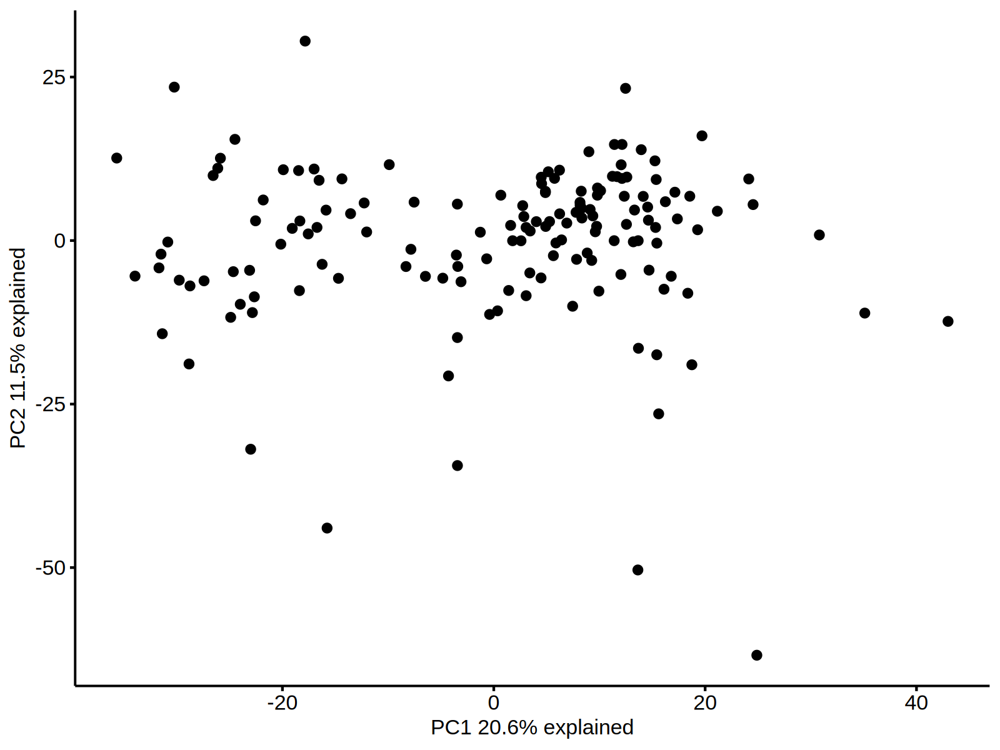

In [137]:
pc <- prcomp(t(logcpm_tcga_te), center = TRUE, scale = TRUE)
lblx = paste0('PC1 ', round(100 * pc$sdev[1]^2/sum(pc$sdev^2), 1), '% explained') 
lbly = paste0('PC2 ', round(100 * pc$sdev[2]^2/sum(pc$sdev^2), 1), '% explained') 
plotdat = as.data.table(pc$x, keep.rownames = T)
#plotdat = merge(plotdat, dsn[, .(sample_name, subtype)], by.x = 'rn', by.y = 'sample_name')
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
ggscatter(plotdat, x = 'PC1', y = 'PC2') + xlab(lblx) + ylab(lbly)


# read telocal file


In [76]:
head(dsn$telocal_file)

NULL

In [138]:
dsn[, telocal_file_size := file.size(telocal_file)]

In [ ]:
telocal_list = lapply(dsn[, telocal_file], function (fname) {
    tmp = fread(fname)
    setnames(tmp, 1, 'gene')
    setnames(tmp, 2, 'count')
    tmp
})


In [ ]:
names(telocal_list) = dsn[, sample_name]


In [ ]:
telocal_dt = rbindlist(telocal_list, idcol = T)


In [ ]:
telocal_dt[, .id := substr(.id, 1, 12) ]

In [ ]:
telocal_dt = telocal_dt[! (gene %in% coding_genes), ]
#telocal_dt[, tag := paste0(.id, '__', gene)]


In [ ]:
telocal_dt[, nn := sum(.SD$count), by = 'gene' ]


In [ ]:
head(telocal_dt)


In [ ]:
dim(telocal_dt)

In [ ]:
telocal_dt_cnt = telocal_dt[nn > 151 * 2, ]
dim(telocal_dt_cnt)


In [ ]:
saveRDS(telocal_dt_cnt, file = 'telocal_tcga_dt_cnt.rds')


In [149]:
136097508/151

[1] 901308

In [ ]:
count_dt = dcast(formula = gene ~ .id, value.var = 'count', data = telocal_dt_cnt) 
count_df = setDF(count_dt[, 2:ncol(count_dt)], rownames = count_dt$gene)
head(count_df)


In [56]:
dge <- DGEList(count_df)
dge <- calcNormFactors(dge)
logcpm_tcga_telocal = cpm(dge, normalized.lib.sizes = T, log = T)


In [53]:
count_df = readRDS('tcga_aml_telocal_raw_count.rds')
logcpm_tcga_telocal = readRDS('logcpm_tcga_aml_telocal.rds')


In [57]:
saveRDS(logcpm_tcga_telocal, file = 'logcpm_tcga_aml_telocal.rds')
saveRDS(count_df, file = 'tcga_aml_telocal_raw_count.rds')


# top 20 TE genes from blueprint


## top 20 TE genes in TCGA patietns

In [22]:
blueprint_top20_dn = fread(file = '~/WenhuoHu/collab_Farhan/data/cluster_info_blueprint_te_dn_top20.tsv')
blueprint_top20_up = fread(file = '~/WenhuoHu/collab_Farhan/data/cluster_info_blueprint_te_up_top20.tsv')
blueprint_top20_up$updn = 'up'
blueprint_top20_dn$dndn = 'dn'

blueprint_top20_dn[, ctype_gene := gene ]
blueprint_top20_dn[, cell_type := sub('_.*', '', ctype_gene)]
blueprint_top20_dn[, gene := sub('(.*?)_(.*)', '\\2', ctype_gene) ]
blueprint_top20_up[, ctype_gene := gene ]
blueprint_top20_up[, cell_type := sub('_.*', '', ctype_gene)]
blueprint_top20_up[, gene := sub('(.*?)_(.*)', '\\2', ctype_gene) ]

gene_list = list(blueprint_top20_up = blueprint_top20_up, blueprint_top20_dn = blueprint_top20_dn)
comment(gene_list$blueprint_top20_up) = 'top TE genes up-regulated, established in nb_TE_blueprint_HSPC_Apr23-checkpoint.ipynb, and then modified in tcga_aml_t2t.ipynb'
comment(gene_list$blueprint_top20_dn) = 'top TE genes down-regulated, established in nb_TE_blueprint_HSPC_Apr23-checkpoint.ipynb, and then modified in tcga_aml_t2t.ipynb'


In [17]:
gene_list = read_file('gene_list') 

Current maximum version: 1 	 ~/WenhuoHu/collab_Farhan//gene_list_v1.rds 


In [20]:
save_file(gene_list)

New version: 2 
File saved as: ~/WenhuoHu/collab_Farhan//gene_list_v2.rds 


In [26]:
library(TCGAbiolinks)

In [27]:
subtypes = PanCancerAtlas_subtypes() 
subtypes = as.data.table(subtypes)


In [28]:
table(subtypes$cancer.type) 


 ACC  AML BLCA BRCA COAD ESCA  GBM HNSC KICH KIRC KIRP  LGG LIHC LUAD LUSC OVCA 
  91  187  129 1218  341  169  606  279   66  442  161  516  196  230  178  489 
PCPG PRAD READ SKCM STAD THCA UCEC  UCS 
 178  333  118  333  383  496  538   57 

In [29]:
dim(subtypes[cancer.type == 'AML', ])
head(subtypes[cancer.type == 'AML', ])

[1] 187  10

pan.samplesID,cancer.type,Subtype_mRNA,Subtype_DNAmeth,Subtype_protein,Subtype_miRNA,Subtype_CNA,Subtype_Integrative,Subtype_other,Subtype_Selected
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-AB-2802,AML,NA,NA,NA,3,NA,NA,NA,AML.NA
TCGA-AB-2803,AML,3,NA,NA,5,NA,NA,NA,AML.3
TCGA-AB-2805,AML,5,NA,NA,1,NA,NA,NA,AML.5
TCGA-AB-2806,AML,4,NA,NA,4,NA,NA,NA,AML.4
TCGA-AB-2807,AML,6,NA,NA,4,NA,NA,NA,AML.6
TCGA-AB-2808,AML,5,NA,NA,4,NA,NA,NA,AML.5


In [30]:
head(blueprint_top20_up)

gene,cluster,updn,ctype_gene,cell_type
<chr>,<chr>,<chr>,<chr>,<chr>
ERVL-B4-int:ERVL:LTR,HSC,up,HSC_ERVL-B4-int:ERVL:LTR,HSC
ACRO1:acro:Satellite,HSC,up,HSC_ACRO1:acro:Satellite,HSC
L1PA13:L1:LINE,HSC,up,HSC_L1PA13:L1:LINE,HSC
L1PA16:L1:LINE,HSC,up,HSC_L1PA16:L1:LINE,HSC
THE1D:ERVL-MaLR:LTR,HSC,up,HSC_THE1D:ERVL-MaLR:LTR,HSC
L1PA15:L1:LINE,HSC,up,HSC_L1PA15:L1:LINE,HSC


In [31]:
table(subtypes[cancer.type == 'AML', Subtype_Selected])
head(subtypes[cancer.type == 'AML',])


 AML.1  AML.2  AML.3  AML.4  AML.5  AML.6  AML.7 AML.NA 
    14     21     18     37     33     35     20      9 

pan.samplesID,cancer.type,Subtype_mRNA,Subtype_DNAmeth,Subtype_protein,Subtype_miRNA,Subtype_CNA,Subtype_Integrative,Subtype_other,Subtype_Selected
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-AB-2802,AML,NA,NA,NA,3,NA,NA,NA,AML.NA
TCGA-AB-2803,AML,3,NA,NA,5,NA,NA,NA,AML.3
TCGA-AB-2805,AML,5,NA,NA,1,NA,NA,NA,AML.5
TCGA-AB-2806,AML,4,NA,NA,4,NA,NA,NA,AML.4
TCGA-AB-2807,AML,6,NA,NA,4,NA,NA,NA,AML.6
TCGA-AB-2808,AML,5,NA,NA,4,NA,NA,NA,AML.5


In [32]:
# https://www.nejm.org/doi/full/10.1056/NEJMoa1301689
# RNA-sequencing and miRNA-sequencing groups and covariates (Figure 4). 
# RNA-sequencing group 4 was associated with subtype M1 (AML with minimal maturation) 
# in the French–American–British (FAB) classification of acute leukemias,
# group 3 with FAB subtype M3 (acute promyelocytic leukemia), 
# group 5 with FAB subtype M4 (acute myelomonocytic leukemia), and group 7 with FAB subtype M5 (acute monoblastic or monocytic leukemia)

In [33]:
dim(dsn)

[1] 151  51

In [34]:
dsn[, patientID := substr(sample_name, 1, 12) ]
dsn = merge(dsn, subtypes, by.x = 'patientID', by.y = 'pan.samplesID', all.x = T)
setkey(dsn, 'patientID')


In [ ]:
gene_list$tcga_dsn = dsn
comment(gene_list$tcga_dsn) = 'TCGA dsn table, tcga_aml_t2t.ipynb'
save_file(gene_list)


In [103]:
table(dsn$Subtype_Selected) 


AML.1 AML.2 AML.3 AML.4 AML.5 AML.6 AML.7 
   12    17    16    30    27    32    16 

In [97]:
head(dsn$sample)

[1] "TCGA-AB-2914-03A-01T-0734-13" "TCGA-AB-2987-03A-01T-0734-13"
[3] "TCGA-AB-2812-03A-01T-0734-13" "TCGA-AB-2943-03A-01T-0740-13"
[5] "TCGA-AB-2940-03A-01T-0736-13" "TCGA-AB-2970-03A-01T-0734-13"

In [45]:
share_dir

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/"

In [107]:
dim(logcpm_tcga_te)
dim(dsn)

[1] 1310  151

[1] 151  60

In [111]:
head(blueprint_top20_up)

gene,cluster,updn,ctype_gene,cell_type
<chr>,<chr>,<chr>,<chr>,<chr>
ERVL-B4-int:ERVL:LTR,HSC,up,HSC_ERVL-B4-int:ERVL:LTR,HSC
ACRO1:acro:Satellite,HSC,up,HSC_ACRO1:acro:Satellite,HSC
L1PA13:L1:LINE,HSC,up,HSC_L1PA13:L1:LINE,HSC
L1PA16:L1:LINE,HSC,up,HSC_L1PA16:L1:LINE,HSC
THE1D:ERVL-MaLR:LTR,HSC,up,HSC_THE1D:ERVL-MaLR:LTR,HSC
L1PA15:L1:LINE,HSC,up,HSC_L1PA15:L1:LINE,HSC


In [126]:
dsn[is.na(Subtype_Selected), ]

patientID,bam_ori_file,id,sample_name,sample_dir,sample_pre,sorted_bam_file,validateBam_jobname,validateBam_oo,validateBam_er,⋯,telocal_cmd,cancer.type,Subtype_mRNA,Subtype_DNAmeth,Subtype_protein,Subtype_miRNA,Subtype_CNA,Subtype_Integrative,Subtype_other,Subtype_Selected
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-AB-2896,/research/rgs01/dbGap/wugrp/phs000178_28534/TCGA/RNAseq/LAML/becd6596-aac4-4dce-bc19-0f31b59e4729.rna_seq.genomic.gdc_realn.bam,becd6596-aac4-4dce-bc19-0f31b59e4729,TCGA-AB-2896-03B-01T-0751-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13_nameSorted.bam,validateBam_TCGA-AB-2896-03B-01T-0751-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13_validateBam.out,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13_validateBam.err,⋯,"bsub -J telocal_TCGA-AB-2896-03B-01T-0751-13 -n 10 -o /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13_telocal_out -e /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13_telocal_err -P beat -R """"rusage[mem=5GB]"""" -W 999:00 """" cd /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/ && /home/whu78/conda3/envs/te/bin/TElocal --sortByPos -b /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2896-03B-01T-0751-13/TCGA-AB-2896-03B-01T-0751-13_Aligned.sortedByCoord.out.bam --GTF /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf --TE /research/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/T2T_CHM13_v2_rmsk_TE.gtf.locInd --stranded reverse --project telocal """"",NA,NA,NA,NA,NA,NA,NA,NA,NA


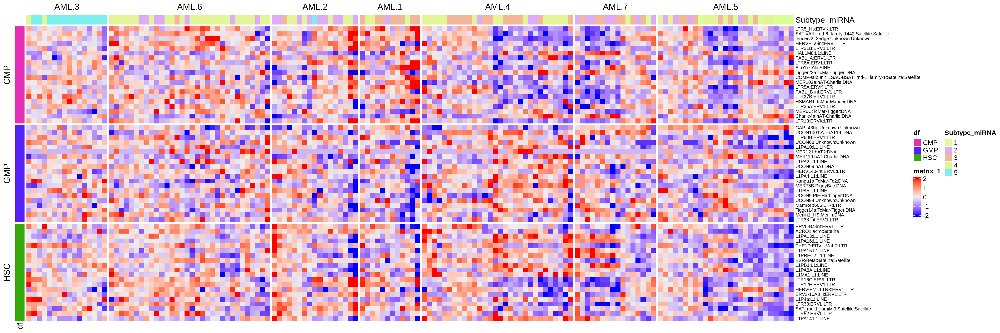

In [35]:
row_dsn = blueprint_top20_up[cluster %in% c('HSC', 'CMP', 'GMP'), ]
row_ha = rowAnnotation(df = row_dsn[, cluster])
col_dsn = dsn[!is.na(Subtype_Selected), ]
column_ha = HeatmapAnnotation(df = col_dsn[, "Subtype_miRNA", drop = F])
plotdat = logcpm_tcga_te[row_dsn$gene, col_dsn$sample_name]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                column_split = factor(col_dsn$Subtype_Selected), show_column_names = F, 
                show_row_names = T, show_column_dend = F, cluster_rows = F, row_split = row_dsn$cluster,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 7, repr.plot.res = 200)
draw(hp)


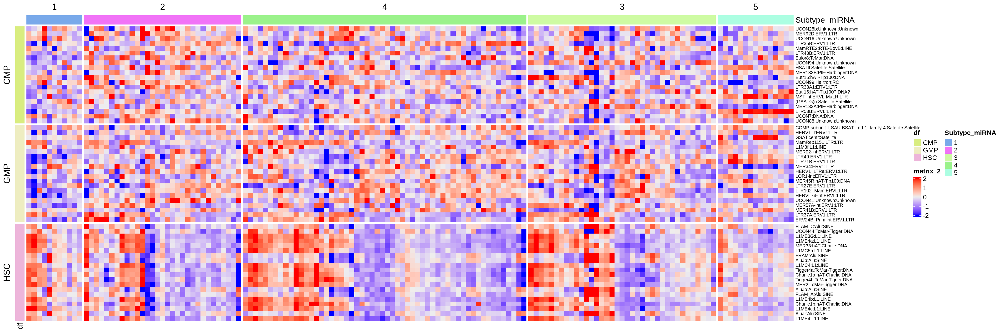

In [36]:
row_dsn = blueprint_top20_dn[cluster %in% c('HSC', 'CMP', 'GMP'), ]
row_ha = rowAnnotation(df = row_dsn[, cluster])
col_dsn = dsn[!is.na(Subtype_Selected), ]
column_ha = HeatmapAnnotation(df = col_dsn[, "Subtype_miRNA", drop = F])
plotdat = logcpm_tcga_te[row_dsn$gene, col_dsn$sample_name]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                column_split = factor(col_dsn$Subtype_miRNA), show_column_names = F, 
                show_row_names = T, show_column_dend = F, cluster_rows = F, row_split = row_dsn$cluster,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 7, repr.plot.res = 200)
draw(hp)


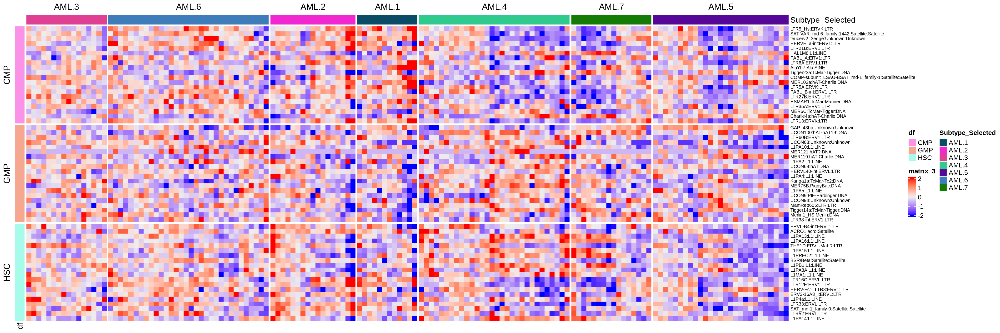

In [37]:
row_dsn = blueprint_top20_up[cluster %in% c('HSC', 'CMP', 'GMP'), ]
row_ha = rowAnnotation(df = row_dsn[, cluster])
col_dsn = dsn[!is.na(Subtype_Selected), ]
column_ha = HeatmapAnnotation(df = col_dsn[, "Subtype_Selected", drop = F])
plotdat = logcpm_tcga_te[row_dsn$gene, col_dsn$sample_name]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                column_split = factor(col_dsn$Subtype_Selected), show_column_names = F, 
                show_row_names = T, show_column_dend = F, cluster_rows = F, row_split = row_dsn$cluster,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 7, repr.plot.res = 200)
draw(hp)


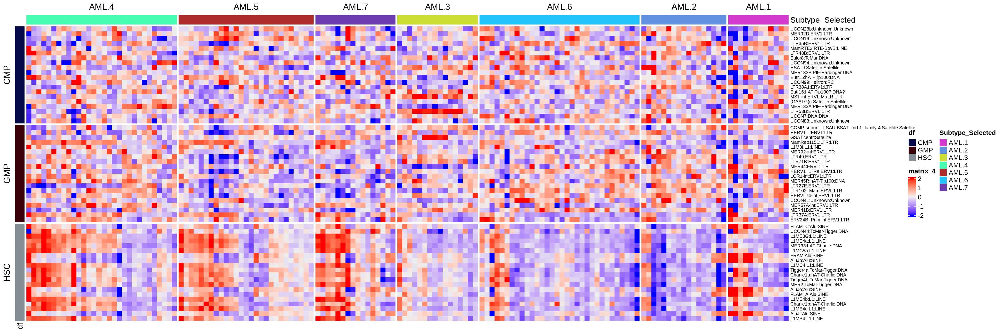

In [38]:
row_dsn = blueprint_top20_dn[cluster %in% c('HSC', 'CMP', 'GMP'), ]
row_ha = rowAnnotation(df = row_dsn[, cluster])
col_dsn = dsn[!is.na(Subtype_Selected), ]
column_ha = HeatmapAnnotation(df = col_dsn[, "Subtype_Selected", drop = F])
plotdat = logcpm_tcga_te[row_dsn$gene, col_dsn$sample_name]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                column_split = factor(col_dsn$Subtype_Selected), show_column_names = F, 
                show_row_names = T, show_column_dend = F, cluster_rows = F, row_split = row_dsn$cluster,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 7, repr.plot.res = 200)
draw(hp)


In [49]:
tcga_clin$subtype_used

[1] "Other"                "Other"                "RUNX1-RUNX1T1"       
  [4] "CBFB-MYH11"           "RUNX1-RUNX1T1"        "Other"               
  [7] "CBFB-MYH11"           "Other"                "Other"               
 [10] "CBFB-MYH11"           "RUNX1-RUNX1T1"        "Other"               
 [13] "CBFB-MYH11"           "Other"                "RUNX1-RUNX1T1"       
 [16] "CBFB-MYH11"           "RUNX1-RUNX1T1"        "CBFB-MYH11"          
 [19] "CBFB-MYH11"           "CBFB-MYH11"           "Other"               
 [22] "Other"                "Other"                "CBFB-MYH11"          
 [25] "RUNX1-RUNX1T1"        "CBFB-MYH11"           "RUNX1-RUNX1T1"       
 [28] "CBFB-MYH11"           "CBFB-MYH11"           "Other"               
 [31] "Other"                "Other"                "Other"               
 [34] "Other"                "Other"                "Other"               
 [37] "Other"                "Other"                "Other"               
 [40] "Other"                "Other"                "Other"               
 [43] "Other"                "Other"                "Other"               
 [46] "Other"                "Other"                "Other"               
 [49] "Other"                "Other"                "Other"               
 [52] "Other"                "Other"                "Other"               
 [55] "Other"                "Other"                "Other"               
 [58] "Other"                "Other"                "Other"               
 [61] "Other"                "Other"                "Other"               
 [64] "Other"                "Other"                "Other"               
 [67] "Other"                "Other"                "Other"               
 [70] "Other"                "Other"                "Other"               
 [73] "Other"                "Other"                "Other"               
 [76] "Other"                "Other"                "Other"               
 [79] "Other"                "MA9"                  "Other"               
 [82] "Other"                "Other"                "Other"               
 [85] "Other"                "Other"                "Other"               
 [88] "Other"                "Other"                "Other"               
 [91] "Other"                "Other"                "Other"               
 [94] "Other"                "Other"                "Other"               
 [97] "Other"                "Other"                "Other"               
[100] "Other"                "Other"                "Other"               
[103] "Other"                "Other"                "Other"               
[106] "Other"                "Other"                "Other"               
[109] "MA9"                  "Other"                "Other"               
[112] "Other"                "Other"                "Other"               
[115] "Other"                "Other"                "Other"               
[118] "Other"                "Other"                "Other"               
[121] "Other"                "Other"                "Other"               
[124] "Other"                "Other"                "Other"               
[127] "Other"                "Other"                "Other"               
[130] "Other"                "Other"                "Other"               
[133] "Other"                "Other"                "Other"               
[136] "Other"                "Other"                "Other"               
[139] "Other"                "Other"                "Other"               
[142] "Other"                "Other"                "Other"               
[145] "Other"                "Other"                "Other"               
[148] "Other"                "Other"                "Complex Cytogenetics"
[151] "Other"                "BCR-ABL1"             "Complex Cytogenetics"
[154] "Other"                "MLL_re"               "MLL_re"              
[157] "Other"                "Complex Cytogenetics" "MLL_re"              
[160] "MLL_re"             

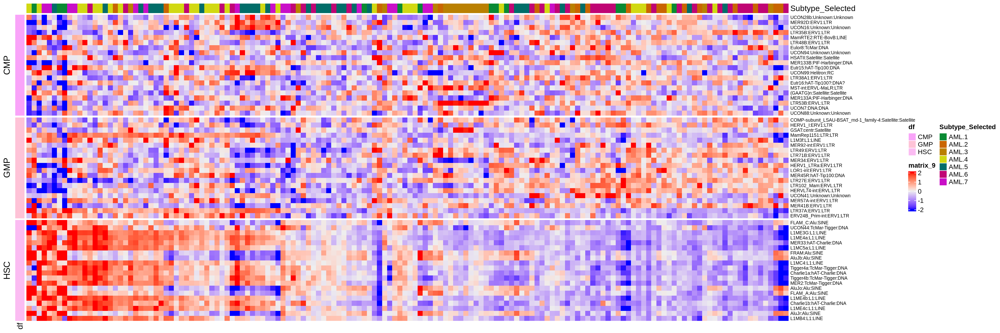

In [43]:
row_dsn = blueprint_top20_dn[cluster %in% c('HSC', 'CMP', 'GMP'), ]
row_ha = rowAnnotation(df = row_dsn[, cluster])
col_dsn = dsn[!is.na(Subtype_Selected), ]
column_ha = HeatmapAnnotation(df = col_dsn[, "Subtype_Selected", drop = F])
plotdat = logcpm_tcga_te[row_dsn$gene, col_dsn$sample_name]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                 show_column_names = F, 
                show_row_names = T, show_column_dend = F, cluster_rows = F, row_split = row_dsn$cluster,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 7, repr.plot.res = 200)
draw(hp)


In [53]:
head(plotdat)

,TCGA-AB-2805,TCGA-AB-2806,TCGA-AB-2808,TCGA-AB-2810,TCGA-AB-2811,TCGA-AB-2812,TCGA-AB-2813,TCGA-AB-2814,TCGA-AB-2815,TCGA-AB-2817,⋯,TCGA-AB-2998,TCGA-AB-2999,TCGA-AB-3000,TCGA-AB-3001,TCGA-AB-3002,TCGA-AB-3007,TCGA-AB-3008,TCGA-AB-3009,TCGA-AB-3011,TCGA-AB-3012
(CATTC)n:Satellite:Satellite,-0.7673090,0.6526246,-0.4331985,1.8906127,3.6847086,0.04032696,-0.2979319,-1.5522701,0.1779322,-0.04485381,⋯,-0.04672754,0.7216118,-0.93949797,-0.01202249,-1.22994067,0.1187713,-0.16821361,1.3399703,1.94347310,0.5798371
(GAATG)n:Satellite:Satellite,0.1084266,1.8072916,1.6182052,3.3921162,4.5715062,2.44271361,1.5685083,1.2698584,1.3523608,1.37383395,⋯,-0.04672754,1.2329952,1.77669637,1.55401264,2.26435593,2.2401739,2.30879385,2.3717962,2.21579495,1.5840578
7SLRNA:srpRNA:srpRNA,0.4041637,1.0608160,-0.9372011,2.4344492,2.4609955,-0.22712531,0.1298586,-0.1697094,0.4391370,0.17837377,⋯,0.50389897,-0.5470223,-0.03605342,-0.48621095,-1.22994067,-1.7322338,-0.04210202,0.7224639,-0.06286646,0.7326853
A-rich:Low_complexity:Low_complexity,-2.1869995,-2.6593557,-2.1135281,0.1167405,-0.2744776,-0.98189888,-1.1875129,-2.6593557,-1.3852542,-1.31609846,⋯,-2.01000405,0.1672066,-1.55702033,-0.68664646,-0.05525482,-1.7322338,-2.65935570,-1.2192372,-0.62143172,0.1070966
ACRO1:acro:Satellite,1.3151911,3.0340179,1.5481145,3.9044036,1.1134794,1.71830420,0.2482628,4.6890076,0.1779322,1.83386200,⋯,0.30810031,0.7216118,2.85583208,0.54072899,0.58353246,1.1553426,2.13278172,2.8499988,1.57810211,2.1704245
ALR/Alpha:centr:Satellite,7.3120583,8.1076704,8.1814161,6.1683749,7.6883664,7.23087597,7.9948988,7.1220695,6.4622937,8.38302997,⋯,6.16920483,7.1331411,7.77319832,7.22423389,7.93384249,7.0057673,8.24502071,7.2870411,6.52436650,7.1256099


In [54]:
row_dsn$gene

[1] "FLAM_C:Alu:SINE"                                          
 [2] "UCON44:TcMar-Tigger:DNA"                                  
 [3] "L1ME3G:L1:LINE"                                           
 [4] "L1ME4a:L1:LINE"                                           
 [5] "MER33:hAT-Charlie:DNA"                                    
 [6] "L1MC5a:L1:LINE"                                           
 [7] "FRAM:Alu:SINE"                                            
 [8] "AluJb:Alu:SINE"                                           
 [9] "L1MC4:L1:LINE"                                            
[10] "Tigger4a:TcMar-Tigger:DNA"                                
[11] "Charlie1a:hAT-Charlie:DNA"                                
[12] "Tigger4b:TcMar-Tigger:DNA"                                
[13] "MER2:TcMar-Tigger:DNA"                                    
[14] "AluJo:Alu:SINE"                                           
[15] "FLAM_A:Alu:SINE"                                          
[16] "L1ME4b:L1:LINE"                                           
[17] "Charlie1b:hAT-Charlie:DNA"                                
[18] "L1ME4c:L1:LINE"                                           
[19] "AluJr:Alu:SINE"                                           
[20] "L1MB4:L1:LINE"                                            
[21] "UCON28b:Unknown:Unknown"                                  
[22] "MER92D:ERV1:LTR"                                          
[23] "UCON16:Unknown:Unknown"                                   
[24] "LTR35B:ERV1:LTR"                                          
[25] "MamRTE2:RTE-BovB:LINE"                                    
[26] "LTR48B:ERV1:LTR"                                          
[27] "Eulor8:TcMar:DNA"                                         
[28] "UCON94:Unknown:Unknown"                                   
[29] "HSATII:Satellite:Satellite"                               
[30] "MER133B:PIF-Harbinger:DNA"                                
[31] "Eutr15:hAT-Tip100:DNA"                                    
[32] "UCON99:Helitron:RC"                                       
[33] "LTR38A1:ERV1:LTR"                                         
[34] "Eutr16:hAT-Tip100?:DNA?"                                  
[35] "MST-int:ERVL-MaLR:LTR"                                    
[36] "(GAATG)n:Satellite:Satellite"                             
[37] "MER133A:PIF-Harbinger:DNA"                                
[38] "LTR53B:ERVL:LTR"                                          
[39] "UCON7:DNA:DNA"                                            
[40] "UCON88:Unknown:Unknown"                                   
[41] "COMP-subunit_LSAU-BSAT_rnd-1_family-4:Satellite:Satellite"
[42] "HERV1_I:ERV1:LTR"                                         
[43] "GSAT:centr:Satellite"                                     
[44] "MamRep1151:LTR:LTR"                                       
[45] "L1M3f:L1:LINE"                                            
[46] "MER92-int:ERV1:LTR"                                       
[47] "LTR49:ERV1:LTR"                                           
[48] "LTR71B:ERV1:LTR"                                          
[49] "MER34:ERV1:LTR"                                           
[50] "HERV1_LTRa:ERV1:LTR"                                      
[51] "LOR1-int:ERV1:LTR"                                        
[52] "MER45R:hAT-Tip100:DNA"                                    
[53] "LTR27E:ERV1:LTR"                                          
[54] "LTR102_Mam:ERVL:LTR"                                      
[55] "HERVL74-int:ERVL:LTR"                                     
[56] "UCON41:Unknown:Unknown"                                   
[57] "MER57A-int:ERV1:LTR"                                      
[58] "MER41B:ERV1:LTR"                                          
[59] "LTR37A:ERV1:LTR"                                          
[60] "ERV24B_Prim-int:ERV1:LTR"

In [55]:
tcga_clin$PatientID

[1] "TCGA-AB-2803" "TCGA-AB-2804" "TCGA-AB-2806" "TCGA-AB-2815" "TCGA-AB-2819"
  [6] "TCGA-AB-2823" "TCGA-AB-2828" "TCGA-AB-2840" "TCGA-AB-2841" "TCGA-AB-2846"
 [11] "TCGA-AB-2858" "TCGA-AB-2862" "TCGA-AB-2870" "TCGA-AB-2872" "TCGA-AB-2875"
 [16] "TCGA-AB-2881" "TCGA-AB-2886" "TCGA-AB-2888" "TCGA-AB-2889" "TCGA-AB-2892"
 [21] "TCGA-AB-2897" "TCGA-AB-2905" "TCGA-AB-2906" "TCGA-AB-2914" "TCGA-AB-2937"
 [26] "TCGA-AB-2942" "TCGA-AB-2950" "TCGA-AB-2954" "TCGA-AB-2957" "TCGA-AB-2980"
 [31] "TCGA-AB-2982" "TCGA-AB-2991" "TCGA-AB-2994" "TCGA-AB-2997" "TCGA-AB-2998"
 [36] "TCGA-AB-2999" "TCGA-AB-3001" "TCGA-AB-3007" "TCGA-AB-3012" "TCGA-AB-2802"
 [41] "TCGA-AB-2805" "TCGA-AB-2807" "TCGA-AB-2808" "TCGA-AB-2809" "TCGA-AB-2811"
 [46] "TCGA-AB-2812" "TCGA-AB-2816" "TCGA-AB-2818" "TCGA-AB-2821" "TCGA-AB-2822"
 [51] "TCGA-AB-2824" "TCGA-AB-2825" "TCGA-AB-2826" "TCGA-AB-2827" "TCGA-AB-2830"
 [56] "TCGA-AB-2831" "TCGA-AB-2833" "TCGA-AB-2835" "TCGA-AB-2837" "TCGA-AB-2839"
 [61] "TCGA-AB-2843" "TCGA-AB-2845" "TCGA-AB-2848" "TCGA-AB-2851" "TCGA-AB-2853"
 [66] "TCGA-AB-2854" "TCGA-AB-2859" "TCGA-AB-2864" "TCGA-AB-2865" "TCGA-AB-2866"
 [71] "TCGA-AB-2867" "TCGA-AB-2869" "TCGA-AB-2871" "TCGA-AB-2873" "TCGA-AB-2877"
 [76] "TCGA-AB-2879" "TCGA-AB-2880" "TCGA-AB-2884" "TCGA-AB-2890" "TCGA-AB-2894"
 [81] "TCGA-AB-2896" "TCGA-AB-2898" "TCGA-AB-2899" "TCGA-AB-2900" "TCGA-AB-2903"
 [86] "TCGA-AB-2907" "TCGA-AB-2909" "TCGA-AB-2912" "TCGA-AB-2913" "TCGA-AB-2916"
 [91] "TCGA-AB-2919" "TCGA-AB-2921" "TCGA-AB-2922" "TCGA-AB-2923" "TCGA-AB-2924"
 [96] "TCGA-AB-2925" "TCGA-AB-2926" "TCGA-AB-2927" "TCGA-AB-2931" "TCGA-AB-2932"
[101] "TCGA-AB-2933" "TCGA-AB-2934" "TCGA-AB-2936" "TCGA-AB-2938" "TCGA-AB-2940"
[106] "TCGA-AB-2947" "TCGA-AB-2948" "TCGA-AB-2955" "TCGA-AB-2956" "TCGA-AB-2959"
[111] "TCGA-AB-2963" "TCGA-AB-2964" "TCGA-AB-2965" "TCGA-AB-2966" "TCGA-AB-2967"
[116] "TCGA-AB-2968" "TCGA-AB-2969" "TCGA-AB-2970" "TCGA-AB-2971" "TCGA-AB-2972"
[121] "TCGA-AB-2973" "TCGA-AB-2974" "TCGA-AB-2975" "TCGA-AB-2976" "TCGA-AB-2977"
[126] "TCGA-AB-2978" "TCGA-AB-2979" "TCGA-AB-2981" "TCGA-AB-2983" "TCGA-AB-2984"
[131] "TCGA-AB-2986" "TCGA-AB-2987" "TCGA-AB-2988" "TCGA-AB-2989" "TCGA-AB-2990"
[136] "TCGA-AB-2992" "TCGA-AB-2993" "TCGA-AB-2995" "TCGA-AB-2996" "TCGA-AB-3000"
[141] "TCGA-AB-3002" "TCGA-AB-3006" "TCGA-AB-3008" "TCGA-AB-3009" "TCGA-AB-3011"
[146] "TCGA-AB-2810" "TCGA-AB-2850" "TCGA-AB-2895" "TCGA-AB-2946" "TCGA-AB-2813"
[151] "TCGA-AB-2814" "TCGA-AB-2817" "TCGA-AB-2820" "TCGA-AB-2829" "TCGA-AB-2832"
[156] "TCGA-AB-2834" "TCGA-AB-2836" "TCGA-AB-2838" "TCGA-AB-2842" "TCGA-AB-2844"
[161] "TCGA-AB-2847" "TCGA-AB-2849" "TCGA-AB-2855" "TCGA-AB-2856" "TCGA-AB-2857"
[166] "TCGA-AB-2860" "TCGA-AB-2861" "TCGA-AB-2863" "TCGA-AB-2868" "TCGA-AB-2874"
[171] "TCGA-AB-2876" "TCGA-AB-2878" "TCGA-AB-2882" "TCGA-AB-2883" "TCGA-AB-2885"
[176] "TCGA-AB-2887" "TCGA-AB-2891" "TCGA-AB-2893" "TCGA-AB-2901" "TCGA-AB-2904"
[181] "TCGA-AB-2908" "TCGA-AB-2910" "TCGA-AB-2911" "TCGA-AB-2915" "TCGA-AB-2917"
[186] "TCGA-AB-2918" "TCGA-AB-2920" "TCGA-AB-2928" "TCGA-AB-2929" "TCGA-AB-2930"
[191] "TCGA-AB-2935" "TCGA-AB-2939" "TCGA-AB-2941" "TCGA-AB-2943" "TCGA-AB-2944"
[196] "TCGA-AB-2945" "TCGA-AB-2949" "TCGA-AB-2952" "TCGA-AB-2985" "TCGA-AB-3005"

In [60]:
table(col_dsn$subtype_used)
table(col_dsn$PMLRARA)


            BCR-ABL1           CBFB-MYH11 Complex Cytogenetics 
                   3                   10                   18 
                 MA9               MLL_re                Other 
                   2                    6                  105 
       RUNX1-RUNX1T1 
                   7 


PML-RARA       WT 
      14      137 

In [61]:
colnames(col_dsn)

[1] "PatientID"              "SEX"                    "RACE"                  
 [4] "FAB"                    "AGE"                    "BM_BLAST_PERCENTAGE"   
 [7] "WBC"                    "PB_BLAST_PERCENTAGE"    "AML_IN_SKIN_PERCENTAGE"
[10] "CYTOGENETICS"           "CYTOGENETIC_CODE_OTHER" "RISK_CYTO"             
[13] "HISTOLOGICAL_SUBTYPE"   "RISK_MOLECULAR"         "DFS_MONTHS"            
[16] "DFS_STATUS"             "INDUCTION"              "TRANSPLANT_TYPE"       
[19] "DARK_ZONE_STAT"         "OS_MONTHS"              "OS_STATUS"             
[22] "subtype_used"           "BCRABL"                 "karyotype"             
[25] "MLL_re"                 "MA9"                    "AML1ETO"               
[28] "PMLRARA"                "subtype"                "CBFBMYH11"             
[31] "Complex"                "FLT3"                   "FLT3_mut"              
[34] "FLT3ITD"                "TET2_mut"               "DNMT3A_mut"            
[37] "SF3B1_mut"              "TP53_mut"               "PPM1D_mut"             
[40] "ASXL1_mut"              "NRAS_mut"               "JAK2_mut"              
[43] "GNB1_mut"               "KRAS_mut"               "CBL_mut"               
[46] "IDH1_mut"               "IDH2_mut"

Following `at` are removed: NA, because no color was defined for them.

Following `at` are removed: NA, because no color was defined for them.

Following `at` are removed: NA, because no color was defined for them.

Following `at` are removed: NA, because no color was defined for them.

Following `at` are removed: NA, because no color was defined for them.

Following `at` are removed: NA, because no color was defined for them.



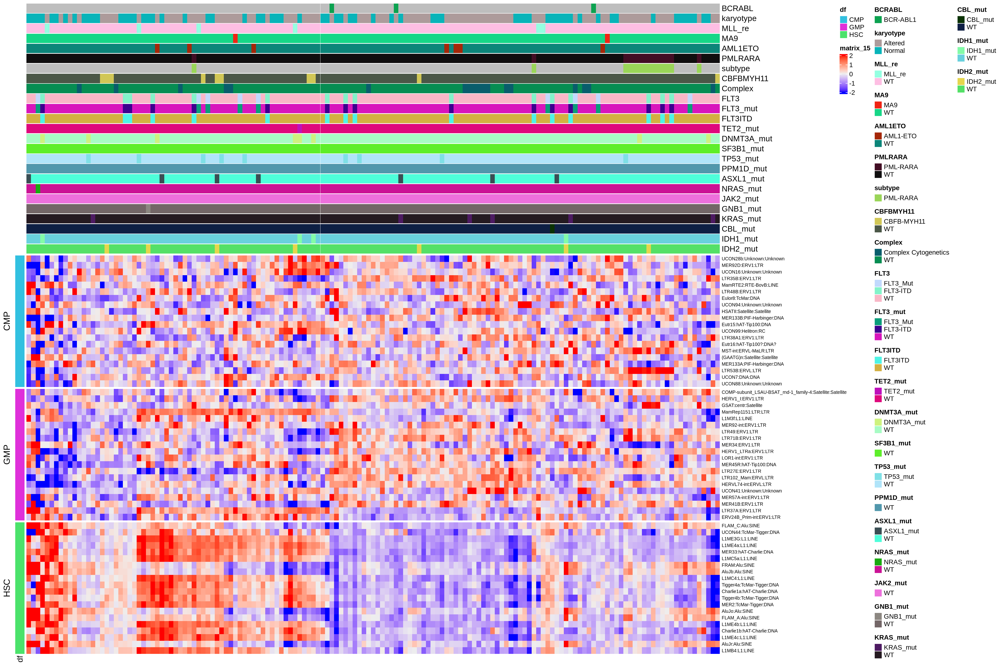

In [64]:
row_dsn = blueprint_top20_dn[cluster %in% c('HSC', 'CMP', 'GMP'), ]
row_ha = rowAnnotation(df = row_dsn[, cluster])

plotdat = copy(logcpm_tcga_te)
colnames(plotdat) = substr(colnames(plotdat), 1, 12)

col_dsn = tcga_clin[PatientID %in% colnames(plotdat), ]
mol = c('BCRABL', 'karyotype', 'MLL_re', 'MA9', 'AML1ETO', 'PMLRARA', 'subtype', 'CBFBMYH11', 'Complex', 'FLT3', 'FLT3_mut', 
        'FLT3ITD', 'TET2_mut', 'DNMT3A_mut', 'SF3B1_mut', 'TP53_mut', 'PPM1D_mut', 'ASXL1_mut', 'NRAS_mut', 
        'JAK2_mut', 'GNB1_mut', 'KRAS_mut', 'CBL_mut', 'IDH1_mut', 'IDH2_mut')  
column_ha = HeatmapAnnotation(df = col_dsn[, mol, with = F])

plotdat = plotdat[row_dsn$gene, col_dsn$PatientID]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                 show_column_names = F, 
                show_row_names = T, show_column_dend = F, cluster_rows = F, row_split = row_dsn$cluster,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 14, repr.plot.res = 200)
draw(hp)


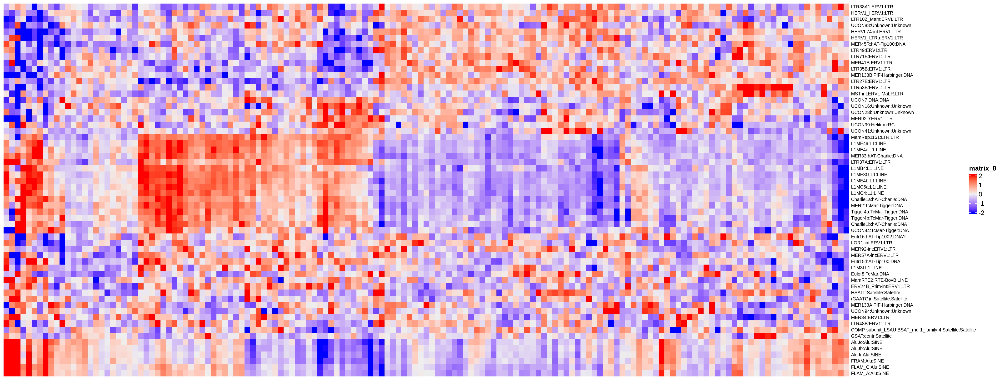

In [42]:
row_dsn = blueprint_top20_dn[cluster %in% c('HSC', 'CMP', 'GMP'), ]
plotdat = logcpm_tcga_te[row_dsn$gene, dsn$sample_name]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, show_column_names = F,  show_row_names = T, show_column_dend = F, cluster_rows = T, cluster_columns = T,
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 8, repr.plot.res = 200)
draw(hp)


## top 20 TE gene survival

In [ ]:
#tmp = fread('~/collab_Farhan/cluster.tsv')
#n_cl = sort(unique(tmp$cluster))
#gset_custom = lapply(n_cl, function(ii){tmp[cluster == ii, gene]})
#names(gset_custom) = paste0('cl_', n_cl)
gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE'))

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

vars = names(gset_custom)
var = vars[1]
probs = c(0, .25, 1)

gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
gg1 = ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 
gg1

fname = '~/WenhuoHu/collab_Farhan/pdf/blueprint_line_tcga_survival.pdf'
pdf(file = fname, width = 5, height = 4)
gg1
dev.off()


# test Gu's paper gene list

In [17]:
dsn_gdc = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/tcgaAML_clinical_info_only_151_cases_from_GDC.xls')
dsn_gdc[, OS_STATUS := as.numeric(factor(OS_STATUS, levels = c('0:LIVING', '1:DECEASED'))) - 1 ]
logcpm_tcga_te = readRDS(file = '~/WenhuoHu/dataset/tcga/logcpm_tcga_te.rds')
mtx = copy(logcpm_tcga_te)
colnames(mtx) = substr(colnames(mtx), 1, 12)


In [15]:
tcga_clin = fread('~/WenhuoHu/collab_JinWang/bcat/tcga_clin.tsv')
dim(tcga_clin) 


Warning message in fread("~/WenhuoHu/collab_JinWang/bcat/tcga_clin.tsv"):
“Detected 2 column names but the data has 3 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”


[1] 131   3

In [215]:
gu = fread('~/WenhuoHu/TE/gu')
setnames(gu, 1, 'gene')
line1 = gu[grep('LINE', gene), gene]
line1 = unlist(lapply(line1, function(xx){
    paste(unlist(strsplit(x = xx, ':'))[c(1,3,2)], collapse = ':')
}))
line1
saveRDS(line1, file = '~/WenhuoHu/TE/gu_line1.rds')


[1] "L1PA12:L1:LINE" "L1PA2:L1:LINE"  "L1PA10:L1:LINE" "L1MEd:L1:LINE" 
 [5] "L1MA4A:L1:LINE" "L1HS:L1:LINE"   "L1PA3:L1:LINE"  "L1MEc:L1:LINE" 
 [9] "HAL1M8:L1:LINE" "L1ME4b:L1:LINE" "L1MA3:L1:LINE"  "L1PA7:L1:LINE" 
[13] "L1M7:L1:LINE"   "L1M4a2:L1:LINE" "L1MA2:L1:LINE"  "L1MA8:L1:LINE" 
[17] "L1MB2:L1:LINE"  "L1PA16:L1:LINE" "L1ME2:L1:LINE"  "L1PB1:L1:LINE" 
[21] "L1MCa:L1:LINE"  "L1MDa:L1:LINE"  "L1PA6:L1:LINE"  "L1PA4:L1:LINE" 
[25] "L1MA5:L1:LINE"  "L1ME1:L1:LINE"  "L1M3:L1:LINE"   "L1MB3:L1:LINE" 
[29] "L1P1:L1:LINE"   "L1MB8:L1:LINE"  "L1MEf:L1:LINE"  "L1PB4:L1:LINE" 
[33] "L1MEi:L1:LINE"  "L1MC4:L1:LINE"  "L1MA4:L1:LINE"  "L1MD1:L1:LINE"

In [ ]:
add_

In [193]:
gset_line1 = list(line1 = line1)
gu_res = gsva(expr = as.matrix(mtx), gset_line1)
gu_res = as.data.table(t(gu_res), keep.rownames = T)
gu_res = merge(dsn_gdc, gu_res, by.x = 'PatientID', by.y = 'rn', all.x = T)


Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



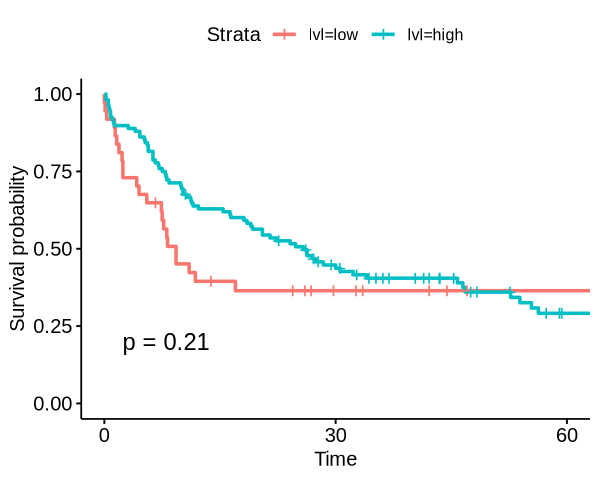

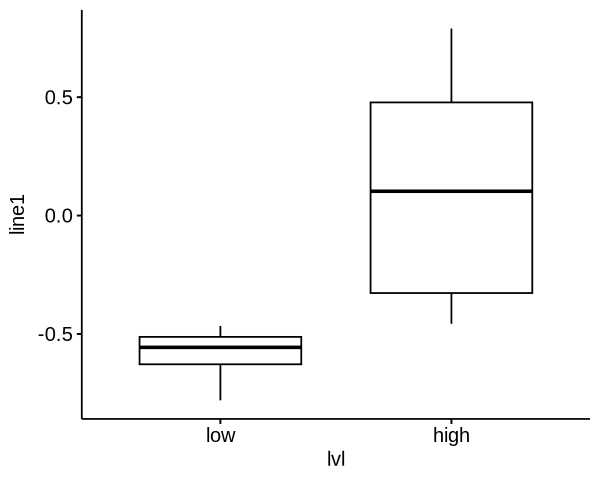

In [196]:
var = 'line1'
plotdat = gu_res[MLL_re == 'WT', ]
var_val = unlist(plotdat[, var, with = F])
plotdat$lvl = cut_quantile(var_val, probs = c(0, .25, 1), n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           #palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           #legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 60))      # Change ggplot2 theme

ggboxplot(plotdat, x = 'lvl', y = var)


In [244]:
row_zero = apply(mtx, 1, FUN = function(rr){sum(rr == 0)}) 
head(row_zero)
length(row_zero)

(CATTC)n:Satellite:Satellite         (GAATG)n:Satellite:Satellite 
                                   0                                    0 
                7SLRNA:srpRNA:srpRNA A-rich:Low_complexity:Low_complexity 
                                   0                                    0 
                ACRO1:acro:Satellite            ALR/Alpha:centr:Satellite 
                                   0                                    0

[1] 1310

In [251]:
gset_custom

$cl_1
[1] "HAL1M8:L1:LINE"               "L1M2a:L1:LINE"               
[3] "L1M3de:L1:LINE"               "L1MC:L1:LINE"                
[5] "L1PA5:L1:LINE"                "Penelope1_Vert:Penelope:LINE"
[7] "X7C_LINE:CR1:LINE"           

$cl_2
 [1] "L1M2b:L1:LINE"         "L1M3f:L1:LINE"         "L1MA1:L1:LINE"        
 [4] "L1MDb:L1:LINE"         "L1P3b:L1:LINE"         "L1P4a:L1:LINE"        
 [7] "L1P4c:L1:LINE"         "L1P4d:L1:LINE"         "L1PA15-16:L1:LINE"    
[10] "L1PA16:L1:LINE"        "L1PA8A:L1:LINE"        "L1PB2:L1:LINE"        
[13] "L1PB3:L1:LINE"         "L1PB:L1:LINE"          "MamRTE2:RTE-BovB:LINE"
[16] "X7D_LINE:CR1:LINE"

Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



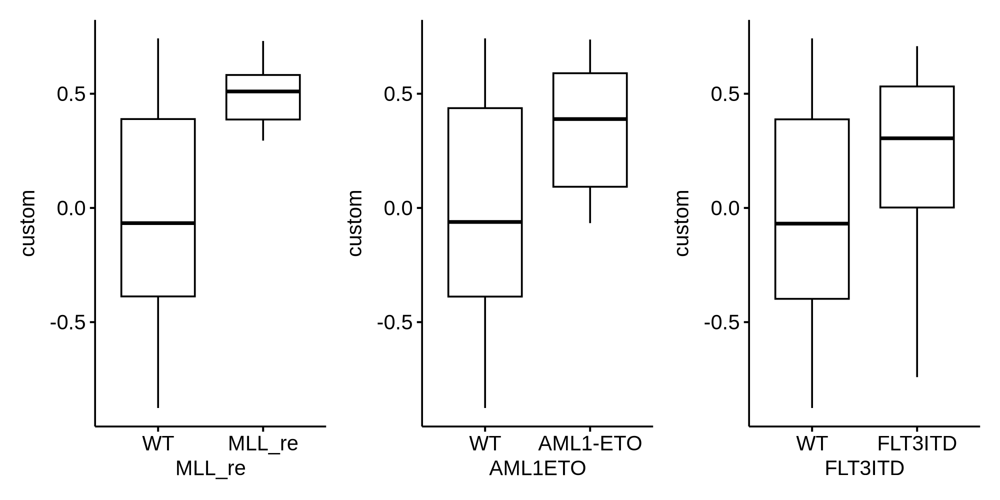

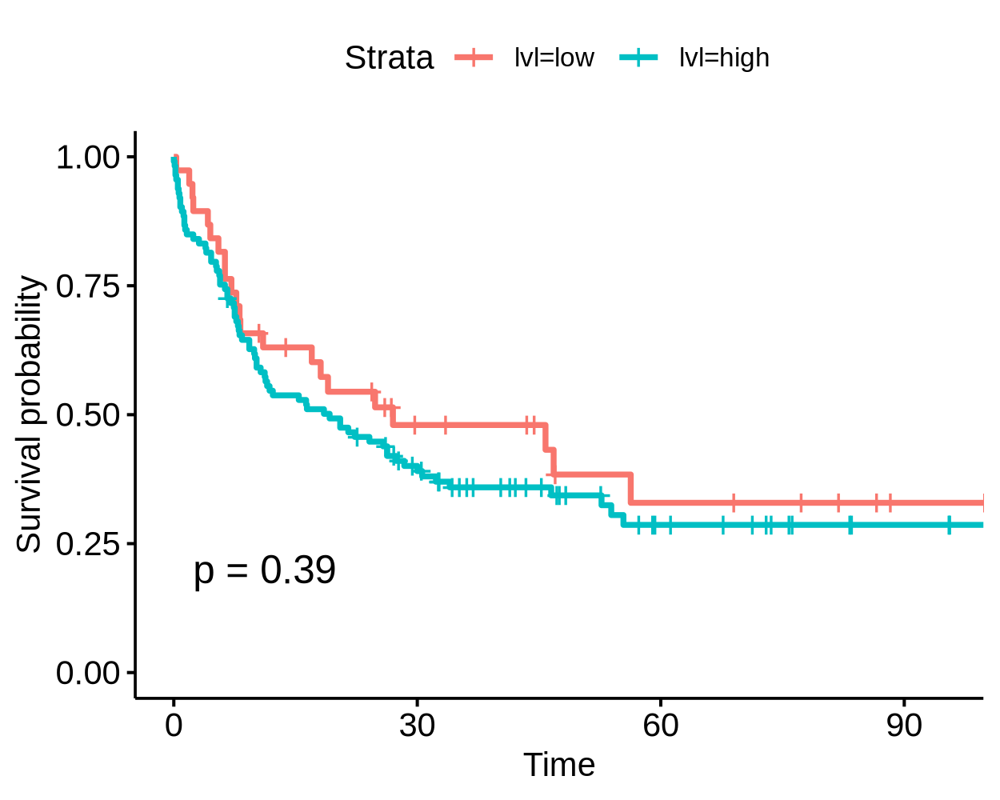

In [350]:
gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE'))
gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE'))
gset_custom = list(custom = c('L1MA1:L1:LINE',  'L1PA16:L1:LINE', 'L1PA8A:L1:LINE', 'L1PB2:L1:LINE', 'L1PB3:L1:LINE', 'L1PB:L1:LINE') )
# 'L1MDb:L1:LINE', 'L1P4a:L1:LINE', 'L1P4d:L1:LINE', 'L1M3f:L1:LINE', 'L1PA15-16:L1:LINE', 

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

options(repr.plot.width = 8, repr.plot.height = 4, repr.plo.res = 300)
ggboxplot(gsva_res, x = 'MLL_re', y = 'custom') | 
ggboxplot(gsva_res, x = 'AML1ETO', y = 'custom') | 
ggboxplot(gsva_res, x = 'FLT3ITD', y = 'custom')

var = 'custom'
probs = c(0, .25, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 2 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



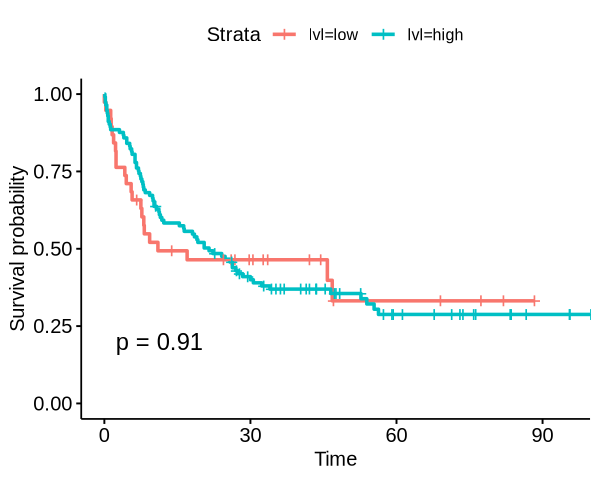

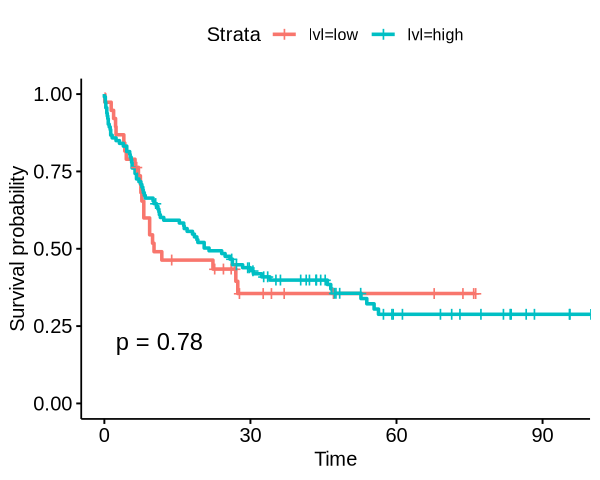

In [258]:
tmp = fread('~/collab_Farhan/cluster_gu.tsv')
n_cl = sort(unique(tmp$cluster))
gset_custom = lapply(n_cl, function(ii){tmp[cluster == ii, gene]})
names(gset_custom) = paste0('cl_', n_cl)

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

vars = names(gset_custom)
var = vars[1]
probs = c(0, .25, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 

var = vars[2]
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


## **TE LINE1 survival**

In [73]:
gsva

new("standardGeneric", .Data = function (param, ...) 
standardGeneric("gsva"), generic = "gsva", package = "GSVA", 
    group = list(), valueClass = character(0), signature = "param", 
    default = NULL, skeleton = (function (param, ...) 
    stop(gettextf("invalid call in method dispatch to '%s' (no default method)", 
        "gsva"), domain = NA))(param, ...))
<bytecode: 0x55558424cf48>
<environment: 0x5555842e4a00>
attr(,"generic")
[1] "gsva"
attr(,"generic")attr(,"package")
[1] "GSVA"
attr(,"package")
[1] "GSVA"
attr(,"group")
list()
attr(,"valueClass")
character(0)
attr(,"signature")
[1] "param"
attr(,"default")
`\001NULL\001`
attr(,"skeleton")
(function (param, ...) 
stop(gettextf("invalid call in method dispatch to '%s' (no default method)", 
    "gsva"), domain = NA))(param, ...)
attr(,"class")
[1] "standardGeneric"
attr(,"class")attr(,"package")
[1] "methods"

In [ ]:
gsvaParam(logcpm_tcga_te, cus

In [70]:
head(logcpm_tcga_te)

,TCGA-AB-2805-03A-01T-0734-13,TCGA-AB-2806-03A-01T-0734-13,TCGA-AB-2808-03A-01T-0734-13,TCGA-AB-2810-03A-01T-0736-13,TCGA-AB-2811-03B-01T-0760-13,TCGA-AB-2812-03A-01T-0734-13,TCGA-AB-2813-03A-01T-0736-13,TCGA-AB-2814-03A-01T-0734-13,TCGA-AB-2815-03A-01T-0734-13,TCGA-AB-2817-03A-01T-0736-13,⋯,TCGA-AB-2998-03A-01T-0735-13,TCGA-AB-2999-03B-01T-0748-13,TCGA-AB-3000-03A-01T-0736-13,TCGA-AB-3001-03A-01T-0736-13,TCGA-AB-3002-03A-01T-0736-13,TCGA-AB-3007-03A-01T-0736-13,TCGA-AB-3008-03A-01T-0736-13,TCGA-AB-3009-03A-01T-0736-13,TCGA-AB-3011-03A-01T-0736-13,TCGA-AB-3012-03A-01T-0736-13
(CATTC)n:Satellite:Satellite,-0.7673090,0.6526246,-0.4331985,1.8906127,3.6847086,0.04032696,-0.2979319,-1.5522701,0.1779322,-0.04485381,⋯,-0.04672754,0.7216118,-0.93949797,-0.01202249,-1.22994067,0.1187713,-0.16821361,1.3399703,1.94347310,0.5798371
(GAATG)n:Satellite:Satellite,0.1084266,1.8072916,1.6182052,3.3921162,4.5715062,2.44271361,1.5685083,1.2698584,1.3523608,1.37383395,⋯,-0.04672754,1.2329952,1.77669637,1.55401264,2.26435593,2.2401739,2.30879385,2.3717962,2.21579495,1.5840578
7SLRNA:srpRNA:srpRNA,0.4041637,1.0608160,-0.9372011,2.4344492,2.4609955,-0.22712531,0.1298586,-0.1697094,0.4391370,0.17837377,⋯,0.50389897,-0.5470223,-0.03605342,-0.48621095,-1.22994067,-1.7322338,-0.04210202,0.7224639,-0.06286646,0.7326853
A-rich:Low_complexity:Low_complexity,-2.1869995,-2.6593557,-2.1135281,0.1167405,-0.2744776,-0.98189888,-1.1875129,-2.6593557,-1.3852542,-1.31609846,⋯,-2.01000405,0.1672066,-1.55702033,-0.68664646,-0.05525482,-1.7322338,-2.65935570,-1.2192372,-0.62143172,0.1070966
ACRO1:acro:Satellite,1.3151911,3.0340179,1.5481145,3.9044036,1.1134794,1.71830420,0.2482628,4.6890076,0.1779322,1.83386200,⋯,0.30810031,0.7216118,2.85583208,0.54072899,0.58353246,1.1553426,2.13278172,2.8499988,1.57810211,2.1704245
ALR/Alpha:centr:Satellite,7.3120583,8.1076704,8.1814161,6.1683749,7.6883664,7.23087597,7.9948988,7.1220695,6.4622937,8.38302997,⋯,6.16920483,7.1331411,7.77319832,7.22423389,7.93384249,7.0057673,8.24502071,7.2870411,6.52436650,7.1256099


In [74]:
GSVA::gsva

new("standardGeneric", .Data = function (param, ...) 
standardGeneric("gsva"), generic = "gsva", package = "GSVA", 
    group = list(), valueClass = character(0), signature = "param", 
    default = NULL, skeleton = (function (param, ...) 
    stop(gettextf("invalid call in method dispatch to '%s' (no default method)", 
        "gsva"), domain = NA))(param, ...))
<bytecode: 0x55558424cf48>
<environment: 0x5555842e4a00>
attr(,"generic")
[1] "gsva"
attr(,"generic")attr(,"package")
[1] "GSVA"
attr(,"package")
[1] "GSVA"
attr(,"group")
list()
attr(,"valueClass")
character(0)
attr(,"signature")
[1] "param"
attr(,"default")
`\001NULL\001`
attr(,"skeleton")
(function (param, ...) 
stop(gettextf("invalid call in method dispatch to '%s' (no default method)", 
    "gsva"), domain = NA))(param, ...)
attr(,"class")
[1] "standardGeneric"
attr(,"class")attr(,"package")
[1] "methods"

In [71]:
library(GSVA)

In [75]:
gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE'))

gsva_res = gsva(as.matrix(logcpm_tcga_te), gset_custom)


ERROR: Error in gsva(as.matrix(logcpm_tcga_te), gset_custom): Calling gsva(expr=., gset.idx.list=., method=., ...) is defunct; use a method-specific parameter object (see '?gsva').


In [76]:
?gsva

gsva {GSVA},R Documentation
param,A parameter object of one of the following classes: A gsvaParam object built using the constructor function gsvaParam. This object will trigger gsva() to use the GSVA algorithm by Hänzelmann et al. (2013). A plageParam object built using the constructor function plageParam. This object will trigger gsva() to use the PLAGE algorithm by Tomfohr et al. (2005). A zscoreParam object built using the constructor function zscoreParam. This object will trigger gsva() to use the combined z-score algorithm by Lee et al. (2008). A ssgseaParam object built using the constructor function ssgseaParam. This object will trigger gsva() to use the ssGSEA algorithm by Barbie et al. (2009).
verbose,Gives information about each calculation step. Default: TRUE.
BPPARAM,An object of class BiocParallelParam specifying parameters related to the parallel execution of some of the tasks and calculations within this function.


In [77]:
?gsvaParam

gsvaParam-class {GSVA},R Documentation
exprData,"The expression data set. Must be one of the classes supported by GsvaExprData. For a list of these classes, see its help page using help(GsvaExprData)."
geneSets,"The gene sets. Must be one of the classes supported by GsvaGeneSets. For a list of these classes, see its help page using help(GsvaGeneSets)."
assay,"Character vector of length 1. The name of the assay to use in case exprData is a multi-assay container, otherwise ignored. By default, the first assay is used."
annotation,"An object of class GeneIdentifierType from package GSEABase describing the gene identifiers used as the row names of the expression data set. See GeneIdentifierType for help on available gene identifier types and how to construct them. This information can be used to map gene identifiers occurring in the gene sets. If the default value NULL is provided, an attempt will be made to extract the gene identifier type from the expression data set provided as exprData (by calling gsvaAnnotation on it). If still not successful, the NullIdentifier() will be used as the gene identifier type, gene identifier mapping will be disabled and gene identifiers used in expression data set and gene sets can only be matched directly."
minSize,"Numeric vector of length 1. Minimum size of the resulting gene sets after gene identifier mapping. By default, the minimum size is 1."
maxSize,"Numeric vector of length 1. Maximum size of the resulting gene sets after gene identifier mapping. By default, the maximum size is Inf."
kcdf,"Character vector of length 1 denoting the kernel to use during the non-parametric estimation of the empirical cumulative distribution function (ECDF) of expression levels across samples. The value kcdf=""auto"" will allow GSVA to automatically choose one of the possible values. The value kcdf=""Gaussian"" is suitable when input expression values are continuous, such as microarray fluorescent units in logarithmic scale, RNA-seq log-CPMs, log-RPKMs, or log-TPMs. When input expression values are integer counts, such as those derived from RNA-seq experiments, then this argument should be set to kcdf=""Poisson"". When we do not want to use a kernel approach for the estimation of the ECDF, then we should set kcdf=""none""."
kcdfNoneMinSampleSize,"Integer vector of length 1. When kcdf=""auto"", this parameter decides at what minimum sample size kcdf=""none"", i.e., the estimation of the empirical cumulative distribution function (ECDF) of expression levels across samples is performed directly without using a kernel. By default, this value is set to 200; see the kcdf slot."
tau,"Numeric vector of length 1. The exponent defining the weight of the tail in the random walk performed by the GSVA (Hänzelmann et al., 2013) method. The default value is 1 as described in the paper."
maxDiff,"Logical vector of length 1 which offers two approaches to calculate the enrichment statistic (ES) from the KS random walk statistic. FALSE: ES is calculated as the maximum distance of the random walk from 0. This approach produces a distribution of enrichment scores that is bimodal, but it can give large enrichment scores to gene sets whose genes are not concordantly activated in one direction only. TRUE (the default): ES is calculated as the magnitude difference between the largest positive and negative random walk deviations. This default value gives larger enrichment scores to gene sets whose genes are concordantly activated in one direction only."


In [68]:

gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE'))

gsva_res = gsva(expr = as.matrix(logcpm_tcga_te), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
tmp = rbindlist(list(dsn_b1, dsn_b2))
gsva_res = merge(dsn_b1, gsva_res, by.x = 'sample_name', by.y = 'rn', all.x = T)
gsva_res[, OS_STATUS := as.numeric(OS_Stat) ]
gsva_res[, OS_MONTHS := as.numeric(OS_Month) ]

var = 'custom'
probs = c(0, .5, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


ERROR: Error: unable to find an inherited method for function 'gsva' for signature 'param = "list"'


In [66]:
gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE'))

gsva_res = gsva(expr = as.matrix(logcpm_), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
tmp = rbindlist(list(dsn_b1, dsn_b2))
gsva_res = merge(dsn_b1, gsva_res, by.x = 'sample_name', by.y = 'rn', all.x = T)
gsva_res[, OS_STATUS := as.numeric(OS_Stat) ]
gsva_res[, OS_MONTHS := as.numeric(OS_Month) ]

var = 'custom'
probs = c(0, .5, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


ERROR: Error: unable to find an inherited method for function 'gsva' for signature 'param = "list"'


In [133]:
gene_list$hsc_line =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE')
comment(gene_list$hsc_line) = 'down-regulated LINEs in HSC compared with CMP, origin: nb_TE_blueprint_HSPC_Apr23-checkpoint.ipynb, modified: tcga_aml_t2t.ipynb'


In [139]:
saveRDS(gene_list, file = paste0('~/WenhuoHu/collab_Farhan/gene_list_v1.rds'))

In [140]:
read_file('gene_list')

Current maximum version: 1 	 ~/WenhuoHu/collab_Farhan//gene_list_v1.rds 


In [145]:
save_file(gene_list)

New version: 2 
File saved as: gene_list_v2.rds 


In [65]:
#tmp = fread('~/collab_Farhan/cluster.tsv')
#n_cl = sort(unique(tmp$cluster))
#gset_custom = lapply(n_cl, function(ii){tmp[cluster == ii, gene]})
#names(gset_custom) = paste0('cl_', n_cl)
gset_custom = list(custom =  c('HAL1M8:L1:LINE', 'L1M2a:L1:LINE', 'L1M3de:L1:LINE', 'L1MC:L1:LINE', 'L1PA5:L1:LINE', 'Penelope1_Vert:Penelope:LINE', 'X7C_LINE:CR1:LINE'))

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

vars = names(gset_custom)
var = vars[1]
probs = c(0, .25, 1)

gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
gg1 = ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 
gg1

#fname = '~/WenhuoHu/collab_Farhan/pdf/blueprint_line_tcga_survival.pdf'
#pdf(file = fname, width = 5, height = 4)
#gg1
#dev.off()


ERROR: Error: unable to find an inherited method for function 'gsva' for signature 'param = "list"'


Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 2 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



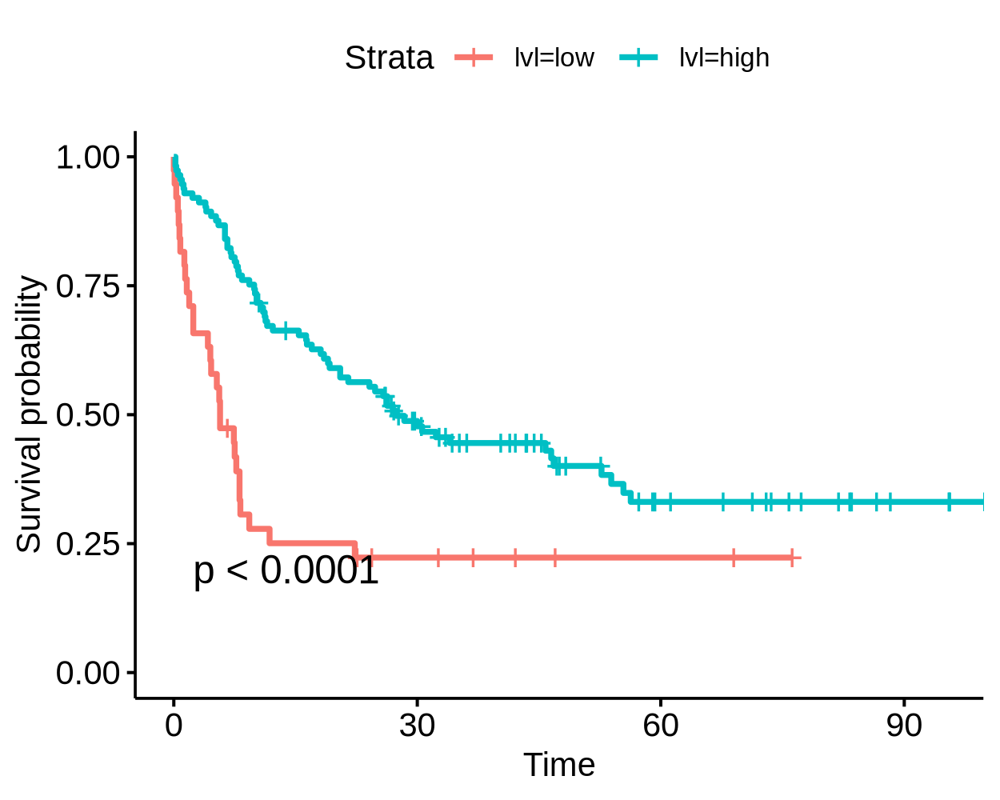

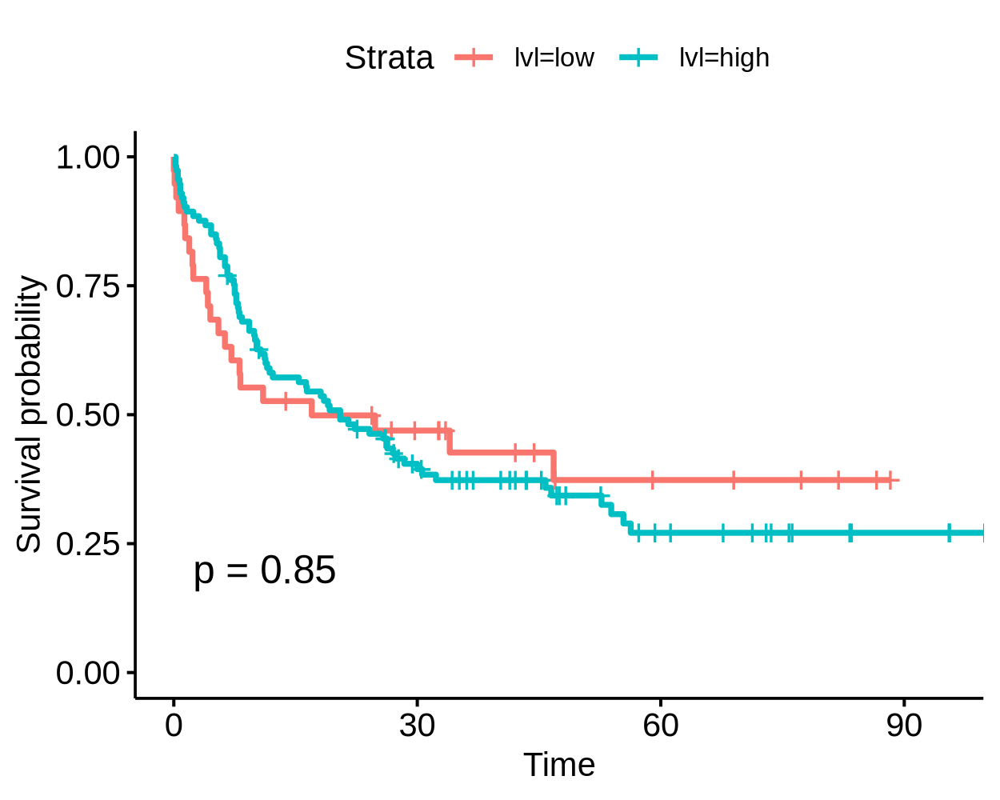

In [349]:
tmp = fread('~/collab_Farhan/cluster.tsv')
n_cl = sort(unique(tmp$cluster))
gset_custom = lapply(n_cl, function(ii){tmp[cluster == ii, gene]})
names(gset_custom) = paste0('cl_', n_cl)

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

vars = names(gset_custom)
var = vars[1]
probs = c(0, .25, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 

var = vars[2]
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


In [344]:
var

[1] "cl_2"

In [262]:
var = vars[1]
probs = c(0, .5, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
coxph(Surv(OS_MONTHS, OS_STATUS) ~ lvl, gsva_res) 


Call:
coxph(formula = Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)

           coef exp(coef) se(coef)      z     p
lvlhigh -0.1906    0.8265   0.2042 -0.933 0.351

Likelihood ratio test=0.87  on 1 df, p=0.3496
n= 151, number of events= 97 

In [275]:
gset_custom

$cl_1
 [1] "HAL1M8:L1:LINE"               "HERV15-int:ERV1:LTR"         
 [3] "HERV1_I:ERV1:LTR"             "HERV1_LTRa:ERV1:LTR"         
 [5] "HERVE_a-int:ERV1:LTR"         "HERVK3-int:ERVK:LTR"         
 [7] "HERVK9-int:ERVK:LTR"          "HERVS71-int:ERV1:LTR"        
 [9] "L1M2a:L1:LINE"                "L1M3de:L1:LINE"              
[11] "L1MC:L1:LINE"                 "L1PA5:L1:LINE"               
[13] "LTR10C:ERV1:LTR"              "LTR10E:ERV1:LTR"             
[15] "LTR13:ERVK:LTR"               "LTR13A:ERVK:LTR"             
[17] "LTR13_v:ERVK:LTR"             "LTR27C:ERV1:LTR"             
[19] "LTR4:ERV1:LTR"                "LTR5:ERVK:LTR"               
[21] "LTR5B:ERVK:LTR"               "LTR5_Hs:ERVK:LTR"            
[23] "LTR61:ERV1:LTR"               "LTR6A:ERV1:LTR"              
[25] "LTR6B:ERV1:LTR"               "LTR70:ERV1:LTR"              
[27] "LTR7B:ERV1:LTR"               "LTR7Y:ERV1:LTR"              
[29] "MER21A:ERVL:LTR"              "MER21B:ERVL:LTR"             
[31] "MER49:ERV1:LTR"               "MER57E3:ERV1:LTR"            
[33] "MER68:ERVL:LTR"               "MER83B:ERV1:LTR"             
[35] "PABL_A:ERV1:LTR"              "PABL_B-int:ERV1:LTR"         
[37] "PRIMA4-int:ERV1:LTR"          "Penelope1_Vert:Penelope:LINE"
[39] "X7C_LINE:CR1:LINE"           

$cl_2
  [1] "ERV3-16A3_I:ERVL:LTR"    "ERVL-B4-int:ERVL:LTR"   
  [3] "HERV-Fc1-int:ERV1:LTR"   "HERV-Fc1_LTR1:ERV1:LTR" 
  [5] "HERV-Fc1_LTR3:ERV1:LTR"  "HERV-Fc2-int:ERV1:LTR"  
  [7] "HERV16-int:ERVL:LTR"     "HERV1_LTRe:ERV1:LTR"    
  [9] "HERV35I-int:ERV1:LTR"    "HERV9NC-int:ERV1:LTR"   
 [11] "HERVK11D-int:ERVK:LTR"   "HERVK14C-int:ERVK:LTR"  
 [13] "HERVKC4-int:ERVK:LTR"    "HERVL18-int:ERVL:LTR"   
 [15] "HERVL32-int:ERVL:LTR"    "HERVL74-int:ERVL:LTR"   
 [17] "HUERS-P2-int:ERV1:LTR"   "L1M2b:L1:LINE"          
 [19] "L1M3f:L1:LINE"           "L1MA1:L1:LINE"          
 [21] "L1MDb:L1:LINE"           "L1P3b:L1:LINE"          
 [23] "L1P4a:L1:LINE"           "L1P4c:L1:LINE"          
 [25] "L1P4d:L1:LINE"           "L1PA15-16:L1:LINE"      
 [27] "L1PA16:L1:LINE"          "L1PA8A:L1:LINE"         
 [29] "L1PB2:L1:LINE"           "L1PB3:L1:LINE"          
 [31] "L1PB:L1:LINE"            "LOR1a:ERV1:LTR"         
 [33] "LTR103_Mam:ERV1:LTR"     "LTR108b_Mam:ERVL:LTR"   
 [35] "LTR108c_Mam:ERVL:LTR"    "LTR109A2:ERV1:LTR"      
 [37] "LTR16:ERVL:LTR"          "LTR16A1:ERVL:LTR"       
 [39] "LTR16A2:ERVL:LTR"        "LTR16D:ERVL:LTR"        
 [41] "LTR16E1:ERVL:LTR"        "LTR16E2:ERVL:LTR"       
 [43] "LTR1B0:ERV1:LTR"         "LTR1B:ERV1:LTR"         
 [45] "LTR1C3:ERV1:LTR"         "LTR21C:ERV1:LTR"        
 [47] "LTR27D:ERV1:LTR"         "LTR28:ERV1:LTR"         
 [49] "LTR33C:ERVL:LTR"         "LTR35B:ERV1:LTR"        
 [51] "LTR37-int:ERV1:LTR"      "LTR38A1:ERV1:LTR"       
 [53] "LTR40a:ERVL:LTR"         "LTR43-int:ERV1:LTR"     
 [55] "LTR47B:ERVL:LTR"         "LTR48B:ERV1:LTR"        
 [57] "LTR52:ERVL:LTR"          "LTR53-int:ERVL:LTR"     
 [59] "LTR53B:ERVL:LTR"         "LTR58:ERV1:LTR"         
 [61] "LTR77:ERV1:LTR"          "LTR80A:ERVL:LTR"        
 [63] "LTR81:Gypsy:LTR"         "LTR82A:ERVL:LTR"        
 [65] "LTR85a:Gypsy:LTR"        "LTR88b:Gypsy:LTR"       
 [67] "LTR89B:ERVL:LTR"         "LTR8B:ERV1:LTR"         
 [69] "MER101B:ERV1:LTR"        "MER31-int:ERV1:LTR"     
 [71] "MER4-int:ERV1:LTR"       "MER41G:ERV1:LTR"        
 [73] "MER4B-int:ERV1:LTR"      "MER4CL34:ERV1:LTR"      
 [75] "MER50-int:ERV1:LTR"      "MER51E:ERV1:LTR"        
 [77] "MER52A:ERV1:LTR"         "MER61-int:ERV1:LTR"     
 [79] "MER65-int:ERV1:LTR"      "MER66C:ERV1:LTR"        
 [81] "MER67C:ERV1:LTR"         "MER67D:ERV1:LTR"        
 [83] "MER84:ERV1:LTR"          "MER89-int:ERV1:LTR"     
 [85] "MER89:ERV1:LTR"          "MER92-int:ERV1:LTR"     
 [87] "MER92A:ERV1:LTR"         "MER92C:ERV1:LTR"        
 [89] "MER92D:ERV1:LTR"         "MER9B:ERVK:LTR"         
 [91] "MLT2A2:ERVL:LTR"         "MST-int:ERVL-MaLR:LTR"  
 [93] "Mam

Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 2 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



Call:
coxph(formula = Surv(OS_MONTHS, OS_STATUS) ~ cl_1, data = gsva_res)

        coef exp(coef) se(coef)      z     p
cl_1 -0.3640    0.6949   0.3256 -1.118 0.264

Likelihood ratio test=1.23  on 1 df, p=0.2667
n= 151, number of events= 97 

Call:
coxph(formula = Surv(OS_MONTHS, OS_STATUS) ~ cl_2, data = gsva_res)

       coef exp(coef) se(coef)     z     p
cl_2 0.3451    1.4122   0.4053 0.851 0.395

Likelihood ratio test=0.72  on 1 df, p=0.3946
n= 151, number of events= 97 

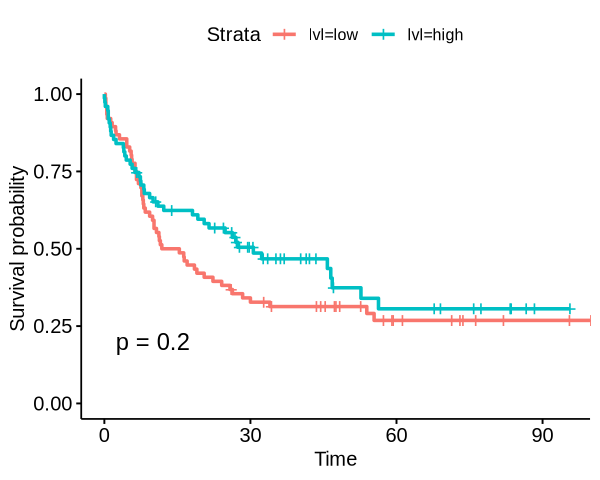

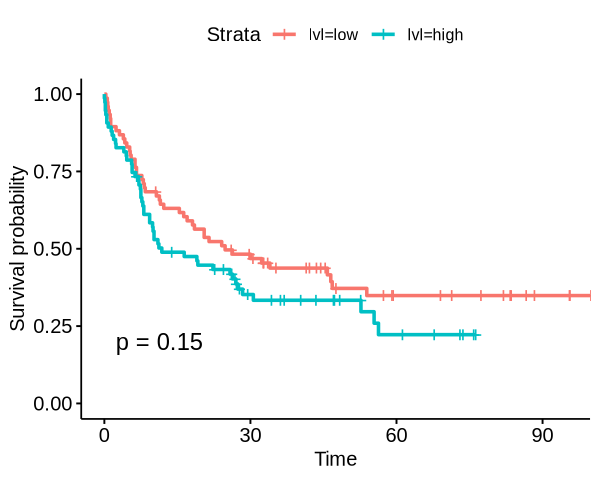

In [276]:
tmp = fread('~/collab_Farhan/cluster_LTRLINE.tsv')
n_cl = sort(unique(tmp$cluster))
gset_custom = lapply(n_cl, function(ii){tmp[cluster == ii, gene]})
names(gset_custom) = paste0('cl_', n_cl)

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)
#gsva_res = gsva_res[MLL_re == 'WT' & FLT3ITD == 'WT' & AML1ETO == 'WT', ]

coxph(Surv(OS_MONTHS, OS_STATUS) ~ cl_1, gsva_res) 
coxph(Surv(OS_MONTHS, OS_STATUS) ~ cl_2, gsva_res) 

vars = names(gset_custom)
var = vars[1]
probs = c(0, .5, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 

var = vars[2]
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


In [279]:
library(glmnet)

Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



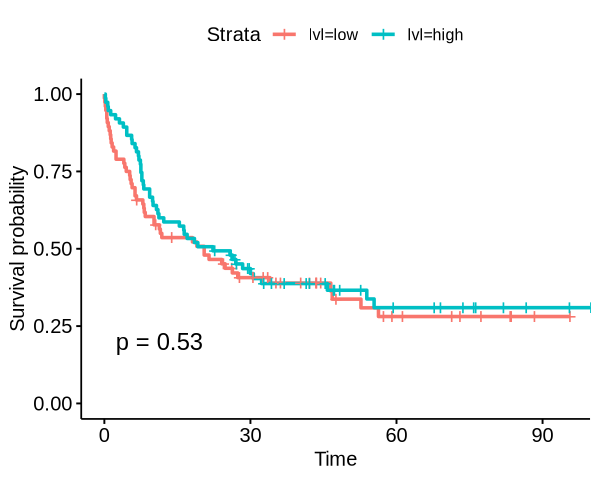

In [282]:
# lasso regression for feature selection
x <- as.matrix(t(mtx))
y <- as.numeric(gsva_res$OS_MONTHS)

# Fit Lasso with cross-validation to find optimal lambda
cv_lasso <- cv.glmnet(x, y, alpha = 1) # Alpha = 1 indicates Lasso
best_lambda <- cv_lasso$lambda.min

# Fit Lasso model with the best lambda
lasso_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)

# Extract non-zero coefficients (selected genes)
selected_genes <- rownames(coef(lasso_model))[-1][coef(lasso_model)[-1] != 0]


gsva_res = gsva(expr = as.matrix(mtx), list(custom = selected_genes))
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

gsva_res$lvl = cut_quantile(unlist(gsva_res[, 'custom', with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


In [ ]:
gsva_res$AM

Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 2 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



Call:
coxph(formula = Surv(OS_MONTHS, OS_STATUS) ~ cl_1, data = gsva_res)

        coef exp(coef) se(coef)      z     p
cl_1 -0.1112    0.8948   0.2769 -0.402 0.688

Likelihood ratio test=0.16  on 1 df, p=0.6886
n= 151, number of events= 97 

Call:
coxph(formula = Surv(OS_MONTHS, OS_STATUS) ~ cl_2, data = gsva_res)

       coef exp(coef) se(coef)    z     p
cl_2 0.3102    1.3637   0.3693 0.84 0.401

Likelihood ratio test=0.71  on 1 df, p=0.4009
n= 151, number of events= 97 

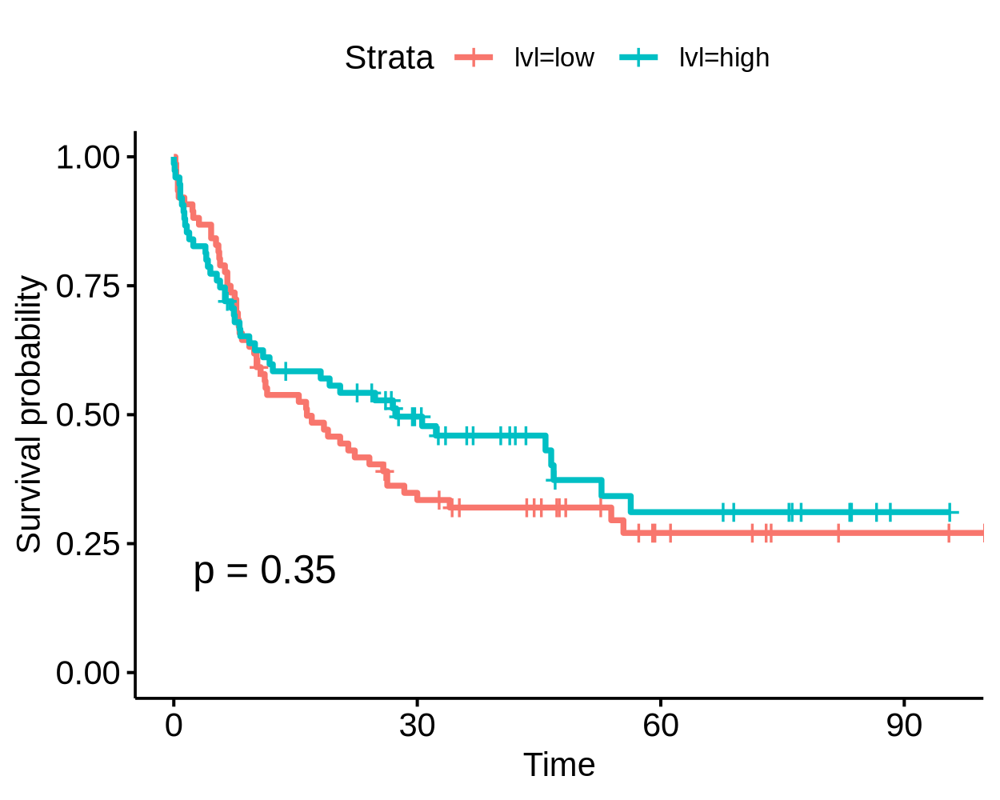

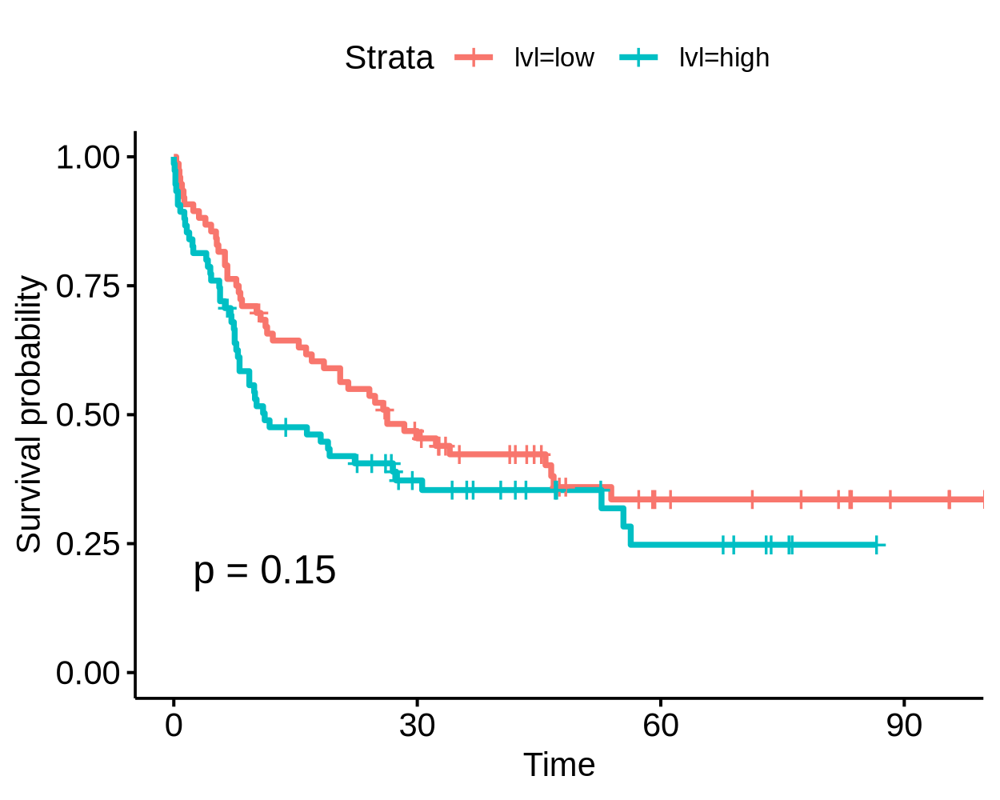

In [336]:
tmp = fread('~/collab_Farhan/cluster_LTR.tsv')
n_cl = sort(unique(tmp$cluster))
gset_custom = lapply(n_cl, function(ii){tmp[cluster == ii, gene]})
names(gset_custom) = paste0('cl_', n_cl)

gsva_res = gsva(expr = as.matrix(mtx), gset_custom)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)
#gsva_res = gsva_res[MLL_re == 'WT' & FLT3ITD == 'WT' & AML1ETO == 'WT', ]

coxph(Surv(OS_MONTHS, OS_STATUS) ~ cl_1, gsva_res) 
coxph(Surv(OS_MONTHS, OS_STATUS) ~ cl_2, gsva_res) 

vars = names(gset_custom)
var = vars[1]
probs = c(0, .5, 1)
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 

var = vars[2]
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = probs, n_names = c('low', 'high'))
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


In [225]:
intersect(line1, gset_custom$hsc_up)

[1] "HAL1M8:L1:LINE"

In [ ]:
# 'L1MDb:L1:LINE', 'L1P4a:L1:LINE', 'L1P4d:L1:LINE', 
var = 'custom'

gset_custom = list()
gset_custom[[var]] = c('L1M3f:L1:LINE', 'L1MA1:L1:LINE', 'L1MDb:L1:LINE', 'L1P4a:L1:LINE', 'L1P4d:L1:LINE',  'L1PA15-16:L1:LINE', 'L1PA16:L1:LINE', 'L1PA8A:L1:LINE', 'L1PB2:L1:LINE', 'L1PB3:L1:LINE', 'L1PB:L1:LINE') 
gset_custom[[var]] = c('L1MA1:L1:LINE',  'L1PA16:L1:LINE', 'L1PA8A:L1:LINE', 'L1PB2:L1:LINE', 'L1PB3:L1:LINE', 'L1PB:L1:LINE') 
gset_custom[[var]]  = c('(GAATG)n:Satellite:Satellite', 'AluY:Alu:SINE', 'AluYa5:Alu:SINE', 'AluYb8:Alu:SINE', 'AluYc:Alu:SINE', 'AluYf1:Alu:SINE', 'AluYk2:Alu:SINE', 
'AluYk3:Alu:SINE', 'AluYk4:Alu:SINE', 'AluYm1:Alu:SINE', 'HERV15-int:ERV1:LTR', 'LTR13:ERVK:LTR', 'LTR13A:ERVK:LTR', 'LTR13_v:ERVK:LTR', 'LTR1:ERV1:LTR', 
'LTR1A1:ERV1:LTR', 'LTR1A2:ERV1:LTR', 'LTR1D1:ERV1:LTR', 'LTR75B:ERVL:LTR', 'MER48:ERV1:LTR', 'MER52A:ERV1:LTR', 'MER52D:ERV1:LTR', 'MER61C:ERV1:LTR', 'UCON5:Unknown:Unknown') 
gset_custom[[var]]  = c('HERV15-int:ERV1:LTR', 'LTR13:ERVK:LTR', 'LTR13A:ERVK:LTR', 'LTR13_v:ERVK:LTR', 'LTR1:ERV1:LTR', 
'LTR1A1:ERV1:LTR', 'LTR1A2:ERV1:LTR', 'LTR1D1:ERV1:LTR', 'LTR75B:ERVL:LTR', 'MER48:ERV1:LTR', 'MER52A:ERV1:LTR', 'MER52D:ERV1:LTR', 'MER61C:ERV1:LTR') 

# 'L1MDb:L1:LINE', 'L1P4a:L1:LINE', 'L1P4d:L1:LINE', 'L1M3f:L1:LINE', 'L1PA15-16:L1:LINE', 
custom_res = gsva(expr = as.matrix(mtx), gset_custom)
custom_res = as.data.table(t(custom_res), keep.rownames = T)
custom_res = merge(dsn_gdc, custom_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

custom_res$lvl = cut_quantile(unlist(custom_res[, var, with = F]), probs = c(0, .5, 1), n_names = c('low', 'high'))
table(custom_res$lvl)

ggboxplot(custom_res, x = 'lvl', y = var)

fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = custom_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = custom_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."
Warning message in .gsva(expr, mapped.gset.idx.list, method, kcdf, rnaseq, abs.ranking, :
"Some gene sets have size one. Consider setting 'min.sz > 1'."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%




 low high 
  38  113 

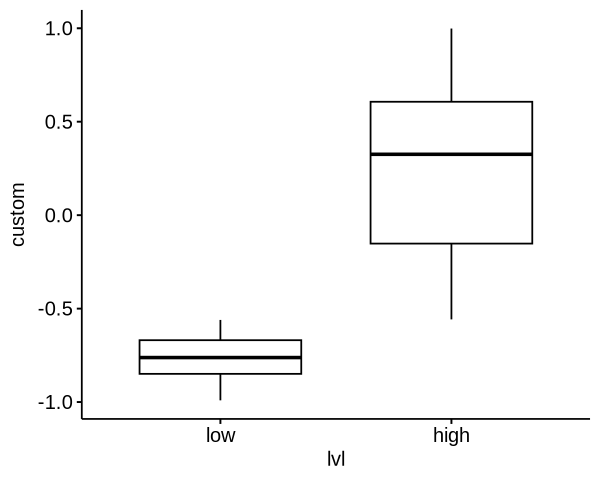

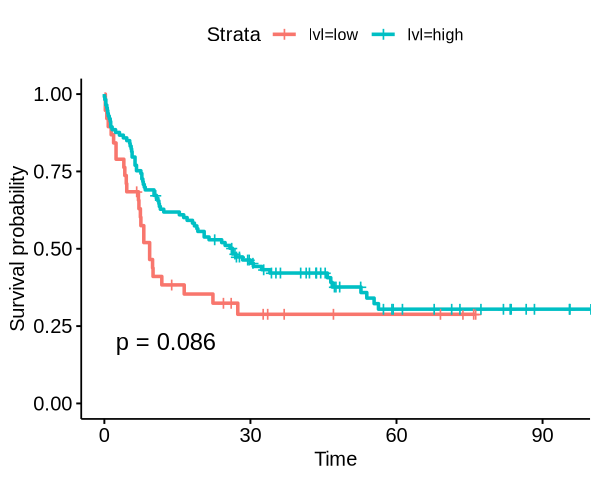

In [214]:
var = 'custom'

gset_custom = list(custom = 'HAL1M8:L1:LINE')
custom_res = gsva(expr = as.matrix(mtx), gset_custom)
custom_res = as.data.table(t(custom_res), keep.rownames = T)
custom_res = merge(dsn_gdc, custom_res, by.x = 'PatientID', by.y = 'rn', all.x = T)

custom_res$lvl = cut_quantile(unlist(custom_res[, var, with = F]), probs = c(0, .25, 1), n_names = c('low', 'high'))
table(custom_res$lvl)

ggboxplot(custom_res, x = 'lvl', y = var)

fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = custom_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = custom_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 


In [240]:
datatable(mtx[rownames(mtx) %in% gset_custom$cl_1, ])

HTML widgets cannot be represented in plain text (need html)

# TE and survival Nov 5

In [126]:
dsn_gdc = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/tcgaAML_clinical_info_only_151_cases_from_GDC.xls')
dsn_gdc[, OS_STATUS := as.numeric(factor(OS_STATUS, levels = c('0:LIVING', '1:DECEASED'))) - 1 ]
logcpm_tcga_te = readRDS(file = '~/WenhuoHu/dataset/tcga/logcpm_tcga_te.rds')
gset = readRDS(file = '~/WenhuoHu/dataset/beataml/gset.rds')
tag12_list = readRDS(file = '~/WenhuoHu/dataset/beataml/tag12_list.rds')


In [129]:
mtx = copy(logcpm_tcga_te)
colnames(mtx) = substr(colnames(mtx), 1, 12)

In [175]:
gsva_res = gsva(expr = as.matrix(mtx), gset)
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res = merge(dsn_gdc, gsva_res, by.x = 'PatientID', by.y = 'rn', all.x = T)
#gsva_res[, OS_MONTHS := as.numeric(OS_Month) ]


Warning message:
"Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva')."
Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throughout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 7160 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



In [201]:
source('~/script/utils.r')

In [207]:
vars_surv_list = lapply(vars, function(var){
    gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = c(0, .25, 1), n_names = c('low', 'high'))
    plotdat = gsva_res[MLL_re == 'WT' & AML1ETO == 'WT' & FLT3ITD == 'WT', ]
    tmp = surv_sum_fun(plotdat)
    tmp
})
names(vars_surv_list) = vars
vars_surv_dt = rbindlist(vars_surv_list, idcol = T) 
vars_surv_dt = vars_surv_dt[order(pval), ]
head(vars_surv_dt) 


.id,rn,records,n.max,n.start,events,rmean,se(rmean),median,0.95LCL,0.95UCL,pval
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
com_17,lvl=low,35,35,35,28,23.82744,7.360229,7.5,4.5,11.8,9.703299e-05
com_17,lvl=high,87,87,87,53,51.47972,5.596024,27.0,19.0,53.9,9.703299e-05
com_31,lvl=low,35,35,35,28,23.82744,7.360229,7.5,4.5,11.8,9.703299e-05
com_31,lvl=high,87,87,87,53,51.47972,5.596024,27.0,19.0,53.9,9.703299e-05
com_199,lvl=low,35,35,35,28,23.82744,7.360229,7.5,4.5,11.8,9.703299e-05
com_199,lvl=high,87,87,87,53,51.47972,5.596024,27.0,19.0,53.9,9.703299e-05


In [208]:
fwrite(vars_surv_dt, file = 'vars_surv_dt.tsv')
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga"


 low high 
  38  113 

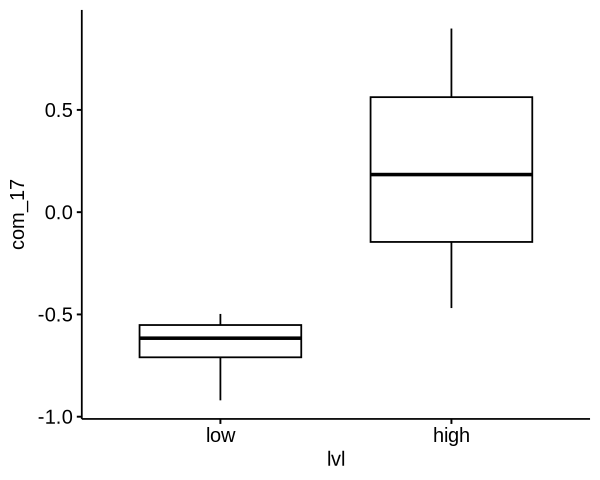

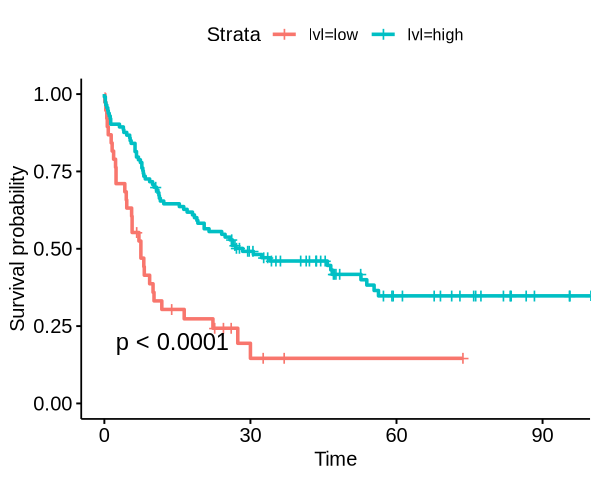

In [191]:
var = 'com_17'
gsva_res$lvl = cut_quantile(unlist(gsva_res[, var, with = F]), probs = c(0, .25, 1), n_names = c('low', 'high'))
table(gsva_res$lvl)
gg1 = ggboxplot(gsva_res, x = 'lvl', y = var)
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
gg2 = ggsurvplot(fit, data = gsva_res, size = 1, pval = TRUE, ggtheme = theme_pubr(), xlim = c(0, 95)) 
gg1 
gg2


In [203]:
gset[['com_17']]

[1] "HAL1M8:L1:LINE" "L1M2a:L1:LINE"  "L1MC:L1:LINE"

In [184]:
surv_sum_fun = function(data, group = 'lvl', os_time = 'OS_MONTHS', os_status = 'OS_STATUS'){
    # Extract p-value
    fm = as.formula(paste0("Surv(", os_time, ', ', os_status, ') ~', group))
    test <- survdiff(fm, data = data)
    p_value <- 1 - pchisq(test$chisq, length(test$n) - 1)
    # Summary of the survfit object
    fit <- survfit(fm, data = data)
    summary_fit <- summary(fit)
    tmp = as.data.table(summary_fit$table, keep.rownames = T)
    tmp$pval = p_value
    tmp$com = var
    tmp
}


In [185]:
gsva_res$lvl = cut_quantile(gsva_res$com_1, probs = c(0, .25, 1), n_names = c('low', 'high'))
gsva_res$lvl
surv_sum_fun(gsva_res)


[1] high high high low  low  high high high high high high high high high high
 [16] high high high high high high low  high high high low  high high high low 
 [31] high low  high high high low  high high high high low  high high low  high
 [46] high low  high high high low  low  high high high low  high high high low 
 [61] high high low  high high low  high high high high high high high high low 
 [76] high low  low  low  high high high high high high high high low  high low 
 [91] high low  high high high low  low  low  high low  high high high high high
[106] high high high high high low  high high high low  high high high high high
[121] high high high high high high low  low  high low  high high low  high high
[136] low  low  low  high high high high high low  high low  high high high high
[151] high
Levels: low high

Surv(OS_MONTHS, OS_STATUS) ~ lvl
<environment: 0x5555bb67b940>


rn,records,n.max,n.start,events,rmean,se(rmean),median,0.95LCL,0.95UCL,pval,com
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
lvl=low,38,38,38,23,45.90182,8.678298,24.8,8.1,NA,0.7763239,line1
lvl=high,113,113,113,74,46.00973,4.874280,19.0,11.3,30,0.7763239,line1


In [176]:
vars = names(gset)
plotdat = gsva_res[MLL_re == 'WT', ]
lapply(vars, function(var){
        plotdat = data[, c(var, 'OS_MONTHS', 'OS_STATUS'), with = F]
        if(is.null(n_names)){n_names = paste0('Q', 1:n_cut)}
        plotdat$lvl = cut_quantile(unlist(data[, var, with = F]), n = n_cut, n_names = n_names)

        # Extract p-value
        test <- survdiff(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
        p_value <- 1 - pchisq(test$chisq, length(test$n) - 1)

        # Summary of the survfit object
        fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
        summary_fit <- summary(fit)
        tmp = as.data.table(summary_fit$table, keep.rownames = T)
        tmp$pval = p_value
        tmp$com = var
        tmp
    }) 
    surv_dt = rbindlist(surv_list)
    surv_dt = surv_dt[order(pval), ]
    surv_dt
}


    })
surv_dt = surv_fun(gsva_res, vars, n_cut = 2)

ERROR: Error in survdiff.fit(y, groups, strata.keep, rho): There is only 1 group


In [137]:
datatable(surv_dt)

Warning message in instance$preRenderHook(instance):
"It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html"


HTML widgets cannot be represented in plain text (need html)

In [138]:
tag12_list[['com_306']]

$tag1
[1] "1(26): high in CMP; 2(24): high in CMP/GMP__1"      
[2] "1(49): high in HSC/Eb/MK; 2(43): high in CMP/MEP__2"

$tag2
[1] "DNA"  "LINE"

In [209]:
l1 = '1(26): high in CMP; 2(24): high in CMP/GMP__1'
l2 = 'LINE'
tmp = lapply(1:length(tag12_list), function(ii){
    ele = tag12_list[[ii]]
    ll1 = ele[['tag1']]
    ll2 = ele[['tag2']]
    lll1 = length(ll1) == length(l1) & length(intersect(l1, ll1)) == length(l1)
    lll2 = length(ll2) == length(l2) & length(intersect(l2, ll2)) == length(l2)
    if(lll1 & lll2){
        ii
    }else{
        0}
})
tmp = unlist(tmp)
which(tmp!=0)

[1] 31

In [210]:
tag12_list[[31]]
names(tag12_list)[31]

$tag1
[1] "1(26): high in CMP; 2(24): high in CMP/GMP__1"

$tag2
[1] "LINE"

[1] "com_31"

In [163]:
source('~/script/utils.r')

In [141]:
gset[['com_31']]

[1] "HAL1M8:L1:LINE" "L1M2a:L1:LINE"  "L1MC:L1:LINE"

In [170]:
line1
intersect(line1, gset[['com_31']])

[1] "L1PA12:L1:LINE" "L1PA2:L1:LINE"  "L1PA10:L1:LINE" "L1MEd:L1:LINE" 
 [5] "L1MA4A:L1:LINE" "L1HS:L1:LINE"   "L1PA3:L1:LINE"  "L1MEc:L1:LINE" 
 [9] "HAL1M8:L1:LINE" "L1ME4b:L1:LINE" "L1MA3:L1:LINE"  "L1PA7:L1:LINE" 
[13] "L1M7:L1:LINE"   "L1M4a2:L1:LINE" "L1MA2:L1:LINE"  "L1MA8:L1:LINE" 
[17] "L1MB2:L1:LINE"  "L1PA16:L1:LINE" "L1ME2:L1:LINE"  "L1PB1:L1:LINE" 
[21] "L1MCa:L1:LINE"  "L1MDa:L1:LINE"  "L1PA6:L1:LINE"  "L1PA4:L1:LINE" 
[25] "L1MA5:L1:LINE"  "L1ME1:L1:LINE"  "L1M3:L1:LINE"   "L1MB3:L1:LINE" 
[29] "L1P1:L1:LINE"   "L1MB8:L1:LINE"  "L1MEf:L1:LINE"  "L1PB4:L1:LINE" 
[33] "L1MEi:L1:LINE"  "L1MC4:L1:LINE"  "L1MA4:L1:LINE"  "L1MD1:L1:LINE"

[1] "HAL1M8:L1:LINE"

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-0.920000 -0.483126 -0.003846 -0.010678  0.450305  0.897692 

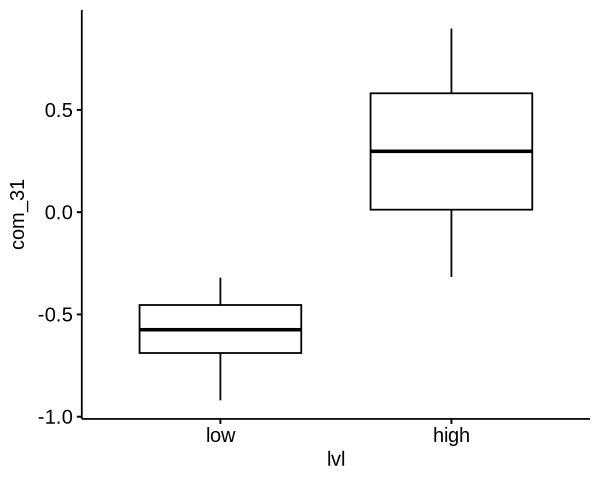

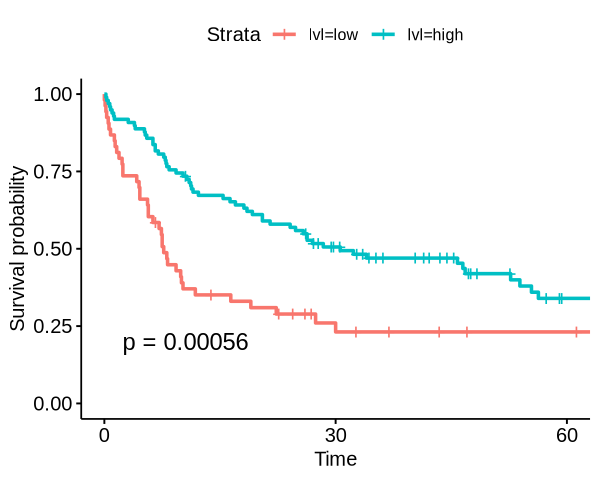

In [168]:
var = 'com_31'
var_val = unlist(gsva_res[, var, with = F])
summary(var_val)
gsva_res$lvl = cut_quantile(var_val, probs = c(0, .35, 1), n_names = c('low', 'high'))
ggboxplot(gsva_res, x = 'lvl', y = var)
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = gsva_res)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = gsva_res,
           size = 1,                 # change line size
           #palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           #legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 60))      # Change ggplot2 theme



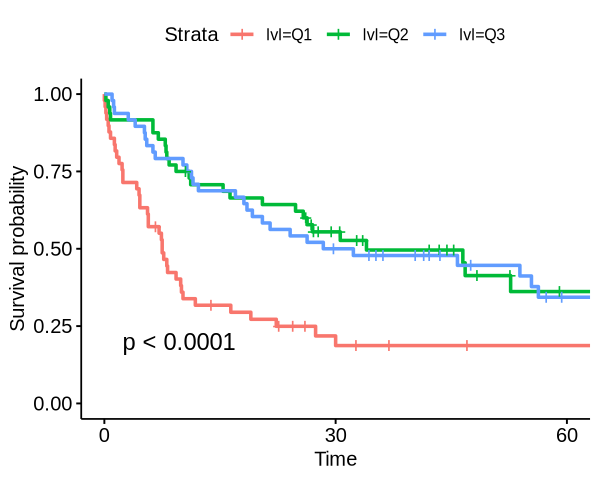

In [155]:
var = 'com_31'
n_names = paste0('Q', 1:3)
plotdat = gsva_res[MLL_re == 'WT', ]
plotdat$lvl = cut_quantile(unlist(plotdat[, var, with = F]), n = 3, n_names = n_names)
#plotdat = plotdat[lvl %in% c('Q1', 'Q3'), ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           #palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           #legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 60))      # Change ggplot2 theme



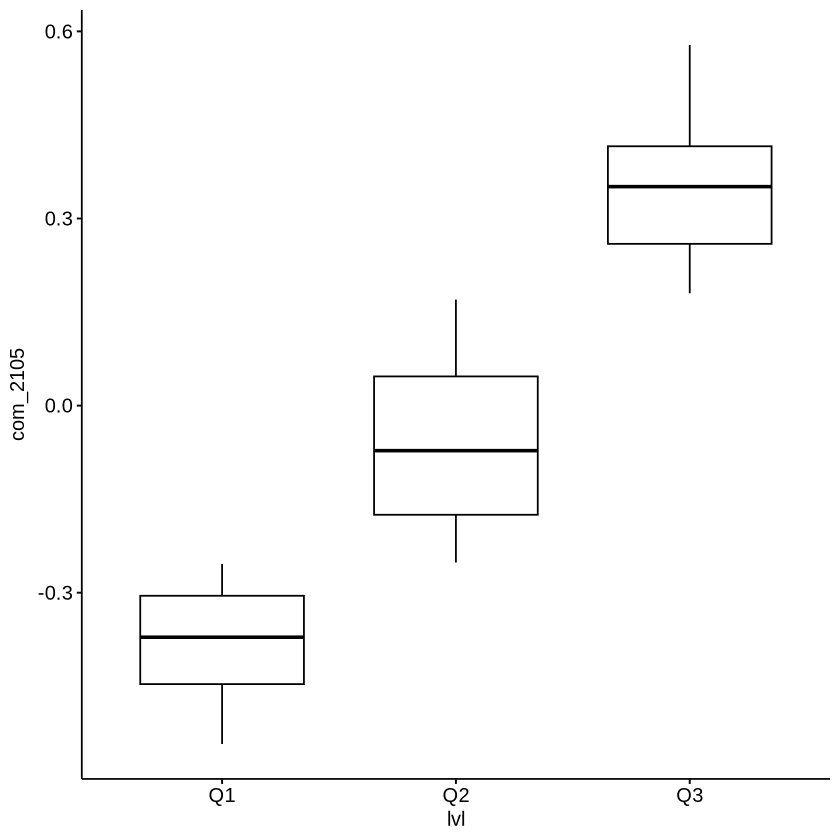

In [42]:
ggboxplot(plotdat, x = 'lvl', y = var)


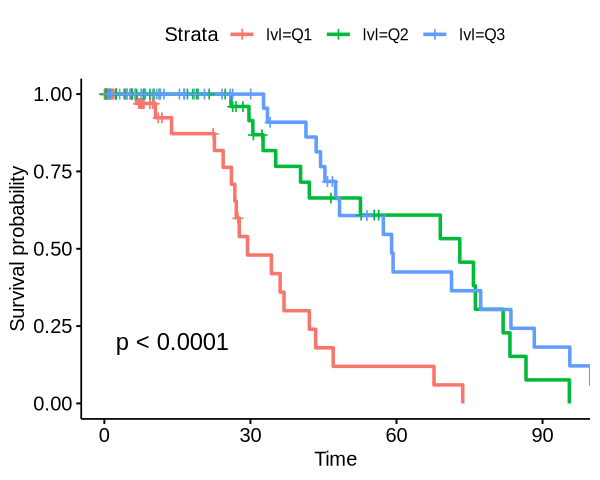

In [43]:
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           #palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           #legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 95))      # Change ggplot2 theme



# CMP related TE in TCGA score

In [146]:
dsn_gdc = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/tcgaAML_clinical_info_only_151_cases_from_GDC.xls')
dim(dsn_gdc)


[1] 151  47

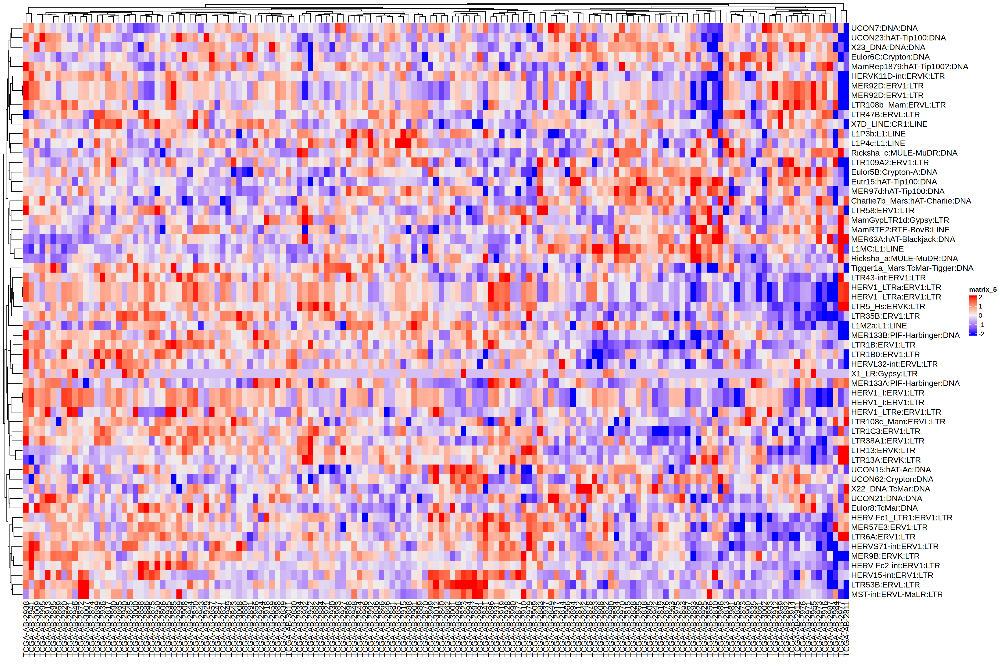

In [149]:
sel = unique(deg_MEPCMP[batch == 'CMP' & abs(logFC) > 2 & FDR < 0.01, ])
plotdat = logcpm_tcga_te[sel$rn,]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 14, repr.plot.res = 200)
draw(hp)

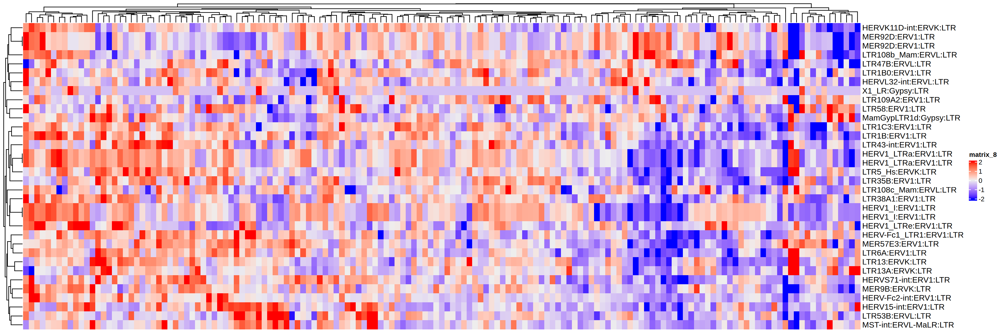

In [153]:
sel = unique(deg_MEPCMP[batch == 'CMP' & abs(logFC) > 2 & FDR < 0.01 & class_id %in% c('LTR'), ])
plotdat = logcpm_tcga_te[sel$rn,]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
args = list(matrix = plotdat, show_column_names = F)
hp = do.call(Heatmap, args)
options(repr.plot.width = 21, repr.plot.height = 7, repr.plot.res = 200)
draw(hp)

In [139]:
sel = unique(deg_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01, ])
table(sel$class_id)



 DNA LINE  LTR 
   3    2   11 

In [140]:
sel = unique(deg_MEPCMP[batch == 'CMP' & logFC < -2 & FDR < 0.01, ])
table(sel$class_id)



 DNA LINE  LTR 
  17    4   23 

In [141]:
sel_up = unique(deg_MEPCMP[batch == 'CMP' & logFC > 2  & FDR < 0.01 & class_id %in% c('DNA', 'LINE', 'LTR'), rn])
sel_dn = unique(deg_MEPCMP[batch == 'CMP' & logFC < -2 & FDR < 0.01 & class_id %in% c('DNA', 'LINE', 'LTR'), rn])
length(sel)

gsva_res = gsva(expr = logcpm_tcga_te, list(CMP_up = sel_up, CMP_dn = sel_dn))
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
gsva_res[, rn := substr(rn , 1, 12) ]
setkey(gsva_res, 'rn')
head(gsva_res)


[1] 11

Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throuhgout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 2 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



rn,CMP_up,CMP_dn
<chr>,<dbl>,<dbl>
TCGA-AB-2805,-0.42618924,-0.01041485
TCGA-AB-2806,0.04609508,0.05212190
TCGA-AB-2808,0.18088083,-0.32102553
TCGA-AB-2810,0.38419291,-0.40625937
TCGA-AB-2811,0.34467566,-0.43877501
TCGA-AB-2812,-0.28554781,-0.14714657


In [160]:
colnames(dsn_gdc) 
dim(dsn_gdc) 


[1] "PatientID"              "SEX"                    "RACE"                  
 [4] "FAB"                    "AGE"                    "BM_BLAST_PERCENTAGE"   
 [7] "WBC"                    "PB_BLAST_PERCENTAGE"    "AML_IN_SKIN_PERCENTAGE"
[10] "CYTOGENETICS"           "CYTOGENETIC_CODE_OTHER" "RISK_CYTO"             
[13] "HISTOLOGICAL_SUBTYPE"   "RISK_MOLECULAR"         "DFS_MONTHS"            
[16] "DFS_STATUS"             "INDUCTION"              "TRANSPLANT_TYPE"       
[19] "DARK_ZONE_STAT"         "OS_MONTHS"              "OS_STATUS"             
[22] "subtype_used"           "BCRABL"                 "karyotype"             
[25] "MLL_re"                 "MA9"                    "AML1ETO"               
[28] "PMLRARA"                "subtype"                "CBFBMYH11"             
[31] "Complex"                "FLT3"                   "FLT3_mut"              
[34] "FLT3ITD"                "TET2_mut"               "DNMT3A_mut"            
[37] "SF3B1_mut"              "TP53_mut"               "PPM1D_mut"             
[40] "ASXL1_mut"              "NRAS_mut"               "JAK2_mut"              
[43] "GNB1_mut"               "KRAS_mut"               "CBL_mut"               
[46] "IDH1_mut"               "IDH2_mut"

[1] 151  47

In [165]:
dsn_gdc[, OS_STATUS := as.numeric(substr(OS_STATUS, 1, 1)) ]
dsn_gdc[, sample_name := PatientID ]

In [166]:
head(dsn_gdc[, .(sample_name, OS_MONTHS, OS_STATUS)])

sample_name,OS_MONTHS,OS_STATUS
<chr>,<dbl>,<dbl>
TCGA-AB-2806,30.6,1
TCGA-AB-2815,26.3,1
TCGA-AB-2819,95.6,0
TCGA-AB-2823,0.2,1
TCGA-AB-2828,99.9,0
TCGA-AB-2840,0.7,1


In [167]:
dsn_gdc$CMP_up_LTR_DNA = gsva_res[dsn_gdc$sample_name, CMP_up]
dsn_gdc$CMP_dn_LTR_DNA = gsva_res[dsn_gdc$sample_name, CMP_dn]


In [171]:
library(forestmodel)


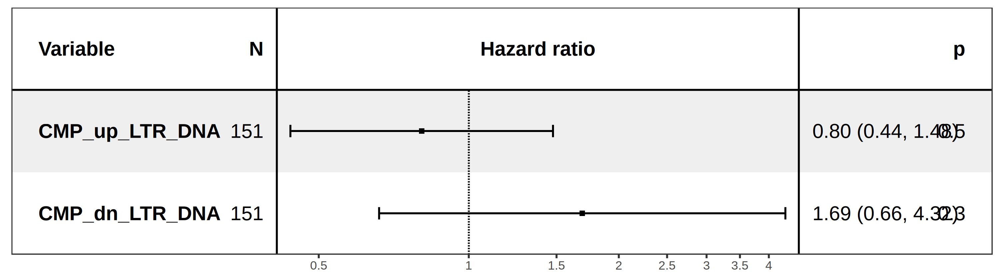

In [173]:
dependent_os  <- "Surv(OS_MONTHS, OS_STATUS)"

fm = as.formula(paste0(dependent_os, ' ~ CMP_up_LTR_DNA + CMP_dn_LTR_DNA '))
mylogit = coxph(fm, data = dsn_gdc)
options(repr.plot.width = 10, repr.plot.height = 2.8, repr.plot.res = 300)
forest_model(mylogit, recalculate_width = F, exponentiate = T, 
                      format_options = forest_model_format_options(text_size = 5, point_size = 1.5, banded = TRUE))



Warning message:
"Removed 28 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 28 rows containing non-finite values (`stat_compare_means()`)."
Warning message:
"Removed 28 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 28 rows containing non-finite values (`stat_compare_means()`)."
Warning message:
"Removed 28 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 28 rows containing non-finite values (`stat_compare_means()`)."


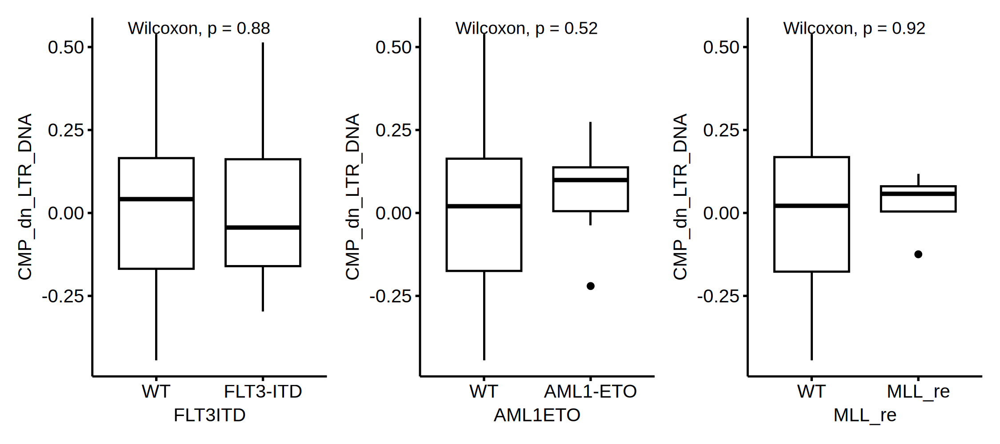

In [117]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plo.res = 300)
plotdat = logcpm_t[grep('TCGA', sample_name),  ]
ggboxplot(plotdat, x = 'FLT3ITD', y = 'CMP_dn_LTR_DNA' ) + stat_compare_means() | 
ggboxplot(plotdat, x = 'AML1ETO', y = 'CMP_dn_LTR_DNA' ) + stat_compare_means() |
ggboxplot(plotdat, x = 'MLL_re',  y = 'CMP_dn_LTR_DNA' )  + stat_compare_means()
#ggboxplot(logcpm_beat_t, x = 'MLL_re', y = 'relapse', add = 'dotplot', add.params = list(color = 'grey', alpha = 0.5)) + stat_compare_means() 


Warning message:
"Removed 28 rows containing non-finite values (`stat_boxplot()`)."
Warning message:
"Removed 28 rows containing non-finite values (`stat_compare_means()`)."


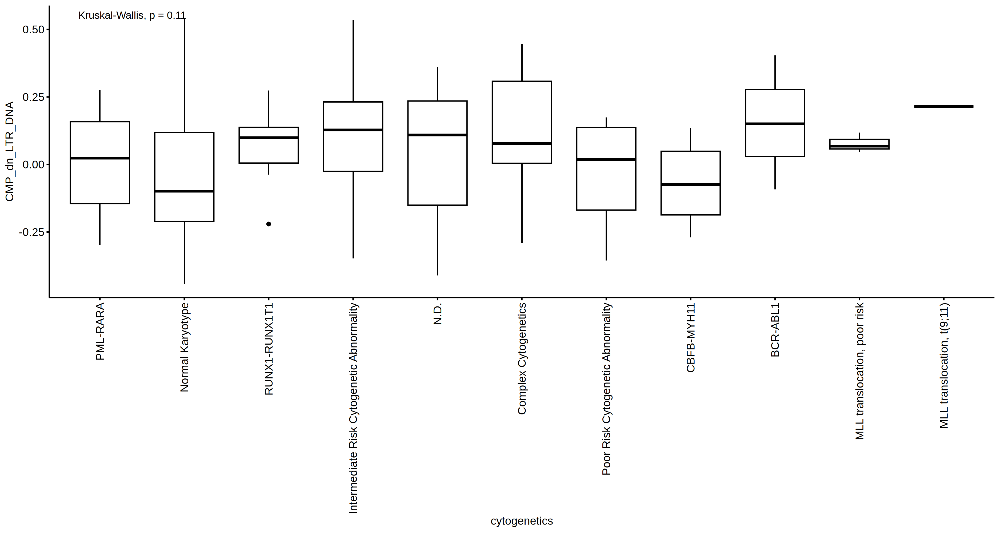

In [118]:
options(repr.plot.width = 15, repr.plot.height = 8, repr.plo.res = 300)
plotdat = logcpm_t[grep('TCGA', sample_name),  ]
ggboxplot(plotdat, x = 'cytogenetics',  y = 'CMP_dn_LTR_DNA' )  + stat_compare_means() + theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1))


In [ ]:
table(logcpm_t[grep('TCGA', sample_name), cytogenetics])

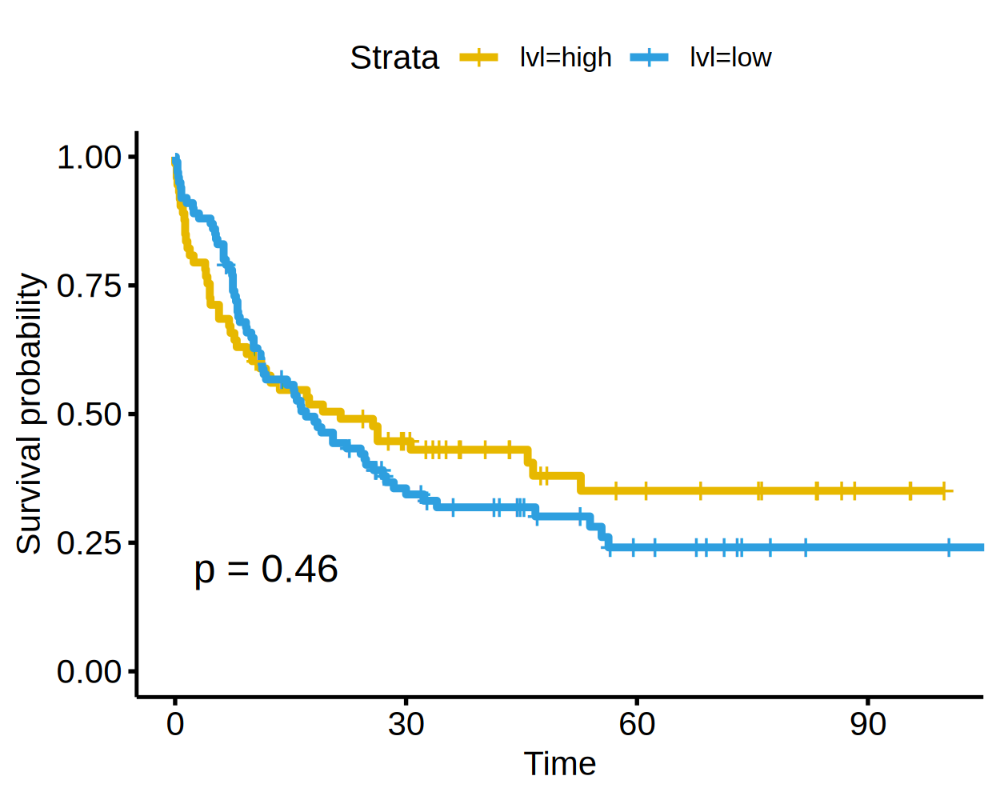

In [119]:
plotdat = logcpm_t[grep('TCGA', sample_name), ]
plotdat[,  lvl := 'high']
plotdat[cytogenetics %in% c('Intermediate Risk Cytogenetic Abnormality', 'Normal Karyotype'),  lvl := 'low']
fit <- survfit(Surv(OS_MONTHS, OS_STATUS2) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat, size = 1, palette =  c("#E7B800", "#2E9FDF"),
           pval = TRUE, #legend.labs =  c("TE High", "TE Low"),
           ggtheme = theme_pubr(), xlim = c(0, 100))    


Warning message in grep("TCGA", sample_name) & cytogenetics %in% c("Intermediate Risk Cytogenetic Abnormality", :
"longer object length is not a multiple of shorter object length"


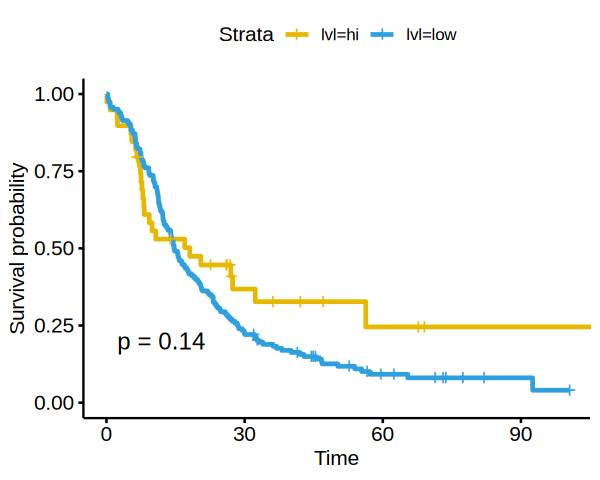

In [300]:
plotdat = logcpm_t[grep('TCGA', sample_name) & cytogenetics %in% c('Intermediate Risk Cytogenetic Abnormality', 'Normal Karyotype'),  ]
plotdat[, lvl := 'low' ]
plotdat[CMP_dn_LTR_DNA > mean(plotdat$CMP_dn_LTR_DNA, na.rm = T), lvl := 'hi' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS2) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat, size = 1, palette =  c("#E7B800", "#2E9FDF"),
           pval = TRUE, #legend.labs =  c("TE High", "TE Low"),
           ggtheme = theme_pubr(), xlim = c(0, 100))    


In [ ]:
plotdat

In [206]:
dim(plotdat)

[1]   359 18932

In [205]:
logcpm_beat_t = copy(plotdat)

# CMP related TElocal signature score

In [181]:
table(deg_telocal_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01, class_id])



 DNA LINE  LTR SINE 
 340 4012  662  352 

In [178]:
sel = unique(deg_telocal_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01 & class_id == 'LTR', rn])
length(sel)


[1] 662

In [ ]:
plotdat = gsva(expr = logcpm_beat_, list(CMP_up = sel))
plotdat = as.data.table(t(plotdat), keep.rownames = T)
head(plotdat)


# INFGR1 vs LTR

In [10]:
head(logcpm_tcga_telocal)

,TCGA-AB-2805,TCGA-AB-2806,TCGA-AB-2808,TCGA-AB-2810,TCGA-AB-2811,TCGA-AB-2812,TCGA-AB-2813,TCGA-AB-2814,TCGA-AB-2815,TCGA-AB-2817,⋯,TCGA-AB-2998,TCGA-AB-2999,TCGA-AB-3000,TCGA-AB-3001,TCGA-AB-3002,TCGA-AB-3007,TCGA-AB-3008,TCGA-AB-3009,TCGA-AB-3011,TCGA-AB-3012
(CATTC)n_dup135:(CATTC)n:Satellite:Satellite,-3.158995,-3.1589949,-3.1589949,-1.0713156,-2.1823873,-1.3509589,-2.4899998,-3.1589949,-3.158995,-3.158995,⋯,-3.158995,-1.793032,-3.158995,-2.033805,-3.1589949,-3.158995,-3.1589949,-0.7153436,-0.3368567,-2.101247
(GAATG)n_dup14:(GAATG)n:Satellite:Satellite,-3.158995,-3.1589949,-3.1589949,-1.3774345,-1.1942273,-3.1589949,-3.1589949,-3.1589949,-3.158995,-3.158995,⋯,-3.158995,-3.158995,-2.042676,-3.158995,-3.1589949,-3.158995,-3.1589949,-2.2421104,-3.1589949,-3.158995
(GAATG)n_dup207:(GAATG)n:Satellite:Satellite,-2.072906,-0.9906659,-0.9577029,-1.0713156,-3.1589949,-0.4109495,-3.1589949,-0.8054145,-1.444479,-2.111400,⋯,-2.525480,-3.158995,-1.420936,-1.175954,-1.4766293,-2.214566,-1.3387142,-0.3077484,-1.0164001,-1.497538
(GAATG)n_dup208:(GAATG)n:Satellite:Satellite,-3.158995,-1.3024998,-2.2332024,-1.3774345,-2.1823873,-0.4109495,-2.4899998,-1.3654958,-3.158995,-1.284118,⋯,-2.525480,-1.299368,-1.698569,-1.688092,-1.7491133,-1.431699,-0.9750008,-0.3993663,-1.2885147,-2.101247
(GAATG)n_dup71:(GAATG)n:Satellite:Satellite,-2.700271,-3.1589949,-2.2332024,-0.8189177,0.2576189,-2.1078756,-0.9763691,-3.1589949,-2.223350,-1.510915,⋯,-3.158995,-3.158995,-2.042676,-2.489377,-0.3360141,-3.158995,-1.3387142,-1.6859523,-0.8974457,-3.158995
A1BG,1.757359,3.3693813,1.8428343,3.0689003,3.9131208,1.1325870,3.3806999,2.4218857,2.104888,2.944496,⋯,3.329098,4.409130,3.570473,3.912330,3.0701993,4.124941,3.1897628,2.3315004,2.3335860,4.008741


pdf 
  2

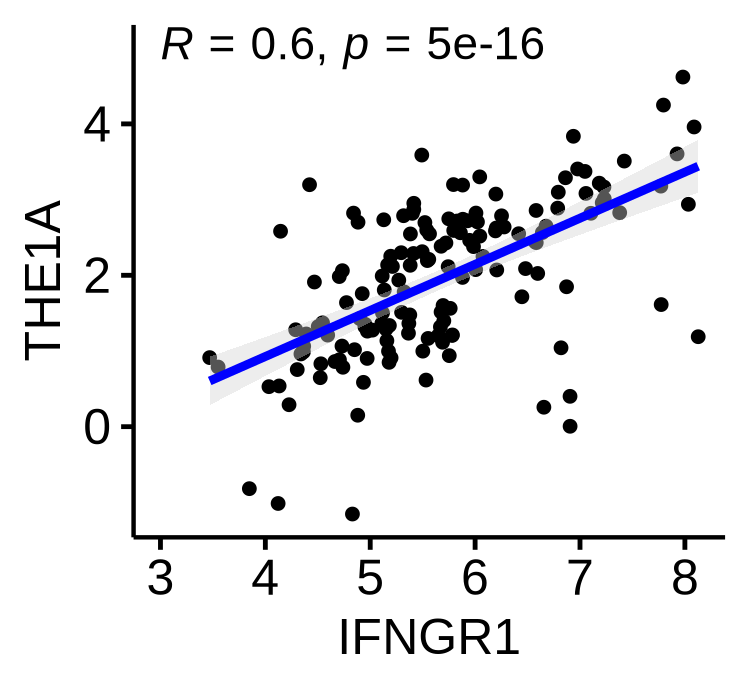

In [65]:
plotdat = as.data.table(t(logcpm_tcga_telocal[c('IFNGR1', 'THE1A_dup1758:THE1A:ERVL-MaLR:LTR'), ]), keep.rownames = T) 
setnames(plotdat, 3, 'THE1A')

options(repr.plot.width = 2.5, repr.plot.height = 2.3, repr.plot.res = 300)
gg = ggscatter(plotdat, x = "IFNGR1", y = "THE1A", size = 1, add = "reg.line", add.params = list(color = "blue", fill = "lightgray"),  conf.int = TRUE  ) + 
stat_cor(method = "pearson", label.x = 3, label.y = 5) 
gg
fname = '~/WenhuoHu/collab_Farhan/plot/tcga_cor.pdf' 
pdf(file = fname, width = 2, height = 2) 
gg
dev.off()


In [66]:
plotdat = merge(plotdat, 
      tcga_clin[, .(PatientID, FLT3ITD, AML1ETO, MLL_re, PMLRARA, CBFBMYH11,  TET2_mut, DNMT3A_mut, SF3B1_mut, TP53_mut, PPM1D_mut, ASXL1_mut, NRAS_mut, JAK2_mut, IDH1_mut, IDH2_mut )],
      by.x = 'rn', by.y = 'PatientID')


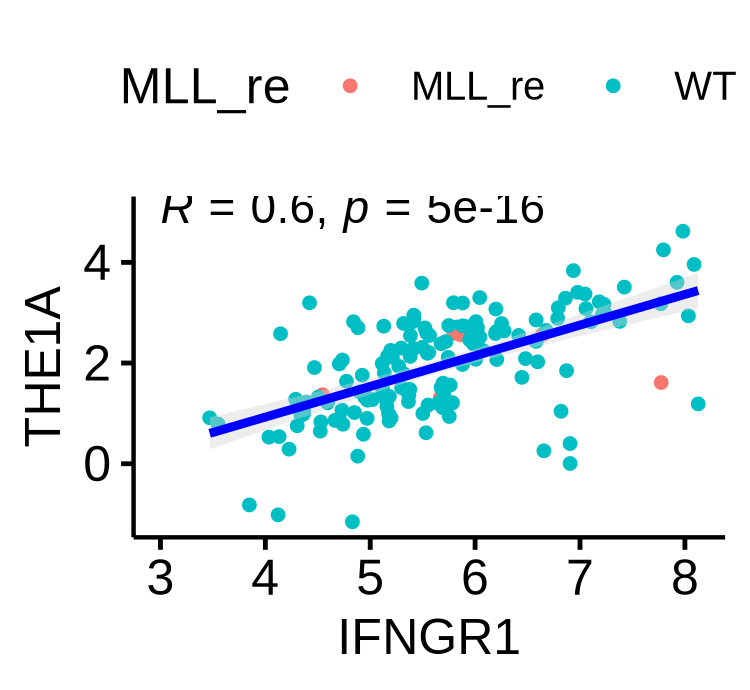

In [74]:
options(repr.plot.width = 2.5, repr.plot.height = 2.3, repr.plot.res = 300)
gg = ggscatter(plotdat, x = "IFNGR1", y = "THE1A", col = 'MLL_re', size = 1, add = "reg.line", add.params = list(color = "blue", fill = "lightgray"),  conf.int = TRUE  ) + 
stat_cor(method = "pearson", label.x = 3, label.y = 5) 
gg


# molecular subtypes

In [59]:
tcga_clin = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/cbio_tcga_clin_Aug21.tsv')

In [292]:
colnames(tcga_clin)
dim(tcga_clin)

[1] "PatientID"              "SEX"                    "RACE"                  
 [4] "FAB"                    "AGE"                    "BM_BLAST_PERCENTAGE"   
 [7] "WBC"                    "PB_BLAST_PERCENTAGE"    "AML_IN_SKIN_PERCENTAGE"
[10] "CYTOGENETICS"           "CYTOGENETIC_CODE_OTHER" "RISK_CYTO"             
[13] "HISTOLOGICAL_SUBTYPE"   "RISK_MOLECULAR"         "DFS_MONTHS"            
[16] "DFS_STATUS"             "INDUCTION"              "TRANSPLANT_TYPE"       
[19] "DARK_ZONE_STAT"         "OS_MONTHS"              "OS_STATUS"             
[22] "subtype_used"           "BCRABL"                 "karyotype"             
[25] "MLL_re"                 "MA9"                    "AML1ETO"               
[28] "PMLRARA"                "subtype"                "CBFBMYH11"             
[31] "Complex"                "FLT3"                   "FLT3_mut"              
[34] "FLT3ITD"                "TET2_mut"               "DNMT3A_mut"            
[37] "SF3B1_mut"              "TP53_mut"               "PPM1D_mut"             
[40] "ASXL1_mut"              "NRAS_mut"               "JAK2_mut"              
[43] "GNB1_mut"               "KRAS_mut"               "CBL_mut"               
[46] "IDH1_mut"               "IDH2_mut"

[1] 200  47

In [294]:
head(tcga_clin[, .(PatientID, karyotype, MLL_re, AML1ETO, FLT3ITD, DNMT3A_mut)])

PatientID,karyotype,MLL_re,AML1ETO,FLT3ITD,DNMT3A_mut
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-AB-2803,Altered,WT,WT,WT,WT
TCGA-AB-2804,Normal,WT,WT,WT,WT
TCGA-AB-2806,Altered,WT,AML1-ETO,WT,WT
TCGA-AB-2815,Altered,WT,WT,WT,WT
TCGA-AB-2819,Altered,WT,AML1-ETO,WT,DNMT3A_mut
TCGA-AB-2823,Altered,WT,WT,WT,WT


In [76]:
gene = 'TP53'
message(gene)
gene_mut = paste0(gene, '_mut')
dsn_sel = tcga_clin_df
dsn_sel$group = 'WT'
dsn_sel$group[dsn_sel[, gene_mut] != 'WT'] = 'mut'
dsn_sel$group = factor(dsn_sel$group, levels = c('WT', 'mut'))
table(dsn_sel$group) 
#mtx = count_df_te[, rownames(dsn_sel) ] 
#deg_fun2(dsn_sel, mtx)


TP53




 WT mut 
142   9 

In [81]:
colnames(tecount_count_df_te) = substr(colnames(tecount_count_df_te), 1, 12)

In [82]:
tmp = tcga_clin[PatientID %in% colnames(tecount_count_df_te), ]
tcga_clin_df = setDF(tmp, rownames = tmp$PatientID)


In [83]:
gene_sel = c('DNMT3A', 'TP53', 'ASXL1', 'KRAS', 'IDH2')
deg_mut_gene = lapply(gene_sel, function(gene){
    gene_mut = paste0(gene, '_mut')
    message(gene)
    dsn1 = tcga_clin_df[tcga_clin_df$karyotype == 'Normal', ]
    dsn2 = tcga_clin_df[tcga_clin_df[, gene_mut] != 'WT', ]
    dsn1 = dsn1[!(rownames(dsn1) %in% rownames(dsn2)), ]
    dsn1$group = 'WT'
    dsn2$group = 'mut'
    dsn_sel = rbind(dsn1, dsn2) 
    dsn_sel$group = factor(dsn_sel$group, levels = c('WT', 'mut'))
    mtx = tecount_count_df_te[, rownames(dsn_sel) ] 
    cat('WT\t', nrow(dsn1), ', \tmut\t', nrow(dsn2))
    deg_fun2(dsn_sel, mtx)
})
names(deg_mut_gene) = gene_sel

DNMT3A



WT	 60 , 	mut	 8

TP53



WT	 61 , 	mut	 9

ASXL1



WT	 59 , 	mut	 7

KRAS



WT	 61 , 	mut	 6

IDH2



WT	 62 , 	mut	 7

In [305]:
gene_sel = c('DNMT3A', 'TP53', 'ASXL1', 'KRAS', 'IDH2')
deg_mut_gene = lapply(gene_sel, function(gene){
    gene_mut = paste0(gene, '_mut')
    message(gene)
    dsn1 = tcga_clin_df[tcga_clin_df$karyotype == 'Normal', ]
    dsn2 = tcga_clin_df[tcga_clin_df[, gene_mut] != 'WT', ]
    dsn1 = dsn1[!(rownames(dsn1) %in% rownames(dsn2)), ]
    dsn1$group = 'WT'
    dsn2$group = 'mut'
    dsn_sel = rbind(dsn1, dsn2) 
    dsn_sel$group = factor(dsn_sel$group, levels = c('WT', 'mut'))
    mtx = tecount_count_df_te[, rownames(dsn_sel) ] 
    deg_fun2(dsn_sel, mtx)
})
names(deg_mut_gene) = gene_sel

DNMT3A

TP53

ASXL1

KRAS

IDH2



In [306]:
#gene_sel = setdiff(aml_genes, c( c('TP53', 'PPM1D', 'ASXL1', 'JAK2', 'GNB1', 'KRAS', 'CBL', 'IDH1'))) 
#gene_sel = c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2')
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11') 
deg_fus_gene = lapply(mut_sel, function(mut){
    message(mut)
    dsn1 = tcga_clin_df[tcga_clin_df$karyotype == 'Normal', ]
    dsn2 = tcga_clin_df[tcga_clin_df[, mut] != 'WT', ]
    dsn1 = dsn1[!(rownames(dsn1) %in% rownames(dsn2)), ]
    dsn1$group = 'WT'
    dsn2$group = 'mut'
    dsn_sel = rbind(dsn1, dsn2) 
    dsn_sel$group = factor(dsn_sel$group, levels = c('WT', 'mut'))
    mtx = tecount_count_df_te[, rownames(dsn_sel) ] 
    deg_fun2(dsn_sel, mtx)
})
names(deg_fus_gene) = mut_sel

AML1ETO

MLL_re

FLT3ITD

PMLRARA

CBFBMYH11



In [308]:
deg_mut = c(deg_mut_gene, deg_fus_gene)
deg_mut_dt = rbindlist(deg_mut, idcol = T)
head(deg_mut_dt)
saveRDS(deg_mut_dt, file = 'deg_mut_dt_tcga.rds')


.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DNMT3A,UCON57:Unknown:Unknown,1.4930130,-0.3017606,6.104411e-06,0.007996778
DNMT3A,UCON9B:PIF-Harbinger:DNA,0.8765605,1.8060750,4.831705e-05,0.022624396
DNMT3A,Charlie11:hAT-Charlie:DNA,0.6255986,4.7081631,6.693416e-05,0.022624396
DNMT3A,LTR109A2:ERV1:LTR,1.1312201,0.0618331,6.908212e-05,0.022624396
DNMT3A,MER41G:ERV1:LTR,0.9315262,3.4538112,3.946949e-04,0.103410056
DNMT3A,LTR9C:ERV1:LTR,0.3396116,4.7948285,6.315339e-04,0.137884893


In [43]:
names(table(deg_mut_dt$.id) )
# AML1ETO ASXL1 CBFBMYH11 DNMT3A FLT3ITD IDH2 KRAS MLL_re PMLRARA TP53


[1] "AML1ETO"   "ASXL1"     "CBFBMYH11" "DNMT3A"    "FLT3ITD"   "IDH2"     
 [7] "KRAS"      "MLL_re"    "PMLRARA"   "TP53"

In [84]:
head(deg_mut_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DNMT3A,UCON57:Unknown:Unknown,1.4930130,-0.3017606,6.104411e-06,0.007996778
DNMT3A,UCON9B:PIF-Harbinger:DNA,0.8765605,1.8060750,4.831705e-05,0.022624396
DNMT3A,Charlie11:hAT-Charlie:DNA,0.6255986,4.7081631,6.693416e-05,0.022624396
DNMT3A,LTR109A2:ERV1:LTR,1.1312201,0.0618331,6.908212e-05,0.022624396
DNMT3A,MER41G:ERV1:LTR,0.9315262,3.4538112,3.946949e-04,0.103410056
DNMT3A,LTR9C:ERV1:LTR,0.3396116,4.7948285,6.315339e-04,0.137884893


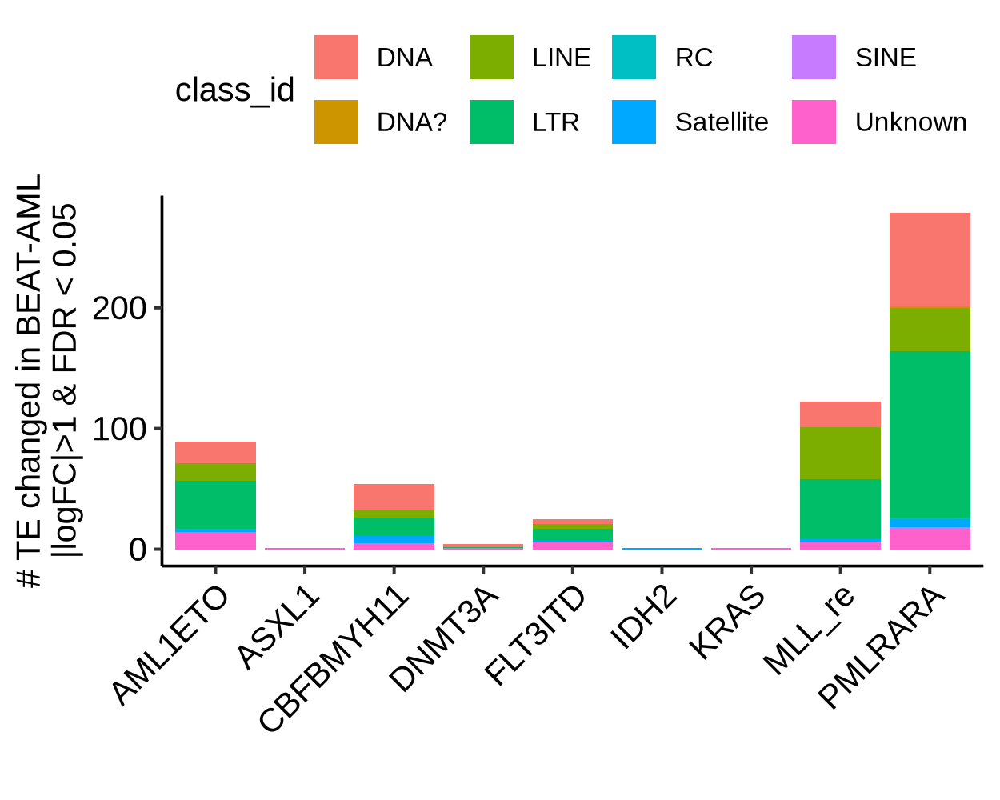

In [50]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 250)
plotdat = deg_mut_dt[FDR < 0.1 & abs(logFC) > 0, ]
plotdat[, class_id := unlist(strsplit(rn, ':'))[3], by = 1:nrow(plotdat)]
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 250)
ggplot(plotdat, aes(x = .id, fill = class_id)) + geom_bar() + theme_pubr() + theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1)) + 
xlab('') + ylab('# TE changed in BEAT-AML\n|logFC|>1 & FDR < 0.05')

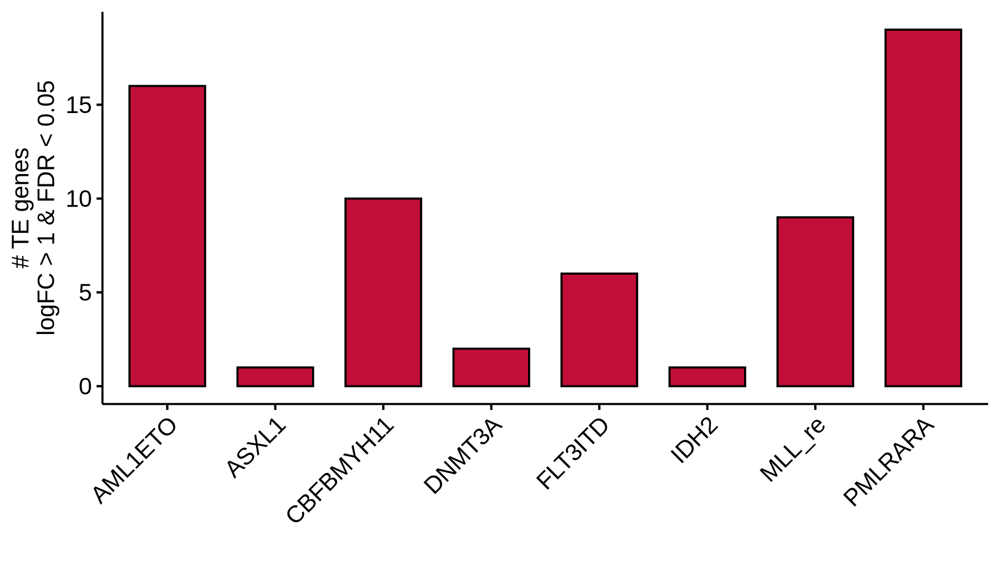

In [310]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 250)
plotdat = as.data.table(table(deg_mut_dt[FDR < 0.05 & abs(logFC) > 1, .id]), keep.rownames = T)
ggbarplot(plotdat, x = 'V1', y = 'N', fill = '#C10F3A') + theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1)) +
ylab('# TE genes\nlogFC > 1 & FDR < 0.05') + xlab('')


In [315]:
head(deg_mut_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DNMT3A,UCON57:Unknown:Unknown,1.4930130,-0.3017606,6.104411e-06,0.007996778
DNMT3A,UCON9B:PIF-Harbinger:DNA,0.8765605,1.8060750,4.831705e-05,0.022624396
DNMT3A,Charlie11:hAT-Charlie:DNA,0.6255986,4.7081631,6.693416e-05,0.022624396
DNMT3A,LTR109A2:ERV1:LTR,1.1312201,0.0618331,6.908212e-05,0.022624396
DNMT3A,MER41G:ERV1:LTR,0.9315262,3.4538112,3.946949e-04,0.103410056
DNMT3A,LTR9C:ERV1:LTR,0.3396116,4.7948285,6.315339e-04,0.137884893


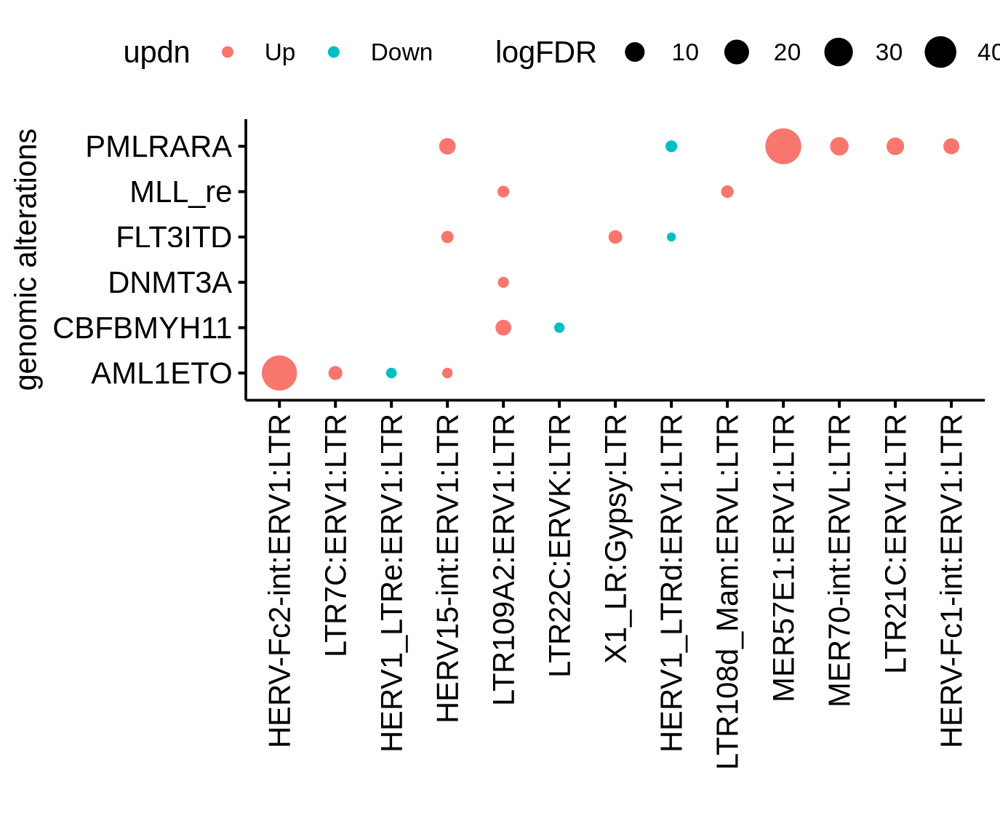

In [334]:
plotdat = deg_mut_dt[FDR < 0.05 & abs(logFC) > 1 & grepl('LTR$', rn), ]
plotdat[, logFDR := -log(FDR, 10) ]
plotdat[, updn := 'Not Sig.' ]
plotdat[FDR < 0.05 & abs(logFC) > 1 & logFC > 0, updn := 'Up' ]
plotdat[FDR < 0.05 & abs(logFC) > 1 & logFC < 0, updn := 'Down' ]
plotdat[, updn := factor(updn, levels = c('Up', 'Down')) ]
options(repr.plot.width = 5.5, repr.plot.height = 4.5, repr.plot.res = 250)
ggdotchart(plotdat, y = '.id', x = 'rn', col = 'updn', size = 'logFDR') + xlab('') + ylab('genomic alterations')


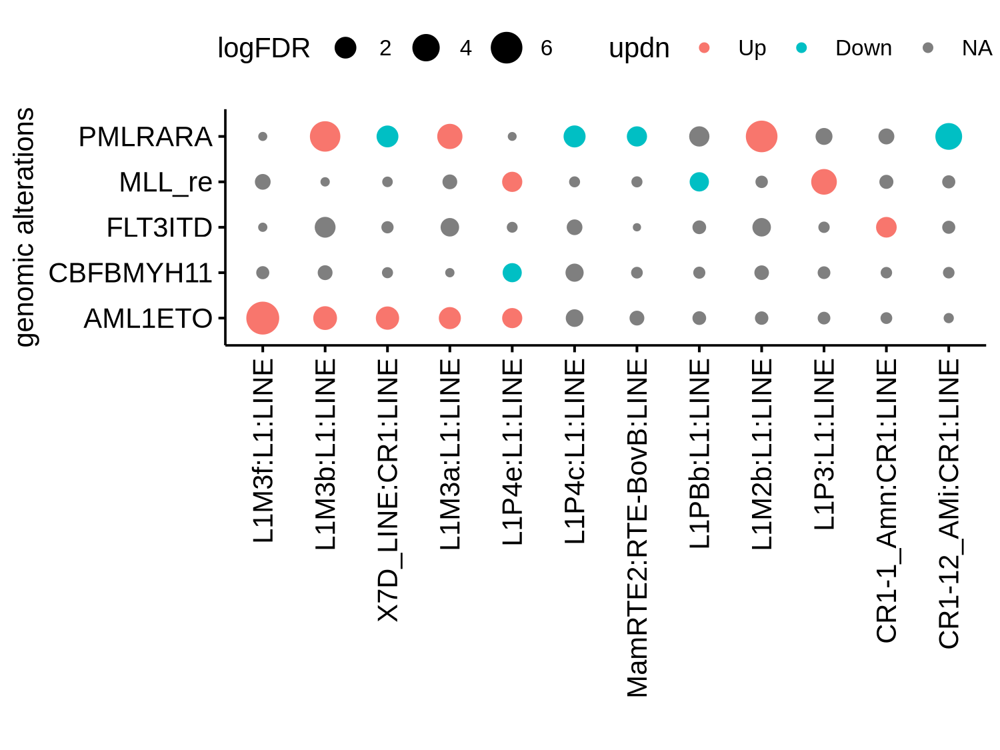

In [319]:
plotdat = deg_mut_dt[FDR < 0.05 & abs(logFC) > .5 & grepl('LINE$', rn), ]
plotdat = deg_mut_dt[.id %in% plotdat$.id & rn %in% plotdat$rn, ]
plotdat[, logFDR := -log(FDR, 10) ]
plotdat[, updn := 'Not Sig.' ]
plotdat[FDR < 0.05 & abs(logFC) > .5 & grepl('LINE$', rn) & logFC > 0, updn := 'Up' ]
plotdat[FDR < 0.05 & abs(logFC) > .5 & grepl('LINE$', rn) & logFC < 0, updn := 'Down' ]
plotdat[, updn := factor(updn, levels = c('Up', 'Down')) ]
options(repr.plot.width = 6, repr.plot.height = 4.5, repr.plot.res = 250)
ggdotchart(plotdat, y = '.id', x = 'rn', col = 'updn', size = 'logFDR') + xlab('') + ylab('genomic alterations')

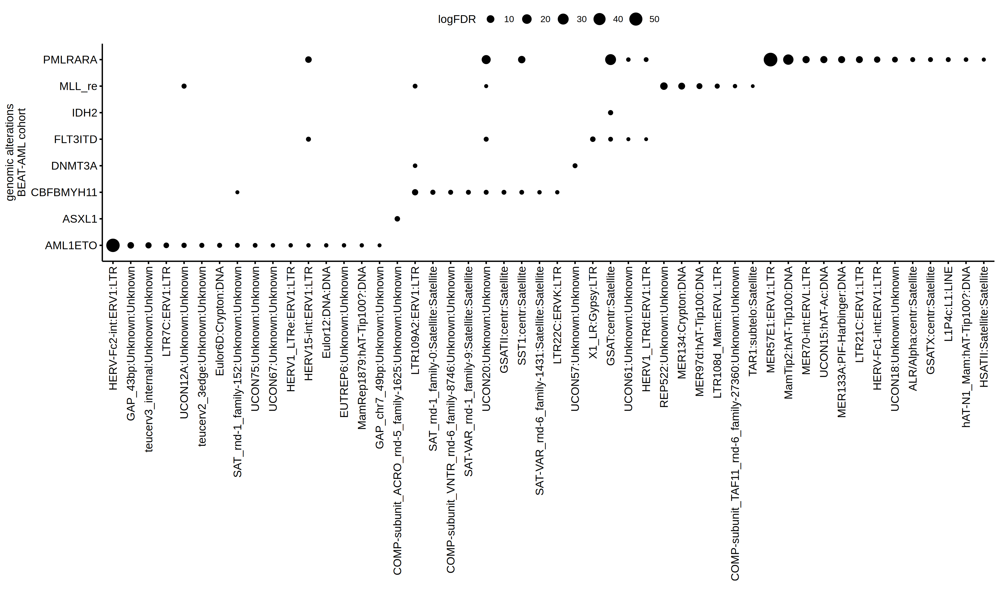

In [63]:
plotdat = deg_mut_dt[FDR < 0.05 & abs(logFC) > 1, ]
plotdat[, logFDR := -log(FDR, 10) ]
options(repr.plot.width = 15, repr.plot.height = 9, repr.plot.res = 250)
ggdotchart(plotdat, y = '.id', x = 'rn', fill = 'logFC', size = 'logFDR') + xlab('') + ylab('genomic alterations\nBEAT-AML cohort')

In [48]:
colnames(logcpm_tcga_te) = substr(colnames(logcpm_tcga_te), 1, 12)

In [60]:
col_sel = c('AML1ETO', 'ASXL1_mut', 'CBFBMYH11', 'DNMT3A_mut', 'FLT3ITD', 'IDH2_mut', 'KRAS_mut', 'MLL_re', 'PMLRARA', 'TP53_mut')
tcga_clin_df$subtype = unlist(apply(tcga_clin_df[, col_sel], 1, function(xx){paste(unique(xx), collapse = '_')}))

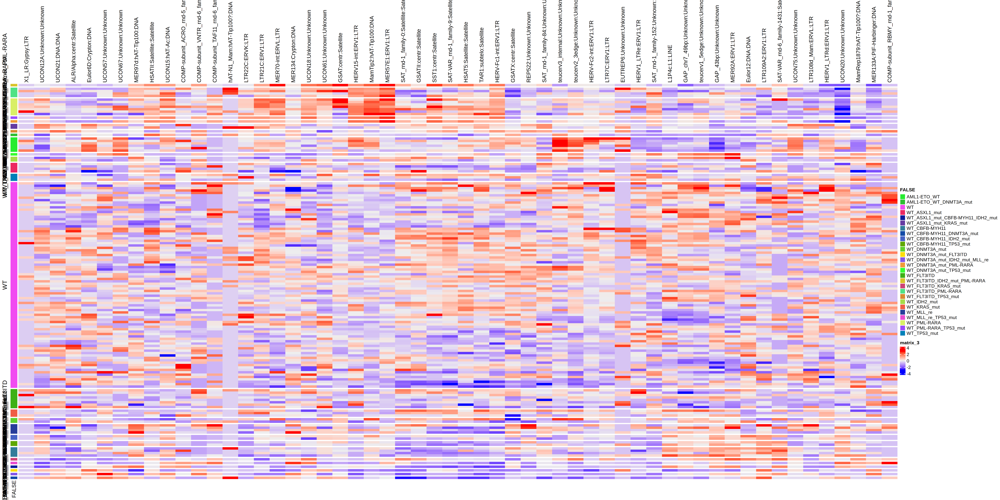

In [61]:
rn_sel = unique(deg_mut_dt[FDR < 0.1 & abs(logFC) > 1, rn])
plotdat = logcpm_tcga_te[rn_sel, rownames(tcga_clin_df)]
plotdat = scale_fun(plotdat)
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM', 'karyotype')
gene_mut = paste0(c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2'), '_mut')
#column_ha = HeatmapAnnotation(df = dsn_df[, c(mut_sel, gene_mut)])
options(repr.plot.width = 30, repr.plot.height = 15, repr.plot.res = 250)
row_ha = rowAnnotation(df = tcga_clin_df[, 'subtype', drop = F], annotation_label = F)
#Heatmap(t(plotdat), top_annotation = column_ha, row_names_gp = grid::gpar(fontsize = 7), show_row_names = T, show_column_names = F, show_column_dend = F, show_row_dend = F)
Heatmap(t(plotdat), left_annotation = row_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = F, show_column_names = T, 
        show_column_dend = F, show_row_dend = F, column_names_side = 'top', row_split = tcga_clin_df$subtype)


In [40]:
saveRDS(deg_mut_dt, file = 'deg_mut_dt.rds')

In [ ]:
deg_tcga_aml_mut_dt = copy(deg_mut_dt)
add_gene_list(deg_tcga_aml_mut_dt, comment = 'DEG TE genes by comparing TCGA AML subtypes, from tcga_aml_t2t.ipynb') 

In [87]:
gene_list = read_file('gene_list')

Current maximum version: 4 	 ~/WenhuoHu/collab_Farhan//gene_list_v4.rds 


## subtype TE in blueprint datasets

In [ ]:
see blueprint notebook

# rigi

In [ ]:
colnames(logcpm_tcga_coding) = substring(colnames(logcpm_tcga_coding), 1, 12)

tcga_clin[, subtype2 := 'WT']
for(ii in aml_mut){
    if(length(intersect(ii, colnames(tcga_clin))) > 0){
        tcga_clin[get(ii)  != 'WT', subtype2 := ii]
    }
}

tmp = tcga_clin[PatientID %in% colnames(logcpm_tcga_coding), ]
tcga_clin_df = setDF(tmp, rownames = tmp$PatientID)
head(tcga_clin_df)


#logcpm_all[rownames(logcpm_all) %in% c('MDA5', 'RIGI', 'LGP2'), , drop = F]
options(repr.plot.width = 10, repr.plot.height = 2, repr.plot.res = 250)

plotdat = logcpm_tcga_coding[rownames(logcpm_tcga_coding) %in% c('IFIH1', 'RIGI', 'DHX58', 'DDX41', 'TLR3', 'IFNGR1'), tcga_clin_df$PatientID, drop = F]
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
col_ha = HeatmapAnnotation(df = tcga_clin_df[, 'subtype2', drop = F])
fname = '~/WenhuoHu/collab_Farhan/plot/tcga_subtype_sensor.pdf'
pdf(file = fname, width = 10, height = 2)
Heatmap(plotdat, top_annotation = col_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = T, show_column_names = F, column_title_gp = gpar(fontsize = 5), 
        show_column_dend = F, show_row_dend = F, column_split = factor(tcga_clin_df$subtype2))
dev.off()
Heatmap(plotdat, top_annotation = col_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = T, show_column_names = F, column_title_gp = gpar(fontsize = 5), 
        show_column_dend = F, show_row_dend = F, column_split = factor(tcga_clin_df$subtype2))

,PatientID,SEX,RACE,FAB,AGE,BM_BLAST_PERCENTAGE,WBC,PB_BLAST_PERCENTAGE,AML_IN_SKIN_PERCENTAGE,CYTOGENETICS,⋯,PPM1D_mut,ASXL1_mut,NRAS_mut,JAK2_mut,GNB1_mut,KRAS_mut,CBL_mut,IDH1_mut,IDH2_mut,subtype2
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<int>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>
TCGA-AB-2806,TCGA-AB-2806,Male,WHITE,M1,46,90,29.4,81,n.d.,"45,X,-Y, t(8;7;21)(q22;p15;q22[22]/46,XY[3]",⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,AML1ETO
TCGA-AB-2815,TCGA-AB-2815,Male,WHITE,M4,49,81,57.1,48,n.d.,"46,XY,inv(16)(p13q22)[17]/46,XY[3]",⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,CBFBMYH11
TCGA-AB-2819,TCGA-AB-2819,Female,WHITE,M2,52,67,4.1,18,n.d.,"46,XX,t(8;21)(q22;q22)[17]/46,XX[3]",⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,AML1ETO
TCGA-AB-2823,TCGA-AB-2823,Female,WHITE,M3,61,73,86.4,68,n.d.,"47,XX,t(15;17)(q22:q21)+mar[20]",⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,PMLRARA
TCGA-AB-2828,TCGA-AB-2828,Male,WHITE,M4,55,35,22.2,8,n.d.,"46,XY,t(2;4)(q34;q21)inv(16)(p13q22) [20]",⋯,WT,ASXL1_mut,WT,WT,WT,WT,WT,WT,IDH2_mut,CBFBMYH11
TCGA-AB-2840,TCGA-AB-2840,Male,WHITE,M3,74,51,31.5,NA,n.d.,"46,XY,t(15;17)(q22;q21)[20]",⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,PMLRARA


# relapse signature score

In [174]:
tecount_relapse_sel

rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
MER34B-int:ERV1:LTR,-1.2598763,11.936033,3.046357e-05,0.01290234,LTR,ERV1,MER34B-int
MER61F:ERV1:LTR,-0.9363334,9.101731,5.124604e-05,0.01290234,LTR,ERV1,MER61F
LTR12C:ERV1:LTR,-1.4863020,14.276986,6.612084e-04,0.05683418,LTR,ERV1,LTR12C
LTR43-int:ERV1:LTR,0.9056203,7.452546,1.335299e-03,0.08851699,LTR,ERV1,LTR43-int
MER57F:ERV1:LTR,-1.1333632,10.610649,1.780049e-03,0.08851699,LTR,ERV1,MER57F
LTR54:ERV1:LTR,-0.7126964,10.651244,2.258450e-03,0.10050158,LTR,ERV1,LTR54
HERV-Fc1-int:ERV1:LTR,0.9123125,9.050033,3.314395e-03,0.11331087,LTR,ERV1,HERV-Fc1-int
MamGypLTR4:Gypsy:LTR,-0.7527141,7.824582,4.911494e-03,0.14362012,LTR,Gypsy,MamGypLTR4
LTR7Y:ERV1:LTR,-0.7806781,9.039026,4.988633e-03,0.14362012,LTR,ERV1,LTR7Y


In [71]:
tecount_relapse_sel_LTR_up_id = tecount_relapse_sel[class_id == 'LTR' & logFC < 0, rn]
tecount_relapse_sel_LTR_up_id


[1] "MER34B-int:ERV1:LTR"  "MER61F:ERV1:LTR"      "LTR12C:ERV1:LTR"     
[4] "MER57F:ERV1:LTR"      "LTR54:ERV1:LTR"       "MamGypLTR4:Gypsy:LTR"
[7] "LTR7Y:ERV1:LTR"       "HERV30-int:ERV1:LTR"  "HERV9NC-int:ERV1:LTR"

In [84]:
telocal_relapse_sel[class_id == 'LTR', rn]

[1] "LTR14C:ERVK:LTR"        "MER67B:ERV1:LTR"        "ERVL-B4-int:ERVL:LTR"  
 [4] "LTR22B2:ERVK:LTR"       "LTR14B:ERVK:LTR"        "Harlequin-int:ERV1:LTR"
 [7] "LTR5B:ERVK:LTR"         "LTR21C:ERV1:LTR"        "LTR43-int:ERV1:LTR"    
[10] "HERVK14-int:ERVK:LTR"   "MER9a1:ERVK:LTR"        "PABL_A-int:ERV1:LTR"   
[13] "MER52A:ERV1:LTR"        "LTR43B:ERV1:LTR"        "LTR24:ERV1:LTR"        
[16] "MER61F:ERV1:LTR"        "MLT2A2:ERVL:LTR"

In [86]:
head2(tecount_count_df_te)

,TCGA-AB-2805,TCGA-AB-2806,TCGA-AB-2808,TCGA-AB-2810,TCGA-AB-2811
,<int>,<int>,<int>,<int>,<int>
(CATTC)n:Satellite:Satellite,7,22,8,23,57
(GAATG)n:Satellite:Satellite,15,52,40,67,106
7SLRNA:srpRNA:srpRNA,19,30,5,34,24


In [98]:
plotdat = gsva(expr = as.matrix(tecount_count_df_te), list(relapse_LTR_UP = telocal_relapse_sel[class_id == 'LTR', rn]))
plotdat = as.data.table(t(plotdat), keep.rownames = T)
head(plotdat)


Warning message in .filterFeatures(expr, method):
"7 genes with constant expression values throuhgout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



rn,relapse_LTR_UP
<chr>,<dbl>
TCGA-AB-2805,-0.3348113
TCGA-AB-2806,0.2106705
TCGA-AB-2808,-0.5403453
TCGA-AB-2810,-0.4901844
TCGA-AB-2811,-0.2083933
TCGA-AB-2812,-0.5694024


In [99]:
plotdat = merge(plotdat, tcga_clin, by.x = 'rn', by.y = 'PatientID')
dim(plotdat)

[1] 151  48

In [ ]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plo.res = 300)
ggboxplot(plotdat, x = 'FLT3ITD', y = 'relapse_LTR_UP' ) + stat_compare_means() | 
ggboxplot(plotdat, x = 'AML1ETO', y = 'relapse_LTR_UP' ) + stat_compare_means() |
ggboxplot(plotdat, x = 'MLL_re',  y = 'relapse_LTR_UP' )  + stat_compare_means()
#ggboxplot(logcpm_beat_t, x = 'MLL_re', y = 'relapse', add = 'dotplot', add.params = list(color = 'grey', alpha = 0.5)) + stat_compare_means() 


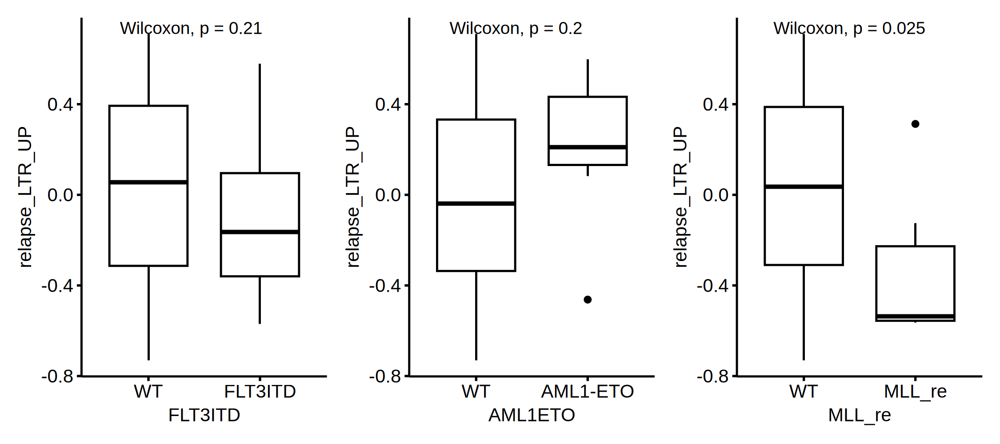

In [94]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plo.res = 300)
ggboxplot(plotdat, x = 'FLT3ITD', y = 'relapse_LTR_UP' ) + stat_compare_means() | 
ggboxplot(plotdat, x = 'AML1ETO', y = 'relapse_LTR_UP' ) + stat_compare_means() |
ggboxplot(plotdat, x = 'MLL_re',  y = 'relapse_LTR_UP' )  + stat_compare_means()
#ggboxplot(logcpm_beat_t, x = 'MLL_re', y = 'relapse', add = 'dotplot', add.params = list(color = 'grey', alpha = 0.5)) + stat_compare_means() 


In [94]:
library(survminer)
library(survival)


Attaching package: 'survival'


The following object is masked from 'package:survminer':

    myeloma




In [97]:
colnames(plotdat)

[1] "relapse_LTR_UP" "OS_MONTHS"      "OS_STATUS"      "lvl"

In [100]:
gsav_dt = copy(plotdat)


In [101]:
colnames(gsav_dt)


[1] "rn"                     "relapse_LTR_UP"         "SEX"                   
 [4] "RACE"                   "FAB"                    "AGE"                   
 [7] "BM_BLAST_PERCENTAGE"    "WBC"                    "PB_BLAST_PERCENTAGE"   
[10] "AML_IN_SKIN_PERCENTAGE" "CYTOGENETICS"           "CYTOGENETIC_CODE_OTHER"
[13] "RISK_CYTO"              "HISTOLOGICAL_SUBTYPE"   "RISK_MOLECULAR"        
[16] "DFS_MONTHS"             "DFS_STATUS"             "INDUCTION"             
[19] "TRANSPLANT_TYPE"        "DARK_ZONE_STAT"         "OS_MONTHS"             
[22] "OS_STATUS"              "subtype_used"           "BCRABL"                
[25] "karyotype"              "MLL_re"                 "MA9"                   
[28] "AML1ETO"                "PMLRARA"                "subtype"               
[31] "CBFBMYH11"              "Complex"                "FLT3"                  
[34] "FLT3_mut"               "FLT3ITD"                "TET2_mut"              
[37] "DNMT3A_mut"             "SF3B1_mut"              "TP53_mut"              
[40] "PPM1D_mut"              "ASXL1_mut"              "NRAS_mut"              
[43] "JAK2_mut"               "GNB1_mut"               "KRAS_mut"              
[46] "CBL_mut"                "IDH1_mut"               "IDH2_mut"

In [107]:
plotdat = gsav_dt[, .(relapse_LTR_UP, OS_MONTHS, OS_STATUS)]
plotdat[, OS_STATUS := as.numeric(substr(OS_STATUS, 1, 1)) ]


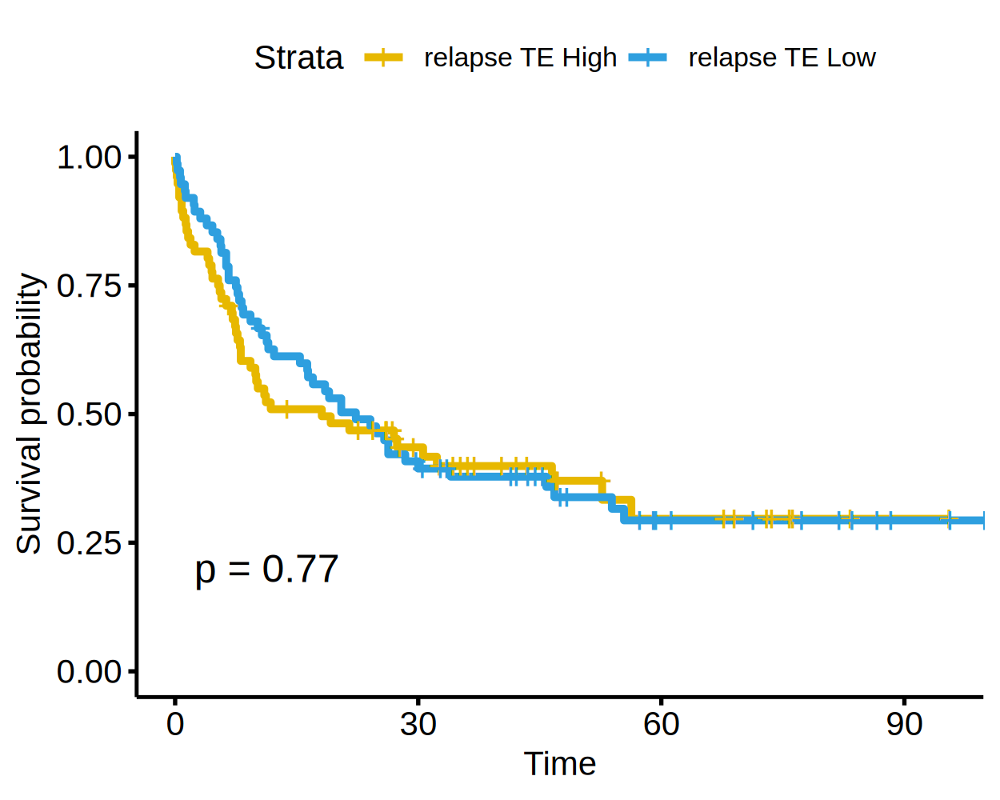

In [108]:
plotdat[, OS_STATUS := as.numeric(OS_STATUS) ]
plotdat[, lvl := 'low' ]
plotdat[relapse_LTR_UP > mean(plotdat$relapse_LTR_UP, na.rm = T), lvl := 'hi' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 95))      # Change ggplot2 theme



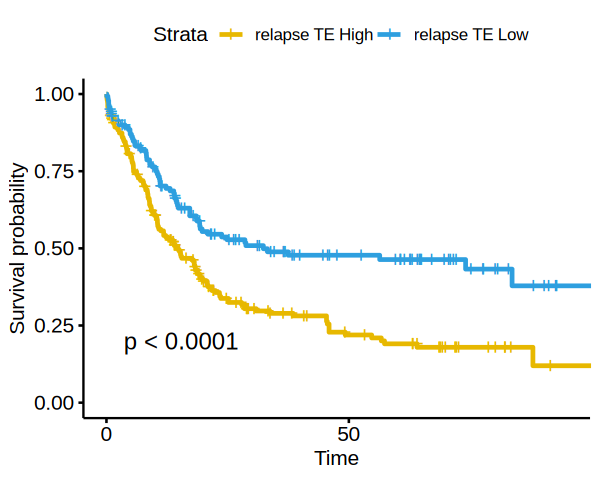

In [96]:
plotdat = logcpm_beat_t[, .(relapse_LTR_UP, BCAT1, OS_MONTHS, OS_STATUS)]
plotdat[, OS_STATUS := as.numeric(OS_STATUS) ]
plotdat[, lvl := 'low' ]
plotdat[BCAT1 > mean(plotdat$BCAT1, na.rm = T), lvl := 'hi' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 95))      # Change ggplot2 theme



# NMF

In [ ]:
library(NMF)
meth <- nmfAlgorithm(version='R')
meth <- c(names(meth), meth)
meth
plotdat = log2( 1 + 2 ^ logcpm_tcga_te)
#plotdat = scale_fun(plotdat)
#row_sd = apply(logcpm_tcga_te, 1, sd) 
#summary(row_sd)
#plotdat = logcpm_tcga_te[row_sd > .65, ]
res <- nmf(plotdat, 500, meth, seed=123456)
saveRDS(res, file = 'res_v3.rds')

Loading required package: registry

Loading required package: rngtools

Loading required package: cluster

NMF - BioConductor layer [OK] | Shared memory capabilities [NO: bigmemory] | Cores 2/2

  To enable shared memory capabilities, try: install.extras('
NMF
')


Attaching package: 'NMF'


The following object is masked from 'package:BiocParallel':

    register


The following object is masked from 'package:nlme':

    coef<-


The following object is masked from 'package:S4Vectors':

    nrun




brunet         lee 
   "brunet"       "lee"    "offset"     "nsNMF" ".R#brunet"    ".R#lee" 
     offset       nsNMF 
".R#offset"  ".R#nsNMF"

Compute NMF method 'brunet' [1/8] ... 

Warning message in validityMethod(object):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(object):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(object):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"


OK
Compute NMF method 'lee' [2/8] ... 

Warning message in validityMethod(object):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(object):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(object):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"


OK
Compute NMF method 'offset' [3/8] ... 

Warning message in validityMethod(as(object, superClass)):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(as(object, superClass)):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(as(object, superClass)):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"


OK
Compute NMF method 'nsNMF' [4/8] ... 

Warning message in validityMethod(as(object, superClass)):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(as(object, superClass)):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"
Warning message in validityMethod(as(object, superClass)):
"Dimensions of W and H look strange [ncol(W)= 500 > ncol(H)= 151 ]"


In [ ]:
res

# export 

In [ ]:
saveRDS(logcpm_tcga_coding,      file = 'logcpm_tcga_coding.rds')
saveRDS(logcpm_tcga_te,          file = 'logcpm_tcga_te.rds')
saveRDS(logcpm_tcga_coding_te_t, file = 'logcpm_tcga_coding_te_t.rds')


In [ ]:
saveRDS(logcpm_tcga_telocal, file = 'logcpm_tcga_aml_telocal.rds')
saveRDS(count_df, file = 'tcga_aml_telocal_raw_count.rds')


In [ ]:
saveRDS(tecount_count_df_coding, file = 'tecount_count_df_coding.rds')
saveRDS(tecount_count_df_te, file = 'tecount_count_df_te.rds')


In [5]:
tecount_count_df_coding = readRDS(file = 'tecount_count_df_coding.rds')
tecount_count_df_te     = readRDS(file = 'tecount_count_df_te.rds')
deg_mut_dt = readRDS(file = 'deg_mut_dt_tcga.rds')


In [ ]:
saveRDS(count_df, file = 'tcga_aml_telocal_raw_count.rds')


In [6]:
tcga_clin = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/cbio_tcga_clin_Aug21.tsv')


In [7]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga"

In [105]:
fwrite(dsn, file = 'tcgaAML_dsn_2024Dec02.tsv')


In [7]:
logcpm_tcga_coding = readRDS(file = 'logcpm_tcga_coding.rds')
logcpm_tcga_te = readRDS(file = 'logcpm_tcga_te.rds')
logcpm_tcga_coding_te_t = readRDS(file = 'logcpm_tcga_coding_te_t.rds')


In [8]:
logcpm_tcga_telocal = readRDS(file = 'logcpm_tcga_aml_telocal.rds')
telocal_df = readRDS(file = 'tcga_aml_telocal_raw_count.rds')


In [81]:
dim(logcpm_tcga_telocal)

[1] 658795    151

In [9]:
dsn = fread(file = 'tcgaAML_dsn_15Jul.tsv')


In [120]:
dim(dsn)
dim(tcga_clin)

[1] 151  51

[1] 200  47

In [13]:
dsn[, sample_name2 := sample_name]
dsn[, sample_name := substring(sample_name, 1, 12) ]


In [10]:
dsn_clin = merge(tcga_clin, dsn, by.y = 'sample_name', by.x = 'PatientID', all.x = T)

In [135]:
fwrite(dsn_clin, file = 'tcga_dsn_clin.tsv')

In [11]:
head(dsn[, .(sample_name, tecount_file) ])
head(dsn_clin[, .(PatientID, tecount_file) ])

sample_name,tecount_file
<chr>,<chr>
TCGA-AB-2914-03A-01T-0734-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2914-03A-01T-0734-13/tecount.cntTable
TCGA-AB-2987-03A-01T-0734-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2987-03A-01T-0734-13/tecount.cntTable
TCGA-AB-2812-03A-01T-0734-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2812-03A-01T-0734-13/tecount.cntTable
TCGA-AB-2943-03A-01T-0740-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2943-03A-01T-0740-13/tecount.cntTable
TCGA-AB-2940-03A-01T-0736-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2940-03A-01T-0736-13/tecount.cntTable
TCGA-AB-2970-03A-01T-0734-13,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/tcga/TCGA-AB-2970-03A-01T-0734-13/tecount.cntTable


PatientID,tecount_file
<chr>,<chr>
TCGA-AB-2802,NA
TCGA-AB-2803,NA
TCGA-AB-2804,NA
TCGA-AB-2805,NA
TCGA-AB-2806,NA
TCGA-AB-2807,NA
